# Base Project Structure Analysis
**Stage 0 — Before any commit processing**

This notebook retrieves and analyses the **base structural snapshot** of the Apache Groovy project at its first substantive commit (the first commit containing Java source files). No semantic subgraphs yet — only the declarative layer:

> Directories → Files → Classes → Methods/Functions

Goals:
1. Count every structural entity (dirs, files, packages, classes, interfaces, methods, fields)
2. Build a NetworkX hierarchy graph
3. Visualise the tree structure and distributions
4. Provide a clean foundation for later subgraph layers

In [2]:
# ── Imports ────────────────────────────────────────────────────────────────
import os
import subprocess
import sys
from pathlib import Path
from collections import defaultdict, Counter

import javalang
import networkx as nx
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

matplotlib.rcParams['figure.dpi'] = 120
matplotlib.rcParams['font.size'] = 10

print(f"javalang  {javalang.__version__}")
print(f"networkx  {nx.__version__}")
print(f"matplotlib {matplotlib.__version__}")

javalang  0.13.0
networkx  3.3
matplotlib 3.9.3


In [3]:
# ── Configuration ──────────────────────────────────────────────────────────
PROJECT_ROOT = Path(r"c:\Users\sinab\Documents\GitHub\KG-Commit")
REPO_PATH    = PROJECT_ROOT / "repos" / "apache" / "groovy"

# First commit that introduced Java source files in this repo
BASE_COMMIT  = "408b29851d7bbe4d343340832297e4be7e0c5578"

print(f"Repo   : {REPO_PATH}")
print(f"Commit : {BASE_COMMIT}")

Repo   : c:\Users\sinab\Documents\GitHub\KG-Commit\repos\apache\groovy
Commit : 408b29851d7bbe4d343340832297e4be7e0c5578


## 1. Checkout the Base Commit

In [3]:
def git(cmd, cwd=REPO_PATH):
    result = subprocess.run(
        ["git"] + cmd.split(),
        cwd=str(cwd), capture_output=True, text=True
    )
    return result.stdout.strip(), result.stderr.strip()

# Save current branch/HEAD so we can return later
current_head, _ = git("rev-parse HEAD")
print(f"Current HEAD  : {current_head[:12]}")

# Checkout the base commit in detached HEAD mode
out, err = git(f"checkout {BASE_COMMIT}")
confirmed, _ = git("rev-parse HEAD")
print(f"Checked out   : {confirmed[:12]}")

# Show commit info
info, _ = git("log -1 --pretty=format:%H|%an|%ae|%ci|%s")
sha, author, email, date, msg = info.split('|', 4)
print(f"\nCommit  : {sha[:12]}")
print(f"Author  : {author} <{email}>")
print(f"Date    : {date}")
print(f"Message : {msg}")

Current HEAD  : 408b29851d7b
Checked out   : 408b29851d7b

Commit  : 408b29851d7b
Author  : James Strachan <jastrachan@mac.com>
Date    : 2003-09-11 14:11:56 +0000
Message : refactored the source tree to make things a little cleaner.


## 2. Discover All Source Files

In [4]:
java_files = sorted(REPO_PATH.rglob("*.java"))
groovy_files = sorted(REPO_PATH.rglob("*.groovy"))

# Collect unique directories that contain Java files
dirs_with_java = sorted({f.parent for f in java_files})

print(f"Java files   : {len(java_files)}")
print(f"Groovy files : {len(groovy_files)}")
print(f"Directories  : {len(dirs_with_java)}")

# Show top-level directory breakdown
top_dirs = Counter()
for f in java_files:
    parts = f.relative_to(REPO_PATH).parts
    top_dirs[parts[0]] += 1

print("\nTop-level directory breakdown:")
for d, cnt in top_dirs.most_common():
    print(f"  {d:<30} {cnt:>4} java files")

Java files   : 120
Groovy files : 3
Directories  : 20

Top-level directory breakdown:
  src                             120 java files


## 3. Parse All Java Files with javalang

In [5]:
# ── Data containers ────────────────────────────────────────────────────────
records = []       # one dict per parsed entity
parse_errors = []

def safe_name(node):
    return getattr(node, 'name', None) or '<anonymous>'

def modifiers_str(node):
    mods = getattr(node, 'modifiers', None) or set()
    return ','.join(sorted(mods))

for fpath in java_files:
    rel = fpath.relative_to(REPO_PATH)
    parts = rel.parts
    
    # Derive directory path and package from file path
    dir_path = str(rel.parent)
    
    try:
        src = fpath.read_text(encoding='utf-8', errors='replace')
        tree = javalang.parse.parse(src)
    except Exception as e:
        parse_errors.append((str(rel), str(e)))
        continue
    
    pkg = tree.package.name if tree.package else '<default>'
    imports = [imp.path for imp in tree.imports] if tree.imports else []
    
    # Walk all type declarations
    for path, node in tree:
        if isinstance(node, (javalang.tree.ClassDeclaration,
                             javalang.tree.InterfaceDeclaration,
                             javalang.tree.EnumDeclaration,
                             javalang.tree.AnnotationDeclaration)):
            cls_name = safe_name(node)
            cls_type = type(node).__name__.replace('Declaration', '')
            
            # Fields
            fields = []
            if hasattr(node, 'fields') and node.fields:
                for f in node.fields:
                    for decl in f.declarators:
                        fields.append({
                            'kind': 'field',
                            'file': str(rel),
                            'dir': dir_path,
                            'package': pkg,
                            'class': cls_name,
                            'name': decl.name,
                            'type': str(getattr(f, 'type', None)),
                            'modifiers': modifiers_str(f),
                        })
            
            # Methods and constructors
            methods = []
            for member_name in ('methods', 'constructors'):
                members = getattr(node, member_name, None) or []
                for m in members:
                    params = []
                    if hasattr(m, 'parameters') and m.parameters:
                        params = [str(p.type) for p in m.parameters]
                    methods.append({
                        'kind': 'constructor' if member_name == 'constructors' else 'method',
                        'file': str(rel),
                        'dir': dir_path,
                        'package': pkg,
                        'class': cls_name,
                        'name': safe_name(m),
                        'return_type': str(getattr(m, 'return_type', None)),
                        'params': params,
                        'param_count': len(params),
                        'modifiers': modifiers_str(m),
                    })
            
            records.append({
                'kind': 'class',
                'file': str(rel),
                'dir': dir_path,
                'package': pkg,
                'class': cls_name,
                'class_type': cls_type,
                'modifiers': modifiers_str(node),
                'n_methods': len(methods),
                'n_fields': len(fields),
                'imports': imports,
            })
            records.extend(methods)
            records.extend(fields)

print(f"Parsed successfully : {len(java_files) - len(parse_errors)} / {len(java_files)} files")
print(f"Parse errors        : {len(parse_errors)}")
if parse_errors:
    print("\nFirst 5 errors:")
    for f, e in parse_errors[:5]:
        print(f"  {f}: {e[:80]}")

Parsed successfully : 120 / 120 files
Parse errors        : 0


## 4. Summary Statistics

In [6]:
classes  = [r for r in records if r['kind'] == 'class']
methods  = [r for r in records if r['kind'] == 'method']
ctors    = [r for r in records if r['kind'] == 'constructor']
fields   = [r for r in records if r['kind'] == 'field']

packages = sorted({r['package'] for r in classes})
dirs_found = sorted({r['dir'] for r in classes})

print("=" * 52)
print(f"  BASE STRUCTURE SUMMARY — Apache Groovy")
print(f"  Commit : {BASE_COMMIT[:12]}")
print("=" * 52)
print(f"  Directories (with Java)  : {len(dirs_found):>6}")
print(f"  Java Files               : {len(java_files) - len(parse_errors):>6}")
print(f"  Packages                 : {len(packages):>6}")
print(f"  Classes  (Class)         : {sum(1 for c in classes if c['class_type']=='Class'):>6}")
print(f"  Interfaces               : {sum(1 for c in classes if c['class_type']=='Interface'):>6}")
print(f"  Enums                    : {sum(1 for c in classes if c['class_type']=='Enum'):>6}")
print(f"  Annotations              : {sum(1 for c in classes if c['class_type']=='Annotation'):>6}")
print(f"  Total Type Declarations  : {len(classes):>6}")
print(f"  Methods                  : {len(methods):>6}")
print(f"  Constructors             : {len(ctors):>6}")
print(f"  Fields                   : {len(fields):>6}")
print("=" * 52)

  BASE STRUCTURE SUMMARY — Apache Groovy
  Commit : 408b29851d7b
  Directories (with Java)  :     20
  Java Files               :    120
  Packages                 :     12
  Classes  (Class)         :    117
  Interfaces               :      5
  Enums                    :      0
  Annotations              :      0
  Total Type Declarations  :    122
  Methods                  :    937
  Constructors             :     90
  Fields                   :    324


In [7]:
# ── Per-package breakdown ─────────────────────────────────────────────────
pkg_classes = Counter(r['package'] for r in classes)
pkg_methods = Counter(r['package'] for r in methods)

print(f"{'Package':<55} {'Classes':>7} {'Methods':>7}")
print("-" * 72)
for pkg in sorted(pkg_classes, key=lambda p: -pkg_classes[p]):
    print(f"{pkg:<55} {pkg_classes[pkg]:>7} {pkg_methods.get(pkg, 0):>7}")

Package                                                 Classes Methods
------------------------------------------------------------------------
org.codehaus.groovy.ast                                      31     135
org.codehaus.groovy.runtime                                  17     121
org.codehaus.groovy.classgen                                 14      82
org.codehaus.groovy.syntax.lexer                             14     143
org.codehaus.groovy.interpreter                              11      64
org.codehaus.groovy.syntax                                   10     153
org.codehaus.groovy.lang                                      9      45
org.codehaus.groovy.syntax.parser                             9     142
org.codehaus.groovy.tools                                     3      22
org.codehaus.groovy                                           2       5
groovy.lang                                                   1       0
org.codehaus.groovy.ant                                       1

In [8]:
# ── File → Class → Method breakdown ──────────────────────────────────────
print(f"{'File':<65} {'Classes':>7} {'Methods':>7} {'Fields':>7}")
print("-" * 92)
file_classes = defaultdict(list)
for c in classes:
    file_classes[c['file']].append(c)

for fpath in sorted(file_classes):
    cls_list = file_classes[fpath]
    total_methods = sum(c['n_methods'] for c in cls_list)
    total_fields  = sum(c['n_fields']  for c in cls_list)
    print(f"{fpath:<65} {len(cls_list):>7} {total_methods:>7} {total_fields:>7}")

File                                                              Classes Methods  Fields
--------------------------------------------------------------------------------------------
src\main\groovy\lang\Bitwise.java                                       1       0       0
src\main\org\codehaus\groovy\GroovyException.java                       1       0       0
src\main\org\codehaus\groovy\ant\Groovyc.java                           1      26       8
src\main\org\codehaus\groovy\ast\ASTNode.java                           1       1       1
src\main\org\codehaus\groovy\ast\AssertStatement.java                   1       5       2
src\main\org\codehaus\groovy\ast\BinaryExpression.java                  1       7       3
src\main\org\codehaus\groovy\ast\BooleanExpression.java                 1       3       1
src\main\org\codehaus\groovy\ast\ClassNode.java                         1      15       8
src\main\org\codehaus\groovy\ast\ConstantExpression.java                1       5       4
src\mai

## 5. Build the Structural NetworkX Graph

In [9]:
G = nx.DiGraph()

# Node-type colours (same palette as the KG viz)
NODE_COLORS = {
    'PROJECT':   '#2C3E50',
    'DIR':       '#8C8C8C',
    'FILE':      '#937860',
    'PACKAGE':   '#CCB974',
    'CLASS':     '#4C72B0',
    'INTERFACE': '#64B5CD',
    'ENUM':      '#FF8C00',
    'ANNOTATION':'#DA8BC3',
    'METHOD':    '#55A868',
    'CONSTRUCTOR':'#1F77B4',
    'FIELD':     '#98DF8A',
}

# Root project node
G.add_node('PROJECT:groovy', type='PROJECT', label='groovy')

# ── Add directories ───────────────────────────────────────────────────────
for d in dirs_found:
    parts = Path(d).parts
    # Add each path segment
    for i, part in enumerate(parts):
        nid  = 'DIR:' + '/'.join(parts[:i+1])
        G.add_node(nid, type='DIR', label=part)
        parent = 'DIR:' + '/'.join(parts[:i]) if i > 0 else 'PROJECT:groovy'
        G.add_edge(parent, nid, rel='CONTAINS_DIR')

# ── Add files ─────────────────────────────────────────────────────────────
for fpath in (java_files):
    rel  = fpath.relative_to(REPO_PATH)
    fid  = f'FILE:{rel}'
    G.add_node(fid, type='FILE', label=rel.name)
    parent_dir = 'DIR:' + str(rel.parent) if str(rel.parent) != '.' else 'PROJECT:groovy'
    G.add_edge(parent_dir, fid, rel='CONTAINS_FILE')

# ── Add packages ──────────────────────────────────────────────────────────
for pkg in packages:
    pid = f'PACKAGE:{pkg}'
    G.add_node(pid, type='PACKAGE', label=pkg.split('.')[-1])
    G.add_edge('PROJECT:groovy', pid, rel='HAS_PACKAGE')

# ── Add classes / interfaces / enums / annotations ────────────────────────
for c in classes:
    ctype = c['class_type'].upper()
    cid   = f"{ctype}:{c['package']}.{c['class']}"
    G.add_node(cid, type=ctype, label=c['class'],
               modifiers=c['modifiers'], n_methods=c['n_methods'],
               n_fields=c['n_fields'])
    # File contains class
    fid = f"FILE:{c['file']}"
    G.add_edge(fid, cid, rel='DEFINES')
    # Package contains class
    pid = f"PACKAGE:{c['package']}"
    G.add_edge(pid, cid, rel='HAS_CLASS')

# ── Add methods ───────────────────────────────────────────────────────────
method_counter = defaultdict(int)
for m in methods + ctors:
    ctype = 'CLASS'   # methods live in any type; use CLASS as fallback
    # Find the parent class node (try all type variants)
    parent_cid = None
    for t in ('CLASS', 'INTERFACE', 'ENUM', 'ANNOTATION'):
        candidate = f"{t}:{m['package']}.{m['class']}"
        if G.has_node(candidate):
            parent_cid = candidate
            break
    if parent_cid is None:
        continue
    key = f"{parent_cid}::{m['name']}"
    method_counter[key] += 1
    idx = method_counter[key]
    mid = f"{m['kind'].upper()}:{m['package']}.{m['class']}.{m['name']}_{idx}"
    G.add_node(mid, type=m['kind'].upper(), label=m['name'],
               param_count=m['param_count'], modifiers=m['modifiers'])
    G.add_edge(parent_cid, mid, rel='HAS_METHOD')

# ── Add fields ────────────────────────────────────────────────────────────
field_counter = defaultdict(int)
for f in fields:
    parent_cid = None
    for t in ('CLASS', 'INTERFACE', 'ENUM', 'ANNOTATION'):
        candidate = f"{t}:{f['package']}.{f['class']}"
        if G.has_node(candidate):
            parent_cid = candidate
            break
    if parent_cid is None:
        continue
    key = f"{parent_cid}::{f['name']}"
    field_counter[key] += 1
    idx = field_counter[key]
    fid2 = f"FIELD:{f['package']}.{f['class']}.{f['name']}_{idx}"
    G.add_node(fid2, type='FIELD', label=f['name'], modifiers=f['modifiers'])
    G.add_edge(parent_cid, fid2, rel='HAS_FIELD')

# ── Graph summary ─────────────────────────────────────────────────────────
type_counts = Counter(nx.get_node_attributes(G, 'type').values())
print("Graph node counts:")
for t, cnt in sorted(type_counts.items(), key=lambda x: -x[1]):
    print(f"  {t:<15} {cnt:>5}")
print(f"\nTotal nodes : {G.number_of_nodes():>6}")
print(f"Total edges : {G.number_of_edges():>6}")

edge_types = Counter(d['rel'] for _, _, d in G.edges(data=True))
print("\nEdge relation counts:")
for rel, cnt in sorted(edge_types.items(), key=lambda x: -x[1]):
    print(f"  {rel:<20} {cnt:>5}")

Graph node counts:
  METHOD            937
  FIELD             324
  FILE              120
  CLASS             117
  CONSTRUCTOR        90
  DIR                28
  PACKAGE            12
  INTERFACE           5
  PROJECT             1

Total nodes :   1654
Total edges :   1755

Edge relation counts:
  HAS_METHOD            1027
  HAS_FIELD              324
  DEFINES                122
  HAS_CLASS              122
  CONTAINS_FILE          120
  CONTAINS_DIR            28
  HAS_PACKAGE             12


## 6. Visualisations

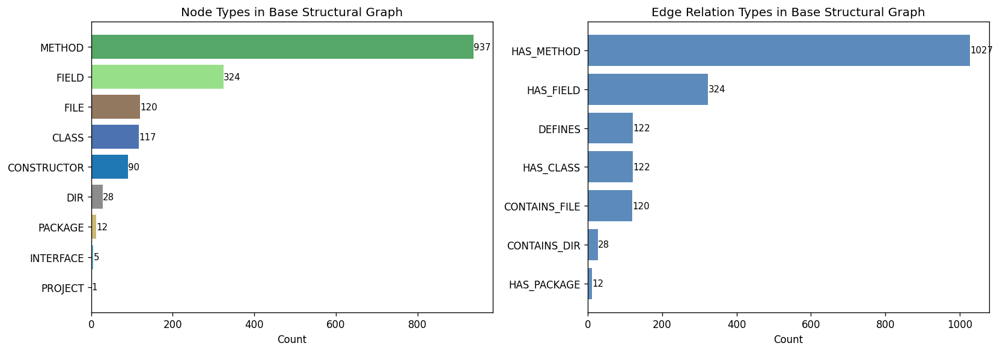

In [10]:
# ── 6a. Node-type distribution bar chart ──────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Node types
node_types_sorted = sorted(type_counts.items(), key=lambda x: -x[1])
labels_n, counts_n = zip(*node_types_sorted)
colors_n = [NODE_COLORS.get(t, '#AAAAAA') for t in labels_n]
axes[0].barh(labels_n, counts_n, color=colors_n)
axes[0].set_xlabel('Count')
axes[0].set_title('Node Types in Base Structural Graph')
axes[0].invert_yaxis()
for i, v in enumerate(counts_n):
    axes[0].text(v + 0.5, i, str(v), va='center', fontsize=9)

# Edge relation types
edge_sorted = sorted(edge_types.items(), key=lambda x: -x[1])
labels_e, counts_e = zip(*edge_sorted)
axes[1].barh(labels_e, counts_e, color='#5C8BBB')
axes[1].set_xlabel('Count')
axes[1].set_title('Edge Relation Types in Base Structural Graph')
axes[1].invert_yaxis()
for i, v in enumerate(counts_e):
    axes[1].text(v + 0.5, i, str(v), va='center', fontsize=9)

plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_node_edge_types.png'), bbox_inches='tight')
plt.show()

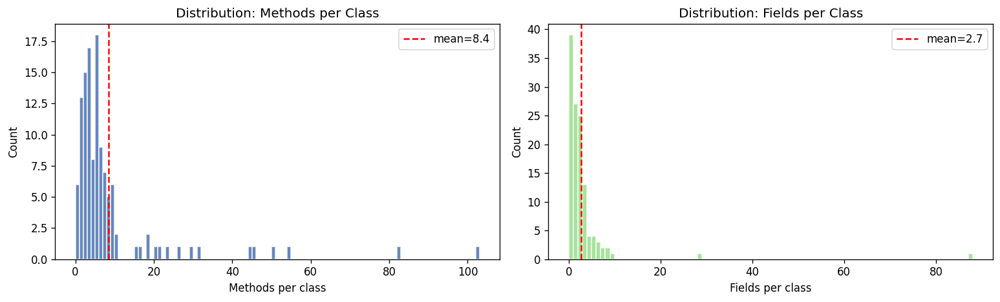

In [11]:
# ── 6b. Methods-per-class distribution ────────────────────────────────────
methods_per_class = [c['n_methods'] for c in classes]
fields_per_class  = [c['n_fields']  for c in classes]

fig, axes = plt.subplots(1, 2, figsize=(13, 4))

axes[0].hist(methods_per_class, bins=range(0, max(methods_per_class)+2), 
             color='#4C72B0', edgecolor='white', alpha=0.85)
axes[0].set_xlabel('Methods per class')
axes[0].set_ylabel('Count')
axes[0].set_title('Distribution: Methods per Class')
axes[0].axvline(sum(methods_per_class)/len(methods_per_class), 
                color='red', linestyle='--', label=f'mean={sum(methods_per_class)/len(methods_per_class):.1f}')
axes[0].legend()

axes[1].hist(fields_per_class, bins=range(0, max(fields_per_class)+2),
             color='#98DF8A', edgecolor='white', alpha=0.85)
axes[1].set_xlabel('Fields per class')
axes[1].set_ylabel('Count')
axes[1].set_title('Distribution: Fields per Class')
axes[1].axvline(sum(fields_per_class)/len(fields_per_class),
                color='red', linestyle='--', label=f'mean={sum(fields_per_class)/len(fields_per_class):.1f}')
axes[1].legend()

plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_methods_fields_dist.png'), bbox_inches='tight')
plt.show()

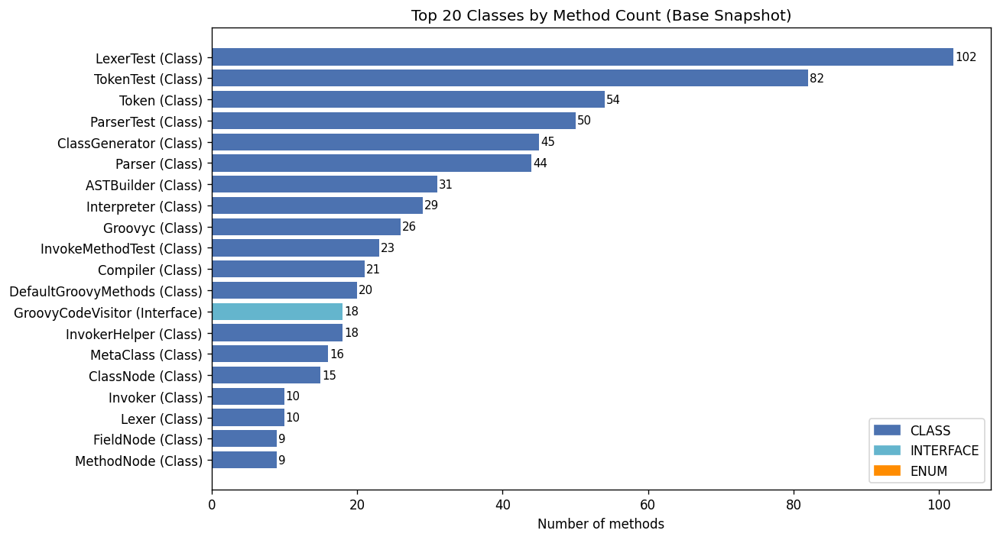

In [12]:
# ── 6c. Top-20 classes by method count ────────────────────────────────────
top20 = sorted(classes, key=lambda c: c['n_methods'], reverse=True)[:20]

fig, ax = plt.subplots(figsize=(11, 6))
names   = [f"{c['class']} ({c['class_type']})" for c in top20]
counts  = [c['n_methods'] for c in top20]
colors  = [NODE_COLORS.get(c['class_type'].upper(), '#AAAAAA') for c in top20]

bars = ax.barh(names, counts, color=colors)
ax.set_xlabel('Number of methods')
ax.set_title('Top 20 Classes by Method Count (Base Snapshot)')
ax.invert_yaxis()
for bar, val in zip(bars, counts):
    ax.text(val + 0.2, bar.get_y() + bar.get_height()/2, str(val), va='center', fontsize=9)

# Legend
legend_patches = [mpatches.Patch(color=NODE_COLORS[k], label=k)
                  for k in ('CLASS', 'INTERFACE', 'ENUM') if k in NODE_COLORS]
ax.legend(handles=legend_patches, loc='lower right')

plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_top20_classes.png'), bbox_inches='tight')
plt.show()

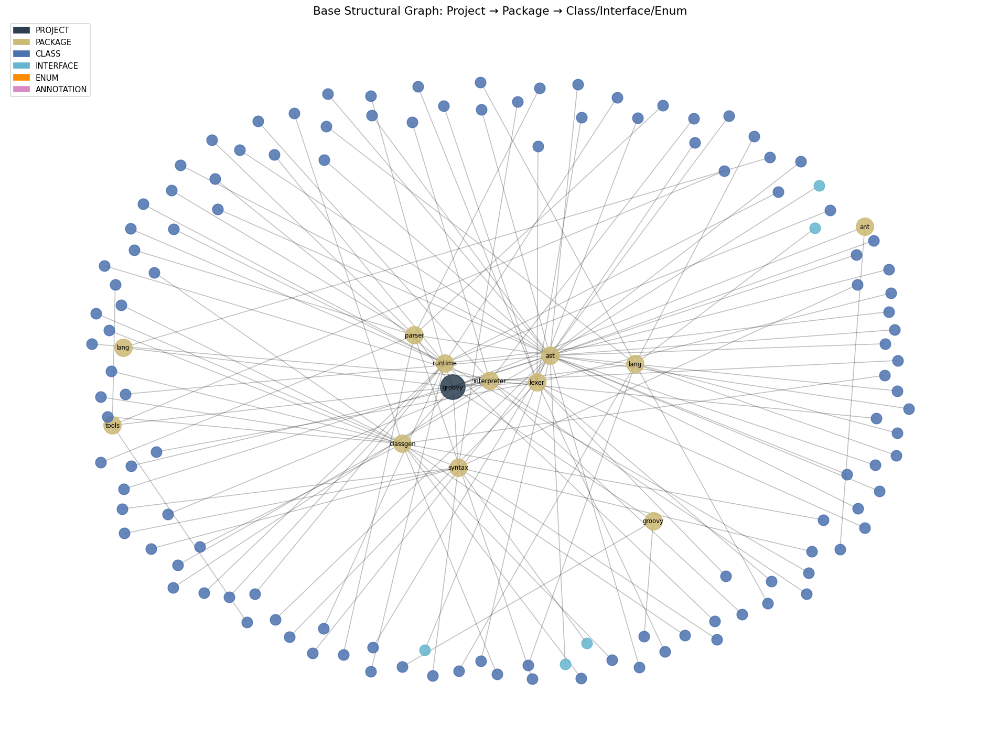

In [13]:
# ── 6d. Package → Class tree visualisation ────────────────────────────────
# Use a subgraph: only PACKAGE and CLASS/INTERFACE/ENUM nodes + HAS_CLASS edges
sub_nodes = [n for n, d in G.nodes(data=True)
             if d.get('type') in ('PROJECT', 'PACKAGE', 'CLASS', 'INTERFACE', 'ENUM', 'ANNOTATION')]
sub = G.subgraph(sub_nodes).copy()

# Use spring layout with fixed seed for reproducibility
pos = nx.spring_layout(sub, seed=42, k=0.9)

fig, ax = plt.subplots(figsize=(16, 12))

for ntype, color in NODE_COLORS.items():
    node_list = [n for n, d in sub.nodes(data=True) if d.get('type') == ntype]
    if not node_list:
        continue
    size = 800 if ntype == 'PROJECT' else 400 if ntype == 'PACKAGE' else 150
    nx.draw_networkx_nodes(sub, pos, nodelist=node_list, node_color=color,
                           node_size=size, alpha=0.85, ax=ax)

nx.draw_networkx_edges(sub, pos, alpha=0.25, arrows=False, ax=ax)

# Labels only for PACKAGE and PROJECT
label_nodes = {n: d['label'] for n, d in sub.nodes(data=True)
               if d.get('type') in ('PROJECT', 'PACKAGE')}
nx.draw_networkx_labels(sub, pos, labels=label_nodes, font_size=7, ax=ax)

legend_patches = [mpatches.Patch(color=NODE_COLORS[k], label=k)
                  for k in ('PROJECT', 'PACKAGE', 'CLASS', 'INTERFACE', 'ENUM', 'ANNOTATION')
                  if k in NODE_COLORS]
ax.legend(handles=legend_patches, loc='upper left', fontsize=9)
ax.set_title('Base Structural Graph: Project → Package → Class/Interface/Enum', fontsize=13)
ax.axis('off')

plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_package_class_graph.png'),
            bbox_inches='tight', dpi=150)
plt.show()

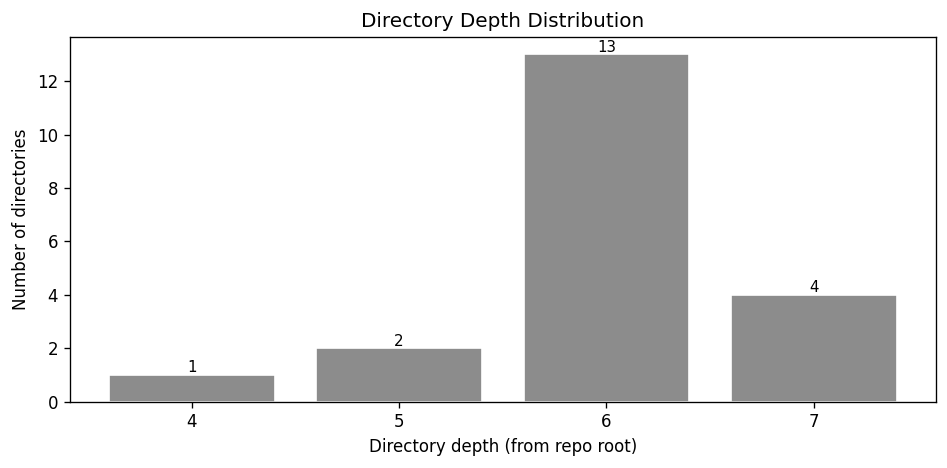

In [14]:
# ── 6e. Directory tree depth distribution ─────────────────────────────────
dir_depths = [len(Path(d).parts) for d in dirs_found]
depth_counter = Counter(dir_depths)

fig, ax = plt.subplots(figsize=(8, 4))
depths = sorted(depth_counter)
ax.bar(depths, [depth_counter[d] for d in depths], color='#8C8C8C', edgecolor='white')
ax.set_xlabel('Directory depth (from repo root)')
ax.set_ylabel('Number of directories')
ax.set_title('Directory Depth Distribution')
ax.set_xticks(depths)
for d in depths:
    ax.text(d, depth_counter[d] + 0.1, str(depth_counter[d]), ha='center', fontsize=9)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_dir_depth.png'), bbox_inches='tight')
plt.show()

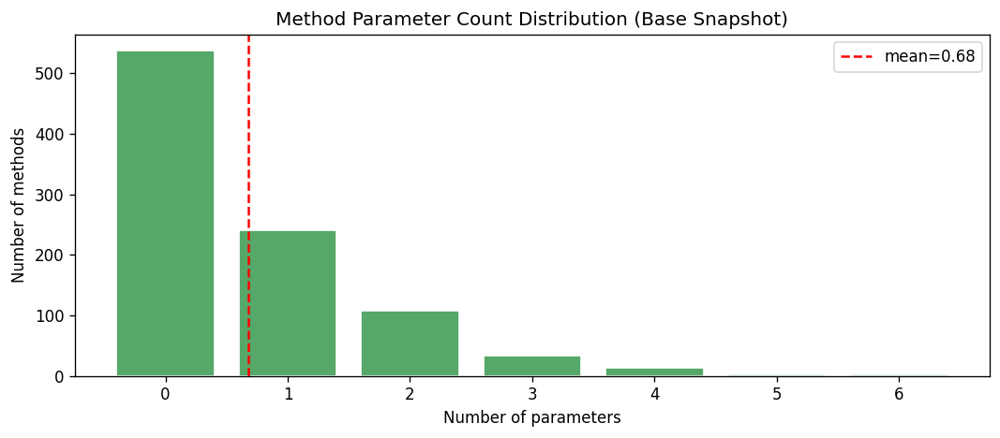

In [15]:
# ── 6f. Parameter-count distribution across all methods ───────────────────
param_counts = [m['param_count'] for m in methods]
param_counter = Counter(param_counts)

fig, ax = plt.subplots(figsize=(9, 4))
xs = sorted(param_counter)
ax.bar(xs, [param_counter[x] for x in xs], color='#55A868', edgecolor='white')
ax.set_xlabel('Number of parameters')
ax.set_ylabel('Number of methods')
ax.set_title('Method Parameter Count Distribution (Base Snapshot)')
mean_params = sum(param_counts) / len(param_counts) if param_counts else 0
ax.axvline(mean_params, color='red', linestyle='--', label=f'mean={mean_params:.2f}')
ax.legend()
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'base_param_dist.png'), bbox_inches='tight')
plt.show()

## 7. Structural Hierarchy Table

In [16]:
# Full hierarchy: DIR → FILE → CLASS → METHOD (first 5 methods per class)
print(f"{'DIRECTORY':<50} {'FILE':<30} {'CLASS':<30} {'TYPE':<12} {'METHODS (first 3)'}")
print("-" * 150)

for fpath in sorted(file_classes):
    dir_of_file = str(Path(fpath).parent)
    fname = Path(fpath).name
    for c in file_classes[fpath]:
        # Get first 3 methods
        cls_methods = [m['name'] for m in methods if m['file'] == fpath and m['class'] == c['class']][:3]
        method_str = ', '.join(cls_methods) + ('...' if c['n_methods'] > 3 else '')
        print(f"{dir_of_file:<50} {fname:<30} {c['class']:<30} {c['class_type']:<12} {method_str}")

DIRECTORY                                          FILE                           CLASS                          TYPE         METHODS (first 3)
------------------------------------------------------------------------------------------------------------------------------------------------------
src\main\groovy\lang                               Bitwise.java                   Bitwise                        Class        
src\main\org\codehaus\groovy                       GroovyException.java           GroovyException                Class        
src\main\org\codehaus\groovy\ant                   Groovyc.java                   Groovyc                        Class        createSrc, recreateSrc, setSrcdir...
src\main\org\codehaus\groovy\ast                   ASTNode.java                   ASTNode                        Class        visit
src\main\org\codehaus\groovy\ast                   AssertStatement.java           AssertStatement                Class        visit, getMessageExpression, g

## 8. Save Graph and Restore Repository

In [17]:
# ── Save the graph as GraphML for later use in other notebooks ─────────────
out_graphml = PROJECT_ROOT / 'outputs' / 'base_structural_graph.graphml'

# GraphML doesn't support list attributes — convert to strings first
G_save = G.copy()
for n, data in G_save.nodes(data=True):
    if 'imports' in data:
        data['imports'] = '|'.join(data['imports'])
    if 'params' in data:
        data['params'] = '|'.join(data['params'])

nx.write_graphml(G_save, str(out_graphml))
print(f"Graph saved → {out_graphml}")
print(f"  Nodes : {G_save.number_of_nodes()}")
print(f"  Edges : {G_save.number_of_edges()}")

Graph saved → c:\Users\sinab\Documents\GitHub\KG-Commit\outputs\base_structural_graph.graphml
  Nodes : 1654
  Edges : 1755


In [18]:
# ── Restore the repo to its original HEAD ─────────────────────────────────
out, err = git(f"checkout {current_head}")
restored, _ = git("rev-parse HEAD")
print(f"Restored HEAD → {restored[:12]}")

Restored HEAD → 408b29851d7b


## 9. Summary

The base structural graph has been built and saved. It contains:

| Layer | Node type | Relation to parent |
|---|---|---|
| 0 | PROJECT | — |
| 1 | DIR | CONTAINS_DIR |
| 2 | FILE | CONTAINS_FILE |
| 3 | PACKAGE | HAS_PACKAGE |
| 4 | CLASS / INTERFACE / ENUM / ANNOTATION | DEFINES, HAS_CLASS |
| 5 | METHOD / CONSTRUCTOR | HAS_METHOD |
| 5 | FIELD | HAS_FIELD |

This is the **Stage 0 baseline** on top of which later notebooks will add semantic subgraph layers (CFG, DFG, CPG, change overlays, etc.).

---
## 10. Family 1 — Token & Lexical Subgraphs

**Survey reference:** *Finer-Grained Subgraphs for KG-Commit*, Family 1.

For every method in the base snapshot we:
1. Re-parse each Java file to obtain exact method start lines
2. Tokenise the full source with `javalang.tokenizer`
3. Extract per-method token sequences by brace-depth tracking
4. Build a **per-method token chain graph** — nodes = tokens, edges = `NEXT_TOKEN`
5. Attach each chain to the base structural graph via a `TOKEN_SEQ` edge from the `METHOD` node
6. Export a **master CSV** with node count, edge count, graph density, token-type entropy, and higher-level connectivity flags
7. Visualise token chains and distributions

In [19]:
# ── Token layer — imports and setup ───────────────────────────────────────
import math
import csv
import javalang.tokenizer as jt

# Re-checkout the base commit so source files are accessible
out, err = git(f"checkout {BASE_COMMIT}")
confirmed, _ = git("rev-parse HEAD")
print(f"Re-checked out base commit : {confirmed[:12]}")

# Visual colour palette for token types
TOKEN_COLORS = {
    'Keyword':              '#E74C3C',   # red
    'Identifier':           '#3498DB',   # blue
    'Separator':            '#95A5A6',   # light grey
    'Operator':             '#F39C12',   # orange
    'String':               '#27AE60',   # green
    'DecimalInteger':       '#8E44AD',   # purple
    'HexInteger':           '#8E44AD',
    'OctalInteger':         '#8E44AD',
    'DecimalFloatingPoint': '#16A085',   # teal
    'HexFloatingPoint':     '#16A085',
    'Boolean':              '#D35400',   # dark orange
    'Null':                 '#7F8C8D',   # dark grey
    'CharacterLiteral':     '#2ECC71',   # mint
    'Annotation':           '#BDC3C7',   # pale grey
}

def token_color(ttype):
    return TOKEN_COLORS.get(ttype, '#BDC3C7')

# Canonical grouping (many javalang token subtypes → one display group)
def token_group(ttype):
    if ttype == 'Keyword':     return 'Keyword'
    if ttype == 'Identifier':  return 'Identifier'
    if ttype == 'Separator':   return 'Separator'
    if ttype == 'Operator':    return 'Operator'
    if ttype in ('String', 'CharacterLiteral'): return 'Literal-String'
    if ttype in ('DecimalInteger', 'HexInteger', 'OctalInteger',
                 'DecimalFloatingPoint', 'HexFloatingPoint'):  return 'Literal-Number'
    if ttype == 'Boolean':     return 'Literal-Bool'
    if ttype == 'Null':        return 'Literal-Null'
    if ttype == 'Annotation':  return 'Annotation'
    return 'Other'

print("Setup complete.")

Re-checked out base commit : 408b29851d7b
Setup complete.


In [20]:
# ── Re-parse Java files: collect (method_name, start_line) per file ────────
# javalang.tree.MethodDeclaration and ConstructorDeclaration carry a .position
# attribute with (line, column). We use this to anchor token extraction.

def parse_method_positions(fpath):
    """Return (source_text, list of {name, line, kind, class_name})."""
    try:
        src = fpath.read_text(encoding='utf-8', errors='replace')
        tree = javalang.parse.parse(src)
    except Exception:
        return None, []

    entries = []
    for path_nodes, node in tree:
        if isinstance(node, (javalang.tree.MethodDeclaration,
                             javalang.tree.ConstructorDeclaration)):
            if node.position is None:
                continue
            # Walk path to find the enclosing type
            cls_name = '<unknown>'
            for ancestor in reversed(path_nodes):
                if isinstance(ancestor, (javalang.tree.ClassDeclaration,
                                         javalang.tree.InterfaceDeclaration,
                                         javalang.tree.EnumDeclaration)):
                    cls_name = ancestor.name
                    break
            entries.append({
                'name':  node.name,
                'line':  node.position.line,
                'kind':  'constructor' if isinstance(node, javalang.tree.ConstructorDeclaration)
                         else 'method',
                'class': cls_name,
            })
    return src, entries


# ── Tokenise every Java file and store per-file token list ────────────────
file_sources   = {}   # rel_path → source text
file_tokens    = {}   # rel_path → [{type, value, line, col}, ...]
file_meth_pos  = {}   # rel_path → [{name, line, kind, class}, ...]
tokenize_errors = []

for fpath in java_files:
    rel = str(fpath.relative_to(REPO_PATH))
    src, mpos = parse_method_positions(fpath)
    if src is None:
        tokenize_errors.append(rel)
        continue
    try:
        raw = list(jt.tokenize(src))
    except Exception:
        tokenize_errors.append(rel)
        continue
    file_sources[rel]  = src
    file_meth_pos[rel] = mpos
    file_tokens[rel]   = [
        {'type': type(t).__name__, 'value': t.value,
         'line': t.position.line,  'col': t.position.column}
        for t in raw
    ]

total_tokens = sum(len(v) for v in file_tokens.values())
all_tok_types = Counter(t['type'] for v in file_tokens.values() for t in v)

print(f"Files tokenised    : {len(file_tokens)} / {len(java_files)}")
print(f"Tokenise errors    : {len(tokenize_errors)}")
print(f"Total tokens       : {total_tokens:,}")
print(f"\nToken type breakdown:")
for ttype, cnt in all_tok_types.most_common():
    pct = cnt / total_tokens * 100
    bar = '█' * int(pct * 2)
    print(f"  {ttype:<28} {cnt:>7,}  {pct:5.1f}%  {bar}")

Files tokenised    : 120 / 120
Tokenise errors    : 0
Total tokens       : 55,603

Token type breakdown:
  Separator                     27,088   48.7%  █████████████████████████████████████████████████████████████████████████████████████████████████
  Identifier                    17,502   31.5%  ██████████████████████████████████████████████████████████████
  Keyword                        3,900    7.0%  ██████████████
  Operator                       2,189    3.9%  ███████
  Modifier                       1,778    3.2%  ██████
  String                         1,444    2.6%  █████
  DecimalInteger                   865    1.6%  ███
  BasicType                        537    1.0%  █
  Null                             209    0.4%  
  Boolean                           87    0.2%  
  HexInteger                         3    0.0%  
  DecimalFloatingPoint               1    0.0%  


In [21]:
# ── Extract per-method token bodies using brace-depth tracking ────────────

def extract_body_tokens(file_tok_list, method_start_line):
    """
    Starting from method_start_line, scan forward until we find the opening '{'
    of the method body, then read until depth returns to 0.
    Returns (body_tokens, is_abstract).
    """
    in_body = False
    depth   = 0
    body    = []

    for tok in file_tok_list:
        if tok['line'] < method_start_line:
            continue
        if not in_body:
            if tok['value'] == '{':
                in_body = True
                depth   = 1
                body.append(tok)
            elif tok['value'] == ';' and not body:
                return [], True     # abstract / interface declaration
        else:
            body.append(tok)
            if   tok['value'] == '{': depth += 1
            elif tok['value'] == '}':
                depth -= 1
                if depth == 0:
                    break
    return body, False


# ── Build the master method-token record list ─────────────────────────────
# Each entry: {method_id, file, package, class, method, kind, tokens: [...]}
method_token_records = []

for rel, mpos_list in file_meth_pos.items():
    ftoks = file_tokens.get(rel, [])
    if not ftoks:
        continue
    for mp in mpos_list:
        body, is_abstract = extract_body_tokens(ftoks, mp['line'])
        method_token_records.append({
            'method_id':   f"{rel}::{mp['class']}::{mp['name']}@{mp['line']}",
            'file':        rel,
            'class':       mp['class'],
            'method':      mp['name'],
            'kind':        mp['kind'],
            'tokens':      body,
            'is_abstract': is_abstract,
        })

non_abstract = [r for r in method_token_records if not r['is_abstract'] and len(r['tokens']) > 0]
abstract     = [r for r in method_token_records if r['is_abstract']]
empty        = [r for r in method_token_records if not r['is_abstract'] and len(r['tokens']) == 0]

print(f"Total method entries   : {len(method_token_records)}")
print(f"  With body (concrete) : {len(non_abstract)}")
print(f"  Abstract / interface : {len(abstract)}")
print(f"  Body not found       : {len(empty)}")
print(f"\nToken body size stats (concrete methods):")
sizes = sorted(len(r['tokens']) for r in non_abstract)
print(f"  min={sizes[0]}  median={sizes[len(sizes)//2]}  "
      f"mean={sum(sizes)/len(sizes):.1f}  max={sizes[-1]}")

Total method entries   : 1029
  With body (concrete) : 996
  Abstract / interface : 33
  Body not found       : 0

Token body size stats (concrete methods):
  min=2  median=16  mean=39.2  max=2473


In [22]:
# ── Build per-method token NetworkX subgraphs ─────────────────────────────
# Each subgraph: token nodes + NEXT_TOKEN edges (linear chain)
# Also add a TOKEN_SEQ edge from the METHOD node in the base graph G

def build_token_subgraph(record):
    """
    Build a DiGraph for one method's token body.
    Node IDs: '{method_id}::T{idx}'
    Node attrs: type, value, group, color
    Edges: NEXT_TOKEN (sequential) + one TOKEN_SEQ from METHOD node
    """
    mid    = record['method_id']
    tokens = record['tokens']
    Tg     = nx.DiGraph()

    prev_nid = None
    for i, tok in enumerate(tokens):
        nid = f"{mid}::T{i}"
        Tg.add_node(nid,
                    type='TOKEN',
                    token_type=tok['type'],
                    group=token_group(tok['type']),
                    value=tok['value'],
                    color=token_color(tok['type']),
                    line=tok['line'],
                    col=tok['col'],
                    pos_in_seq=i)
        if prev_nid is not None:
            Tg.add_edge(prev_nid, nid, rel='NEXT_TOKEN')
        prev_nid = nid
    return Tg


# Build all token subgraphs and extend the base graph G
token_subgraphs = {}   # method_id → DiGraph

for rec in non_abstract:
    mid = rec['method_id']
    Tg  = build_token_subgraph(rec)
    token_subgraphs[mid] = Tg

    # Find the matching METHOD node in G
    # G method node IDs follow: METHOD:{package}.{class}.{name}_{idx}
    # We match by class + method name (best-effort; handles overloads imperfectly)
    method_node_id = None
    for nid, ndata in G.nodes(data=True):
        if (ndata.get('type') in ('METHOD', 'CONSTRUCTOR') and
                ndata.get('label') == rec['method'] and
                rec['class'] in nid):
            method_node_id = nid
            break

    # Add token nodes + edges to G
    G.add_nodes_from(Tg.nodes(data=True))
    G.add_edges_from(Tg.edges(data=True))

    # Attach chain head to the METHOD node
    if method_node_id and Tg.number_of_nodes() > 0:
        head_node = f"{mid}::T0"
        G.add_edge(method_node_id, head_node, rel='TOKEN_SEQ')

print(f"Token subgraphs built  : {len(token_subgraphs)}")
print(f"G after token layer    : {G.number_of_nodes():,} nodes  {G.number_of_edges():,} edges")

# Edge type count update
edge_types_new = Counter(d['rel'] for _, _, d in G.edges(data=True))
print(f"\nNew edge relation counts:")
for rel, cnt in sorted(edge_types_new.items(), key=lambda x: -x[1]):
    print(f"  {rel:<22} {cnt:>7,}")

Token subgraphs built  : 996
G after token layer    : 40,652 nodes  40,751 edges

New edge relation counts:
  NEXT_TOKEN              38,002
  HAS_METHOD               1,027
  TOKEN_SEQ                  994
  HAS_FIELD                  324
  DEFINES                    122
  HAS_CLASS                  122
  CONTAINS_FILE              120
  CONTAINS_DIR                28
  HAS_PACKAGE                 12


In [23]:
# ── Compute statistics for every method and build the master CSV ──────────
#
# Columns
# -------
# method_id, file, class, method, kind
# n_tokens          : total tokens in body
# n_token_nodes     : = n_tokens (each token is a node)
# n_edges           : NEXT_TOKEN edges  = n_tokens - 1  (linear chain)
# density           : 2*|E| / (|V|*(|V|-1))  -- very low for a chain
# n_token_types     : distinct token types
# n_token_groups    : distinct token groups
# type_entropy      : Shannon entropy over token type distribution (nats)
# group_entropy     : Shannon entropy over token group distribution
# pct_keyword       : % Keyword tokens
# pct_identifier    : % Identifier tokens
# pct_separator     : % Separator tokens
# pct_operator      : % Operator tokens
# pct_literal       : % (all literal) tokens
# has_method_link   : bool — does the METHOD node in G have TOKEN_SEQ edge?
# has_class_ancestor: bool — can we trace TOKEN→METHOD→CLASS in G?
# has_file_ancestor : bool — can we trace TOKEN→METHOD→CLASS→FILE in G?
# has_pkg_ancestor  : bool — can we trace to a PACKAGE node?


def shannon_entropy(values):
    total = sum(values)
    if total == 0:
        return 0.0
    probs = [v / total for v in values if v > 0]
    return -sum(p * math.log(p) for p in probs)


csv_rows = []

for rec in non_abstract:
    mid    = rec['method_id']
    tokens = rec['tokens']
    n      = len(tokens)
    if n == 0:
        continue

    # ── token type / group counts ──────────────────────────────────────
    type_counts  = Counter(t['type']          for t in tokens)
    group_counts = Counter(token_group(t['type']) for t in tokens)

    pct_kw   = type_counts.get('Keyword',    0) / n * 100
    pct_id   = type_counts.get('Identifier', 0) / n * 100
    pct_sep  = type_counts.get('Separator',  0) / n * 100
    pct_op   = type_counts.get('Operator',   0) / n * 100
    pct_lit  = sum(type_counts[k] for k in type_counts
                   if 'Literal' in k or k in
                   ('String','Boolean','Null','DecimalInteger','HexInteger',
                    'OctalInteger','DecimalFloatingPoint','HexFloatingPoint',
                    'CharacterLiteral')) / n * 100

    type_ent  = shannon_entropy(list(type_counts.values()))
    group_ent = shannon_entropy(list(group_counts.values()))

    # ── graph metrics ─────────────────────────────────────────────────
    n_edges  = n - 1                                  # linear chain
    density  = (2 * n_edges / (n * (n - 1))) if n > 1 else 0.0

    # ── higher-level connectivity ─────────────────────────────────────
    # Check if there's a TOKEN_SEQ edge into the base graph
    head_nid    = f"{mid}::T0"
    has_m_link  = any(True for u, v, d in G.in_edges(head_nid, data=True)
                      if d.get('rel') == 'TOKEN_SEQ')

    # Trace ancestors: METHOD → CLASS → FILE → PACKAGE
    has_class   = False
    has_file    = False
    has_pkg     = False
    if has_m_link:
        for _, method_nid, _ in G.in_edges(head_nid, data=True):
            for _, class_nid, d2 in G.in_edges(method_nid, data=True):
                if G.nodes[class_nid].get('type') in ('CLASS', 'INTERFACE', 'ENUM', 'ANNOTATION'):
                    has_class = True
                    for _, file_nid, _ in G.in_edges(class_nid, data=True):
                        if G.nodes[file_nid].get('type') == 'FILE':
                            has_file = True
                    for pkg_nid, _ , _ in G.in_edges(class_nid, data=True):
                        if G.nodes[pkg_nid].get('type') == 'PACKAGE':
                            has_pkg = True

    csv_rows.append({
        'method_id':        mid,
        'file':             rec['file'],
        'class':            rec['class'],
        'method':           rec['method'],
        'kind':             rec['kind'],
        'n_tokens':         n,
        'n_token_nodes':    n,
        'n_edges':          n_edges,
        'density':          round(density, 6),
        'n_token_types':    len(type_counts),
        'n_token_groups':   len(group_counts),
        'type_entropy':     round(type_ent,  4),
        'group_entropy':    round(group_ent, 4),
        'pct_keyword':      round(pct_kw,   2),
        'pct_identifier':   round(pct_id,   2),
        'pct_separator':    round(pct_sep,  2),
        'pct_operator':     round(pct_op,   2),
        'pct_literal':      round(pct_lit,  2),
        'has_method_link':  has_m_link,
        'has_class_ancestor': has_class,
        'has_file_ancestor':  has_file,
        'has_pkg_ancestor':   has_pkg,
    })

# ── Save master CSV ────────────────────────────────────────────────────
csv_path = PROJECT_ROOT / 'outputs' / 'token_subgraph_stats.csv'
with open(csv_path, 'w', newline='', encoding='utf-8') as f:
    writer = csv.DictWriter(f, fieldnames=list(csv_rows[0].keys()))
    writer.writeheader()
    writer.writerows(csv_rows)

print(f"Master CSV saved → {csv_path}")
print(f"Rows: {len(csv_rows)}")
print(f"\nColumn summary:")
vals = {col: [r[col] for r in csv_rows] for col in csv_rows[0]}
for col, vs in vals.items():
    if isinstance(vs[0], (int, float)):
        print(f"  {col:<25} min={min(vs):.3g}  median={sorted(vs)[len(vs)//2]:.3g}"
              f"  mean={sum(vs)/len(vs):.3g}  max={max(vs):.3g}")
    elif isinstance(vs[0], bool):
        print(f"  {col:<25} True={sum(vs)}  False={len(vs)-sum(vs)}")
    else:
        unique = len(set(vs))
        print(f"  {col:<25} {unique} unique values")

Master CSV saved → c:\Users\sinab\Documents\GitHub\KG-Commit\outputs\token_subgraph_stats.csv
Rows: 996

Column summary:
  method_id                 996 unique values
  file                      109 unique values
  class                     107 unique values
  method                    674 unique values
  kind                      2 unique values
  n_tokens                  min=2  median=16  mean=39.2  max=2.47e+03
  n_token_nodes             min=2  median=16  mean=39.2  max=2.47e+03
  n_edges                   min=1  median=15  mean=38.2  max=2.47e+03
  density                   min=0.000809  median=0.125  mean=0.166  max=1
  n_token_types             min=1  median=4  mean=4.05  max=10
  n_token_groups            min=1  median=4  mean=4.04  max=9
  type_entropy              min=-0  median=0.987  mean=1.01  max=1.62
  group_entropy             min=-0  median=0.987  mean=1.01  max=1.62
  pct_keyword               min=0  median=6.59  mean=7.75  max=28.6
  pct_identifier            min=0 

### Visualisations — Token Layer

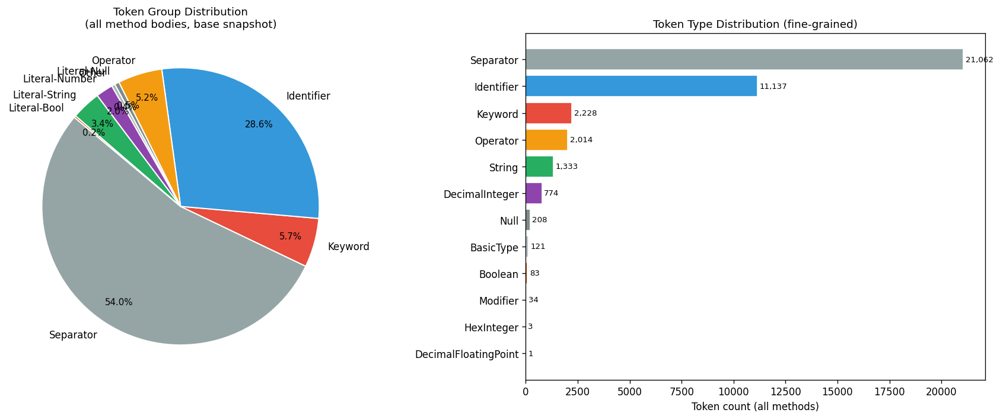

In [24]:
# ── Viz 1: Token type distribution across ALL method bodies ───────────────
group_totals = Counter()
for rec in non_abstract:
    for tok in rec['tokens']:
        group_totals[token_group(tok['type'])] += 1

GROUP_COLORS = {
    'Keyword':        '#E74C3C',
    'Identifier':     '#3498DB',
    'Separator':      '#95A5A6',
    'Operator':       '#F39C12',
    'Literal-String': '#27AE60',
    'Literal-Number': '#8E44AD',
    'Literal-Bool':   '#D35400',
    'Literal-Null':   '#7F8C8D',
    'Annotation':     '#BDC3C7',
    'Other':          '#AAB7B8',
}

fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# ── Left: pie chart ────────────────────────────────────────────────────────
labels  = list(group_totals.keys())
vals_g  = [group_totals[l] for l in labels]
colors  = [GROUP_COLORS.get(l, '#AAB7B8') for l in labels]
wedges, texts, autotexts = axes[0].pie(
    vals_g, labels=labels, colors=colors, autopct='%1.1f%%',
    startangle=140, pctdistance=0.82,
    wedgeprops=dict(edgecolor='white', linewidth=1.2))
for t in autotexts:
    t.set_fontsize(9)
axes[0].set_title('Token Group Distribution\n(all method bodies, base snapshot)', fontsize=11)

# ── Right: horizontal bar — raw counts by fine type ───────────────────────
type_totals = Counter()
for rec in non_abstract:
    for tok in rec['tokens']:
        type_totals[tok['type']] += 1

sorted_types = sorted(type_totals.items(), key=lambda x: -x[1])
t_labels, t_counts = zip(*sorted_types)
t_colors = [token_color(t) for t in t_labels]

axes[1].barh(t_labels, t_counts, color=t_colors, edgecolor='white')
axes[1].set_xlabel('Token count (all methods)')
axes[1].set_title('Token Type Distribution (fine-grained)', fontsize=11)
axes[1].invert_yaxis()
for i, v in enumerate(t_counts):
    axes[1].text(v + max(t_counts)*0.005, i, f'{v:,}', va='center', fontsize=8)

plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'tok_type_distribution.png'),
            bbox_inches='tight', dpi=130)
plt.show()

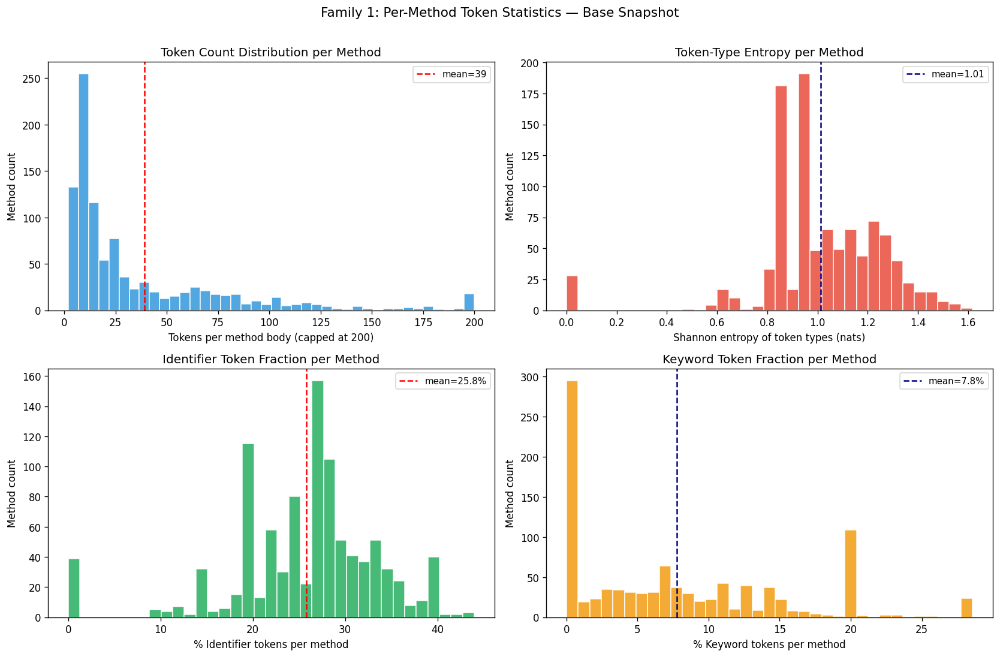

In [25]:
# ── Viz 2: Per-method statistics distributions ────────────────────────────
n_tok_vals  = [r['n_tokens']      for r in csv_rows]
ent_vals    = [r['type_entropy']  for r in csv_rows]
pct_id_vals = [r['pct_identifier'] for r in csv_rows]
pct_kw_vals = [r['pct_keyword']   for r in csv_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))

# ── 2a. Token count per method ─────────────────────────────────────────────
MAX_DISPLAY = 200
clipped = [min(v, MAX_DISPLAY) for v in n_tok_vals]
axes[0, 0].hist(clipped, bins=40, color='#3498DB', edgecolor='white', alpha=0.85)
axes[0, 0].axvline(sum(n_tok_vals)/len(n_tok_vals), color='red', linestyle='--',
                   label=f'mean={sum(n_tok_vals)/len(n_tok_vals):.0f}')
axes[0, 0].set_xlabel(f'Tokens per method body (capped at {MAX_DISPLAY})')
axes[0, 0].set_ylabel('Method count')
axes[0, 0].set_title('Token Count Distribution per Method')
axes[0, 0].legend(fontsize=9)

# ── 2b. Shannon entropy of token types ────────────────────────────────────
axes[0, 1].hist(ent_vals, bins=35, color='#E74C3C', edgecolor='white', alpha=0.85)
axes[0, 1].axvline(sum(ent_vals)/len(ent_vals), color='navy', linestyle='--',
                   label=f'mean={sum(ent_vals)/len(ent_vals):.2f}')
axes[0, 1].set_xlabel('Shannon entropy of token types (nats)')
axes[0, 1].set_ylabel('Method count')
axes[0, 1].set_title('Token-Type Entropy per Method')
axes[0, 1].legend(fontsize=9)

# ── 2c. % Identifier tokens ────────────────────────────────────────────────
axes[1, 0].hist(pct_id_vals, bins=35, color='#27AE60', edgecolor='white', alpha=0.85)
axes[1, 0].axvline(sum(pct_id_vals)/len(pct_id_vals), color='red', linestyle='--',
                   label=f'mean={sum(pct_id_vals)/len(pct_id_vals):.1f}%')
axes[1, 0].set_xlabel('% Identifier tokens per method')
axes[1, 0].set_ylabel('Method count')
axes[1, 0].set_title('Identifier Token Fraction per Method')
axes[1, 0].legend(fontsize=9)

# ── 2d. % Keyword tokens ──────────────────────────────────────────────────
axes[1, 1].hist(pct_kw_vals, bins=35, color='#F39C12', edgecolor='white', alpha=0.85)
axes[1, 1].axvline(sum(pct_kw_vals)/len(pct_kw_vals), color='navy', linestyle='--',
                   label=f'mean={sum(pct_kw_vals)/len(pct_kw_vals):.1f}%')
axes[1, 1].set_xlabel('% Keyword tokens per method')
axes[1, 1].set_ylabel('Method count')
axes[1, 1].set_title('Keyword Token Fraction per Method')
axes[1, 1].legend(fontsize=9)

plt.suptitle('Family 1: Per-Method Token Statistics — Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'tok_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

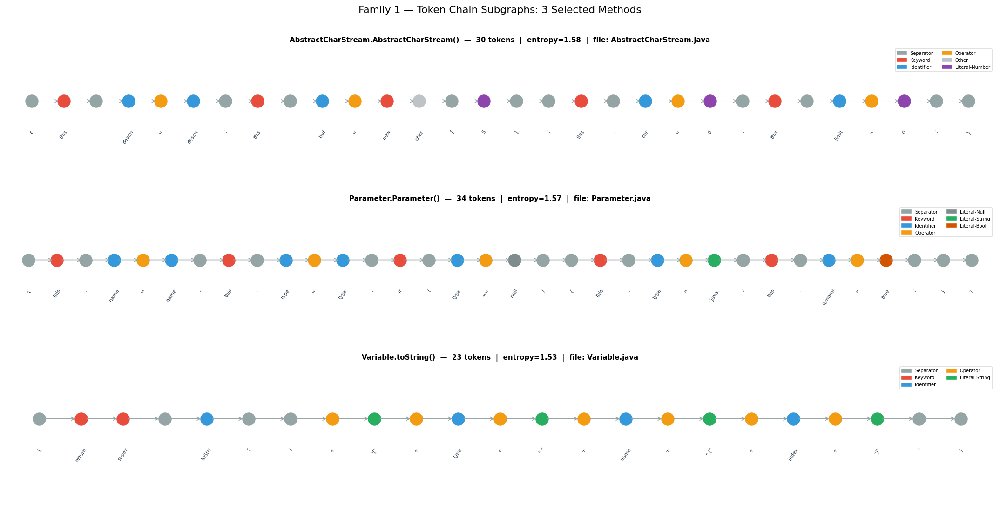

In [26]:
# ── Viz 3: Token chain graph for 3 selected small-to-medium methods ──────
# Select methods in token range [12, 45] sorted by entropy (diverse = interesting)

def draw_token_chain(ax, rec, title=None):
    """
    Draw a horizontal left-to-right token chain on axes `ax`.
    Nodes coloured by token group. Labels show (truncated) token value.
    """
    tokens = rec['tokens']
    n      = len(tokens)
    if n == 0:
        ax.text(0.5, 0.5, '(no tokens)', ha='center', va='center')
        return

    # Layout: evenly spaced along x, y=0
    xs = list(range(n))
    ys = [0] * n

    for i, tok in enumerate(tokens):
        color = token_color(tok['type'])
        ax.scatter(xs[i], ys[i], s=320, c=color, zorder=3,
                   edgecolors='white', linewidths=0.8)
        label = tok['value'][:6] if len(tok['value']) > 6 else tok['value']
        ax.text(xs[i], -0.18, label, ha='center', va='top',
                fontsize=6.5, rotation=55, color='#2C3E50')

    # Draw arrows between consecutive tokens
    for i in range(n - 1):
        ax.annotate('', xy=(xs[i+1]-0.1, 0), xytext=(xs[i]+0.1, 0),
                    arrowprops=dict(arrowstyle='->', color='#95A5A6',
                                   lw=1.0, mutation_scale=10))

    ttl = title or f"{rec['class']}.{rec['method']}()"
    ax.set_title(ttl, fontsize=9, fontweight='bold')
    ax.set_xlim(-0.8, n - 0.2)
    ax.set_ylim(-0.55, 0.35)
    ax.axis('off')

    # Mini legend inside axes
    seen = {}
    for tok in tokens:
        grp = token_group(tok['type'])
        if grp not in seen:
            seen[grp] = token_color(tok['type'])
    patches = [mpatches.Patch(color=c, label=g) for g, c in seen.items()]
    ax.legend(handles=patches, loc='upper right', fontsize=6,
              framealpha=0.7, ncol=2)


# Pick 3 candidate methods
candidates = sorted(
    [r for r in non_abstract if 12 <= len(r['tokens']) <= 50],
    key=lambda r: -shannon_entropy([v for v in
        Counter(t['type'] for t in r['tokens']).values()])
)
selected = candidates[:3] if len(candidates) >= 3 else non_abstract[:3]

fig, axes = plt.subplots(3, 1, figsize=(18, 9))
for ax, rec in zip(axes, selected):
    stat = next(s for s in csv_rows if s['method_id'] == rec['method_id'])
    title = (f"{rec['class']}.{rec['method']}()  —  "
             f"{stat['n_tokens']} tokens  |  entropy={stat['type_entropy']:.2f}  |  "
             f"file: {Path(rec['file']).name}")
    draw_token_chain(ax, rec, title=title)

plt.suptitle('Family 1 — Token Chain Subgraphs: 3 Selected Methods',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'tok_chain_3methods.png'),
            bbox_inches='tight', dpi=140)
plt.show()

Visualising class: LexerTest  (8 methods shown)
  testEndOfStream                 23 tokens
  testIgnoredWhitespace           11 tokens
  testLeftCurlyBrace              11 tokens
  testRightCurlyBrace             11 tokens
  testLeftSquareBracket           11 tokens
  testRightSquareBracket          11 tokens
  testLeftParenthesis             11 tokens
  testRightParenthesis            11 tokens


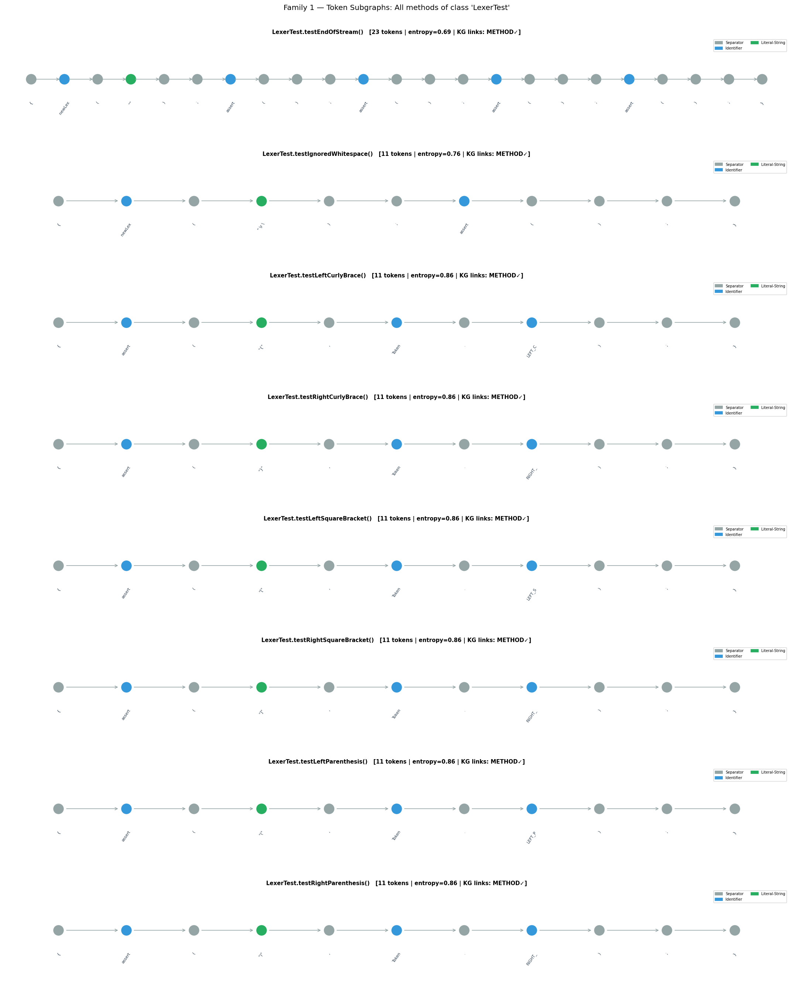

In [27]:
# ── Viz 4: All methods of one class — stacked token chain panels ──────────
# Pick the class with the most methods that have small-to-medium bodies

class_method_counts = Counter(r['class'] for r in non_abstract
                               if 5 <= len(r['tokens']) <= 80)
target_class = class_method_counts.most_common(1)[0][0]
class_methods = [r for r in non_abstract
                  if r['class'] == target_class and 5 <= len(r['tokens']) <= 80]
# Limit to at most 8 methods for readability
class_methods = class_methods[:8]

print(f"Visualising class: {target_class}  ({len(class_methods)} methods shown)")
for r in class_methods:
    print(f"  {r['method']:30}  {len(r['tokens'])} tokens")

n_rows = len(class_methods)
fig, axes = plt.subplots(n_rows, 1, figsize=(18, 2.8 * n_rows))
if n_rows == 1:
    axes = [axes]

for ax, rec in zip(axes, class_methods):
    stat = next(s for s in csv_rows if s['method_id'] == rec['method_id'])
    link_str = ('METHOD✓ CLASS✓ FILE✓' if stat['has_file_ancestor']
                else 'METHOD✓' if stat['has_method_link'] else 'unlinked')
    title = (f"{rec['class']}.{rec['method']}()   "
             f"[{stat['n_tokens']} tokens | entropy={stat['type_entropy']:.2f} | "
             f"KG links: {link_str}]")
    draw_token_chain(ax, rec, title=title)

plt.suptitle(f"Family 1 — Token Subgraphs: All methods of class '{target_class}'",
             fontsize=12, y=1.005)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'tok_class_{target_class}.png'),
            bbox_inches='tight', dpi=130)
plt.show()

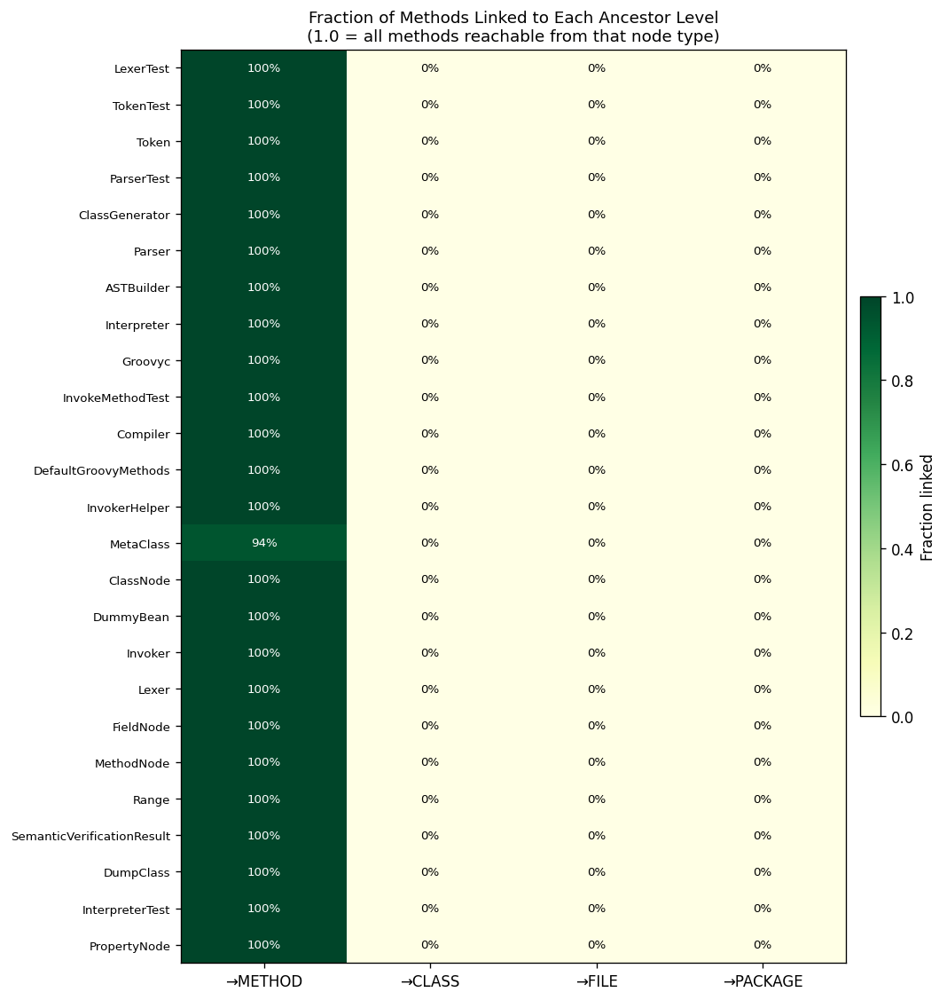

In [28]:
# ── Viz 5: Higher-level connectivity heatmap ─────────────────────────────
# For each class, show the fraction of its methods that are linked up to
# each ancestor level in the base graph (METHOD → CLASS → FILE → PKG)

class_stats = defaultdict(lambda: {'total': 0, 'method': 0, 'class': 0,
                                    'file': 0, 'pkg': 0})
for s in csv_rows:
    c = s['class']
    class_stats[c]['total']  += 1
    class_stats[c]['method'] += int(s['has_method_link'])
    class_stats[c]['class']  += int(s['has_class_ancestor'])
    class_stats[c]['file']   += int(s['has_file_ancestor'])
    class_stats[c]['pkg']    += int(s['has_pkg_ancestor'])

# Only show classes with >= 2 methods
display_classes = sorted(
    [c for c, v in class_stats.items() if v['total'] >= 2],
    key=lambda c: -class_stats[c]['total']
)[:25]  # top 25 by method count

levels  = ['has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']
l_names = ['→METHOD', '→CLASS', '→FILE', '→PACKAGE']

matrix = []
for c in display_classes:
    v = class_stats[c]
    t = v['total']
    matrix.append([v['method']/t, v['class']/t, v['file']/t, v['pkg']/t])

import numpy as np
mat_np = np.array(matrix)

fig, ax = plt.subplots(figsize=(9, max(5, len(display_classes) * 0.38)))
im = ax.imshow(mat_np, aspect='auto', cmap='YlGn', vmin=0, vmax=1)

ax.set_xticks(range(len(l_names)))
ax.set_xticklabels(l_names, fontsize=10)
ax.set_yticks(range(len(display_classes)))
ax.set_yticklabels(display_classes, fontsize=8)
ax.set_title('Fraction of Methods Linked to Each Ancestor Level\n'
             '(1.0 = all methods reachable from that node type)',
             fontsize=11)

for i in range(len(display_classes)):
    for j in range(len(l_names)):
        val = mat_np[i, j]
        txt_color = 'white' if val > 0.6 else 'black'
        ax.text(j, i, f'{val:.0%}', ha='center', va='center',
                fontsize=8, color=txt_color)

plt.colorbar(im, ax=ax, fraction=0.03, pad=0.02, label='Fraction linked')
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'tok_connectivity_heatmap.png'),
            bbox_inches='tight', dpi=130)
plt.show()

In [29]:
# ── Final summary + restore repo HEAD ────────────────────────────────────
total_tok_nodes = sum(r['n_token_nodes'] for r in csv_rows)
total_tok_edges = sum(r['n_edges']       for r in csv_rows)
linked_m  = sum(1 for r in csv_rows if r['has_method_link'])
linked_c  = sum(1 for r in csv_rows if r['has_class_ancestor'])
linked_f  = sum(1 for r in csv_rows if r['has_file_ancestor'])

print("=" * 60)
print("  FAMILY 1 — TOKEN SUBGRAPH SUMMARY")
print("=" * 60)
print(f"  Concrete methods processed     : {len(csv_rows):>7,}")
print(f"  Total TOKEN nodes added to G   : {total_tok_nodes:>7,}")
print(f"  Total NEXT_TOKEN edges in G    : {total_tok_edges:>7,}")
print(f"  TOKEN_SEQ edges (→METHOD link) : {linked_m:>7,}  "
      f"({linked_m/len(csv_rows)*100:.1f}%)")
print(f"  Methods with CLASS ancestor    : {linked_c:>7,}  "
      f"({linked_c/len(csv_rows)*100:.1f}%)")
print(f"  Methods with FILE ancestor     : {linked_f:>7,}  "
      f"({linked_f/len(csv_rows)*100:.1f}%)")
print(f"\n  Avg tokens/method (body)       : {sum(r['n_tokens'] for r in csv_rows)/len(csv_rows):>7.1f}")
print(f"  Avg token-type entropy         : {sum(r['type_entropy'] for r in csv_rows)/len(csv_rows):>7.3f}")
print(f"  Graph density (chain)          : 2/(n-1) → approx 0 for large n")
print(f"\n  Master CSV → outputs/token_subgraph_stats.csv")
print(f"  Plots saved → outputs/plots/tok_*.png")
print("=" * 60)

# ── Restore the repo HEAD ─────────────────────────────────────────────────
out, err = git(f"checkout {current_head}")
restored, _ = git("rev-parse HEAD")
print(f"\nRepo restored to HEAD → {restored[:12]}")

  FAMILY 1 — TOKEN SUBGRAPH SUMMARY
  Concrete methods processed     :     996
  Total TOKEN nodes added to G   :  38,998
  Total NEXT_TOKEN edges in G    :  38,002
  TOKEN_SEQ edges (→METHOD link) :     994  (99.8%)
  Methods with CLASS ancestor    :       0  (0.0%)
  Methods with FILE ancestor     :       0  (0.0%)

  Avg tokens/method (body)       :    39.2
  Avg token-type entropy         :   1.013
  Graph density (chain)          : 2/(n-1) → approx 0 for large n

  Master CSV → outputs/token_subgraph_stats.csv
  Plots saved → outputs/plots/tok_*.png

Repo restored to HEAD → 408b29851d7b


---

## Family 2: Syntactic Representations (AST)

**Graph encoding (from survey doc):**
```
Function  --AST_ENTRY-->        RootNode(MethodDeclaration)
RootNode  --AST_CHILD[pos=i]--> ChildNode
ChildNode --AST_CHILD[pos=j]--> LeafNode
```

Each method body becomes a tree (DiGraph) of javalang AST nodes.
Node types are grouped into: declaration, statement, expression, literal,
type, annotation, leaf (identifier strings).  We compute depth, branching
factor, and node-type entropy per method, then attach the tree root to
the METHOD node in the base graph G via an AST_ENTRY edge.

In [30]:
# ── Family 2 Setup: AST node-type groups, colours, helper functions ────────
import javalang.tree as jlt

_AST_GROUP_MAP = {
    'MethodDeclaration': 'declaration', 'ConstructorDeclaration': 'declaration',
    'ClassDeclaration': 'declaration',  'InterfaceDeclaration': 'declaration',
    'EnumDeclaration': 'declaration',   'FieldDeclaration': 'declaration',
    'VariableDeclarator': 'declaration','FormalParameter': 'declaration',
    'LocalVariableDeclaration': 'declaration', 'EnumConstantDeclaration': 'declaration',
    'IfStatement': 'statement',         'ForStatement': 'statement',
    'EnhancedForControl': 'statement',  'ForControl': 'statement',
    'WhileStatement': 'statement',      'DoStatement': 'statement',
    'TryStatement': 'statement',        'CatchClause': 'statement',
    'SwitchStatement': 'statement',     'SwitchStatementCase': 'statement',
    'ReturnStatement': 'statement',     'ThrowStatement': 'statement',
    'BreakStatement': 'statement',      'ContinueStatement': 'statement',
    'AssertStatement': 'statement',     'StatementExpression': 'statement',
    'BlockStatement': 'statement',      'SynchronizedStatement': 'statement',
    'BinaryOperation': 'expression',    'MethodInvocation': 'expression',
    'SuperMethodInvocation': 'expression', 'Assignment': 'expression',
    'Cast': 'expression',               'TernaryExpression': 'expression',
    'ArrayCreator': 'expression',       'ClassCreator': 'expression',
    'ArrayAccess': 'expression',        'MemberReference': 'expression',
    'SuperMemberReference': 'expression','ArraySelector': 'expression',
    'Literal': 'literal',
    'BasicType': 'type',  'ReferenceType': 'type',
    'TypeArgument': 'type','TypeParameter': 'type',
    'Annotation': 'annotation','ElementValuePair': 'annotation',
    'ElementArrayValue': 'annotation',
    'Identifier': 'leaf',
}

AST_COLORS = {
    'declaration': '#2980B9',
    'statement':   '#E67E22',
    'expression':  '#27AE60',
    'literal':     '#8E44AD',
    'type':        '#16A085',
    'annotation':  '#C0392B',
    'leaf':        '#BDC3C7',
    'other':       '#95A5A6',
}

def ast_group(node_type_name):
    return _AST_GROUP_MAP.get(node_type_name, 'other')

def ast_color(node_type_name):
    return AST_COLORS.get(ast_group(node_type_name), AST_COLORS['other'])


def build_ast_subgraph(method_node, method_id):
    """Build a NetworkX DiGraph for the javalang AST using an explicit stack
    (avoids Python recursion limit on deeply nested methods).
    Returns (Ag, root_nid).
    """
    Ag = nx.DiGraph()
    ctr = [0]

    def make_nid():
        nid = f"{method_id}::A{ctr[0]}"
        ctr[0] += 1
        return nid

    root_nid = None
    # stack items: (jval, parent_nid, child_pos)
    stack = [(method_node, None, 0)]

    while stack:
        jval, parent_nid, child_pos = stack.pop()
        nid = make_nid()

        if parent_nid is None:
            root_nid = nid

        if isinstance(jval, jlt.Node):
            ast_type = type(jval).__name__
            val_str = ''
            if hasattr(jval, 'name') and jval.name:
                val_str = str(jval.name)[:24]
            elif hasattr(jval, 'value') and jval.value is not None:
                val_str = str(jval.value)[:24]
            elif hasattr(jval, 'operator') and jval.operator:
                val_str = str(jval.operator)[:24]
            Ag.add_node(nid, ast_type=ast_type, group=ast_group(ast_type),
                        color=ast_color(ast_type), value=val_str, is_leaf=False)
            if parent_nid is not None:
                Ag.add_edge(parent_nid, nid, rel='AST_CHILD', pos=child_pos)

            # Collect children in order, then push reversed so left-to-right pops first
            children = []
            cp = 0
            for child in jval.children:   # DIRECT children (NOT walk_tree)
                if child is None:
                    continue
                if isinstance(child, jlt.Node):
                    children.append((child, nid, cp)); cp += 1
                elif isinstance(child, (list, frozenset, set)):
                    for item in child:
                        if isinstance(item, jlt.Node):
                            children.append((item, nid, cp)); cp += 1
                        elif isinstance(item, str) and item.strip():
                            children.append((item, nid, cp)); cp += 1
                elif isinstance(child, str) and child.strip():
                    children.append((child, nid, cp)); cp += 1
            stack.extend(reversed(children))

        elif isinstance(jval, str):
            Ag.add_node(nid, ast_type='Identifier', group='leaf',
                        color=AST_COLORS['leaf'], value=jval[:24], is_leaf=True)
            if parent_nid is not None:
                Ag.add_edge(parent_nid, nid, rel='AST_CHILD', pos=child_pos)

        else:
            Ag.add_node(nid, ast_type=type(jval).__name__, group='leaf',
                        color=AST_COLORS['leaf'], value=str(jval)[:24], is_leaf=True)
            if parent_nid is not None:
                Ag.add_edge(parent_nid, nid, rel='AST_CHILD', pos=child_pos)

    return Ag, root_nid

def hierarchy_pos(G, root, width=1.0, vert_gap=1.0):
    """Compute (x, y) positions for a tree rooted at root."""
    pos = {}
    def _r(node, x_lo, x_hi, depth):
        pos[node] = ((x_lo + x_hi) / 2, -depth * vert_gap)
        children = list(G.successors(node))
        if children:
            w = (x_hi - x_lo) / len(children)
            for k, child in enumerate(children):
                _r(child, x_lo + k * w, x_lo + (k + 1) * w, depth + 1)
    _r(root, 0.0, width, 0)
    return pos


print("Family 2 setup complete.")
for grp, col in AST_COLORS.items():
    print(f"  {grp:12}: {col}")

Family 2 setup complete.
  declaration : #2980B9
  statement   : #E67E22
  expression  : #27AE60
  literal     : #8E44AD
  type        : #16A085
  annotation  : #C0392B
  leaf        : #BDC3C7
  other       : #95A5A6


In [31]:
# ── Load AST features produced by the standalone script ────────────────────
# Run ONCE in a terminal first:   python build_ast_features.py
# That script parses every Java file in a killable subprocess (so a pathological
# file like Groovyc.java is timed-out and skipped instead of hanging the kernel),
# then writes the files we load below. No javalang parsing happens in this cell.
import json
from collections import Counter

_rows_path = PROJECT_ROOT / 'outputs' / 'ast_rows.json'
_aggr_path = PROJECT_ROOT / 'outputs' / 'ast_aggregates.json'

if not _rows_path.exists():
    raise FileNotFoundError(
        "outputs/ast_rows.json not found.\n"
        "Run this first in a terminal from the project root:\n"
        "    python build_ast_features.py"
    )

with open(_rows_path, encoding='utf-8') as f:
    ast_csv_rows = json.load(f)
with open(_aggr_path, encoding='utf-8') as f:
    _aggr = json.load(f)

group_totals = Counter(_aggr['group_totals'])
type_totals  = Counter(_aggr['type_totals'])

n_vals = [r['n_ast_nodes'] for r in ast_csv_rows]
d_vals = [r['max_depth']   for r in ast_csv_rows]
print(f"Loaded {len(ast_csv_rows)} method rows  ({_aggr['ok_files']} files parsed OK, "
      f"{len(_aggr['skipped_files'])} skipped)")
print(f"AST size  : min={min(n_vals)} med={sorted(n_vals)[len(n_vals)//2]} "
      f"mean={sum(n_vals)/len(n_vals):.0f} max={max(n_vals)}")
print(f"Max depth : min={min(d_vals)} med={sorted(d_vals)[len(d_vals)//2]} "
      f"mean={sum(d_vals)/len(d_vals):.1f} max={max(d_vals)}")
print(f"Top groups: {dict(group_totals.most_common(6))}")
if _aggr['skipped_files']:
    print(f"Skipped files: {_aggr['skipped_files']}")

Loaded 996 method rows  (120 files parsed OK, 0 skipped)
AST size  : min=3 med=25 mean=40 max=1902
Max depth : min=1 med=5 mean=5.2 max=20
Top groups: {'leaf': 19139, 'expression': 8364, 'statement': 3821, 'declaration': 3158, 'type': 2467, 'literal': 2402}


### Note: For generating the full graph of the base project with its AST subgrapphs RAM will become full and system will crash!!!

### Note 2: Generating AST subgraphs separately couldn't solve the RAM problem.

### Note 3: Deleting the javalang parse tree for every file from memory couldn't solve the RAM problem.

### Note 4: Final solution filled my Hard disk!!!

In [32]:
# ── Load example AST graphs (built by build_ast_features.py) ────────────────
import pickle
from pathlib import Path as _P

EX_GRAPH_DIR = PROJECT_ROOT / 'outputs' / 'ast_example_graphs'

ast_subgraphs = {}   # method_id -> DiGraph
ast_roots     = {}   # method_id -> root_nid

for pf in sorted(EX_GRAPH_DIR.glob('*.pkl')):
    try:
        Ag, root_nid = pickle.loads(pf.read_bytes())
    except Exception as e:
        print(f"  load error {pf.name}: {e}"); continue
    # recover method_id from any node id ('{method_id}::A0')
    any_node = next(iter(Ag.nodes()), None)
    if any_node is None: continue
    mid = any_node.rsplit('::A', 1)[0]
    ast_subgraphs[mid] = Ag
    ast_roots[mid]     = root_nid

print(f"Loaded {len(ast_subgraphs)} example AST graphs from {EX_GRAPH_DIR.name}/")
if ast_subgraphs:
    _tot = sum(g.number_of_nodes() for g in ast_subgraphs.values())
    print(f"Total nodes across examples: {_tot}")


Loaded 15 example AST graphs from ast_example_graphs/
Total nodes across examples: 387


In [33]:
print(f"ast_csv_rows  : {len(ast_csv_rows)} rows")
print(f"ast_subgraphs : {len(ast_subgraphs)} example graphs in RAM")
print(f"Columns: {list(ast_csv_rows[0].keys()) if ast_csv_rows else 'empty'}")


ast_csv_rows  : 996 rows
ast_subgraphs : 15 example graphs in RAM
Columns: ['method_id', 'file', 'class', 'method', 'kind', 'n_ast_nodes', 'n_edges', 'max_depth', 'avg_depth', 'avg_branching', 'n_node_types', 'n_groups', 'type_entropy', 'group_entropy', 'leaf_ratio', 'pct_declaration', 'pct_statement', 'pct_expression', 'pct_literal', 'pct_leaf', 'has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']


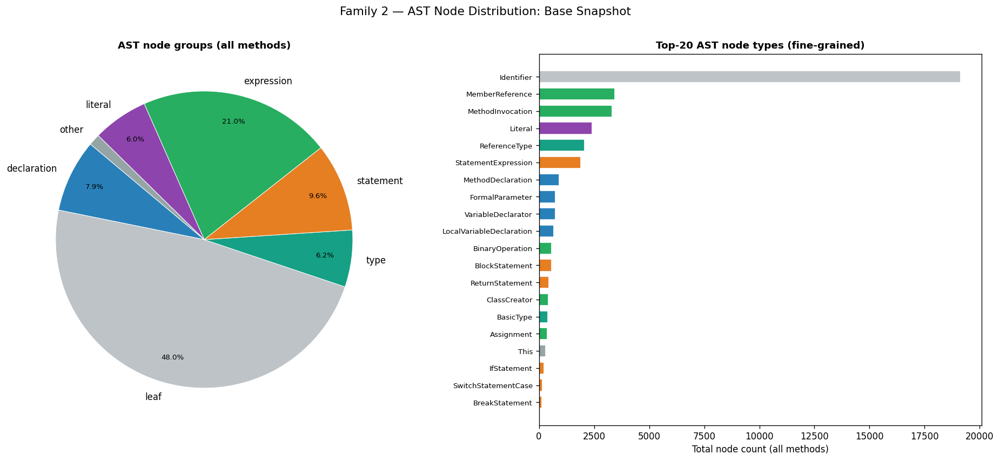

Total AST nodes: 39,848  |  distinct types: 41


In [34]:
# ── Viz 1: AST node-type and group distribution across all method bodies ───
import matplotlib.patches as mpatches

# group_totals and type_totals were accumulated during the build loop
fig, (ax_pie, ax_bar) = plt.subplots(1, 2, figsize=(16, 7))

grp_labels = list(group_totals.keys())
grp_sizes  = list(group_totals.values())
grp_colors = [AST_COLORS.get(g, AST_COLORS['other']) for g in grp_labels]
_, _, autotexts = ax_pie.pie(
    grp_sizes, labels=grp_labels, colors=grp_colors,
    autopct=lambda p: f'{p:.1f}%' if p > 2 else '',
    startangle=140, pctdistance=0.82,
    wedgeprops={'linewidth': 0.6, 'edgecolor': 'white'})
for t in autotexts: t.set_fontsize(8)
ax_pie.set_title('AST node groups (all methods)', fontsize=11, fontweight='bold')

top_types = type_totals.most_common(20)
t_names   = [x[0] for x in top_types][::-1]
t_counts  = [x[1] for x in top_types][::-1]
t_colors  = [ast_color(n) for n in t_names]
ax_bar.barh(t_names, t_counts, color=t_colors, edgecolor='white', height=0.7)
ax_bar.set_xlabel('Total node count (all methods)', fontsize=10)
ax_bar.set_title('Top-20 AST node types (fine-grained)', fontsize=11, fontweight='bold')
ax_bar.tick_params(axis='y', labelsize=8)

plt.suptitle('Family 2 — AST Node Distribution: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'ast_type_distribution.png'),
            bbox_inches='tight', dpi=140)
plt.show()
print(f"Total AST nodes: {sum(group_totals.values()):,}  |  distinct types: {len(type_totals)}")

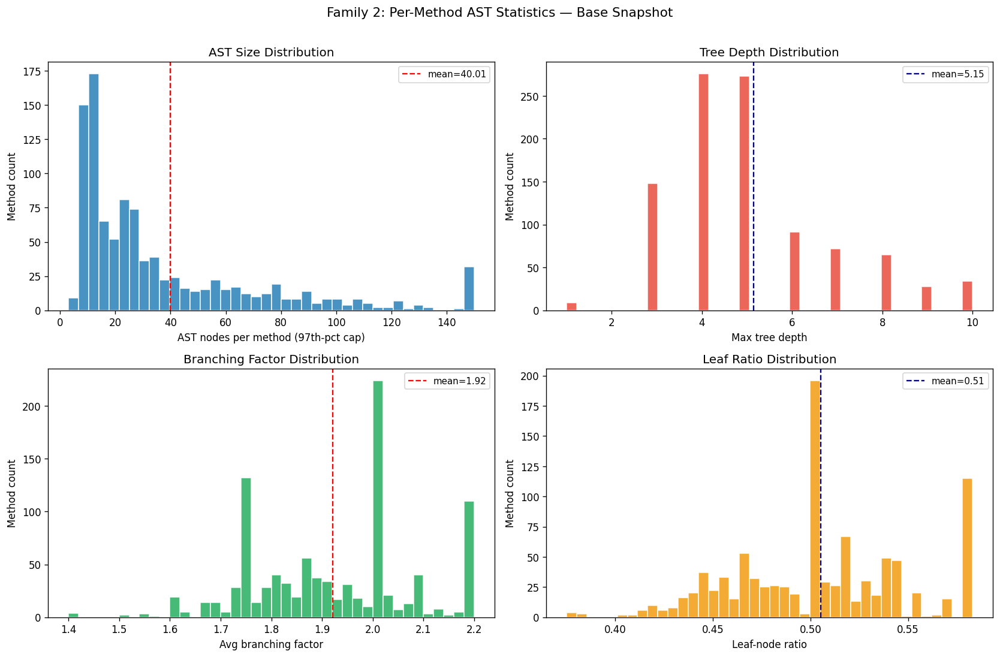

In [35]:
# ── Viz 2: Per-method AST statistics distributions ─────────────────────────
n_node_vals = [r['n_ast_nodes']   for r in ast_csv_rows]
depth_vals  = [r['max_depth']     for r in ast_csv_rows]
br_vals     = [r['avg_branching'] for r in ast_csv_rows]
leaf_vals   = [r['leaf_ratio']    for r in ast_csv_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))

def _hist(ax, vals, color, xlabel, title, vline_color='red'):
    cap     = sorted(vals)[int(len(vals) * 0.97)]
    clipped = [min(v, cap) for v in vals]
    mean    = sum(vals) / len(vals)
    ax.hist(clipped, bins=40, color=color, edgecolor='white', alpha=0.85)
    ax.axvline(mean, color=vline_color, linestyle='--', linewidth=1.4,
               label=f'mean={mean:.2f}')
    ax.set_xlabel(xlabel); ax.set_ylabel('Method count')
    ax.set_title(title); ax.legend(fontsize=9)

_hist(axes[0,0], n_node_vals, '#2980B9',
      'AST nodes per method (97th-pct cap)', 'AST Size Distribution')
_hist(axes[0,1], depth_vals,  '#E74C3C',
      'Max tree depth', 'Tree Depth Distribution', 'navy')
_hist(axes[1,0], br_vals,     '#27AE60',
      'Avg branching factor', 'Branching Factor Distribution')
_hist(axes[1,1], leaf_vals,   '#F39C12',
      'Leaf-node ratio', 'Leaf Ratio Distribution', 'navy')

plt.suptitle('Family 2: Per-Method AST Statistics — Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'ast_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

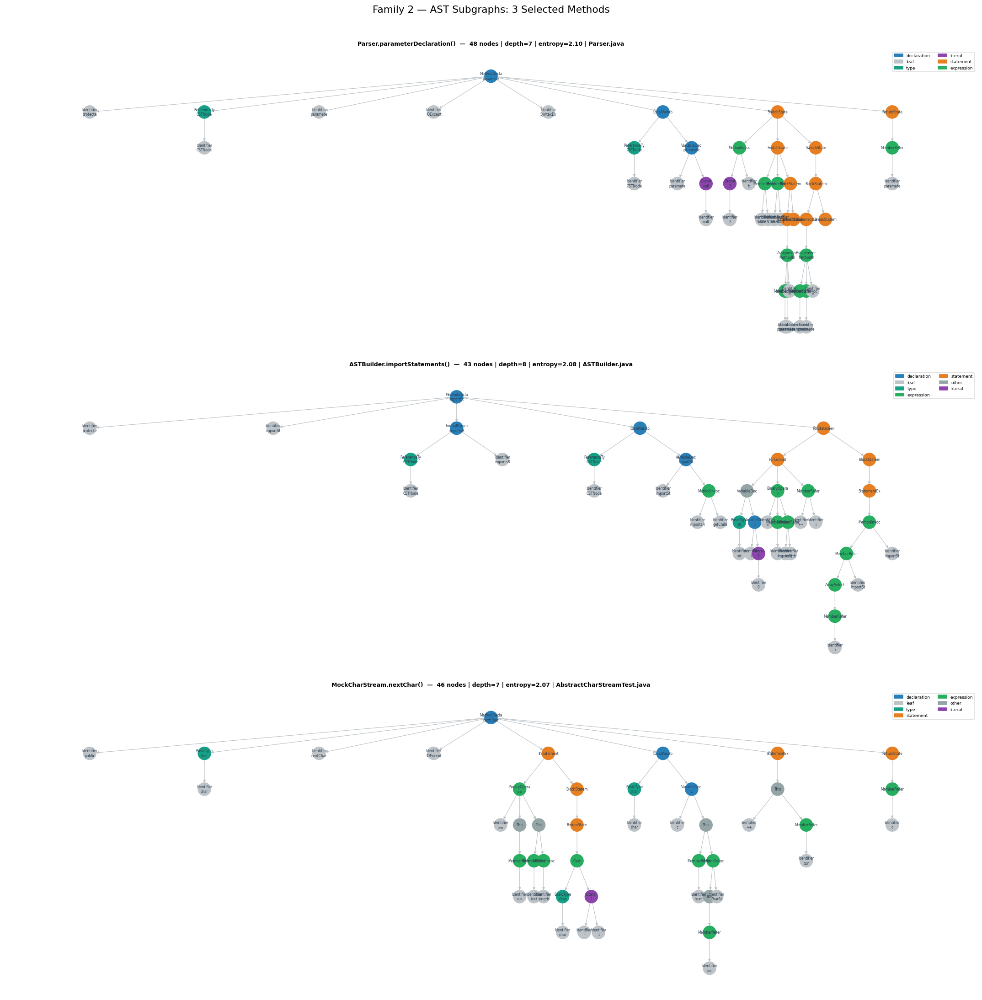

In [36]:
# ── Viz 3: Full AST tree for 3 small diverse methods ──────────────────────
MAX_VIZ_NODES = 60

def draw_ast_tree(ax, Ag, root_nid, title=None, max_nodes=MAX_VIZ_NODES):
    import matplotlib.patches as mpatches
    if Ag.number_of_nodes() > max_nodes:
        keep = []; queue = [root_nid]; vis = set()
        while queue and len(keep) < max_nodes:
            n = queue.pop(0)
            if n in vis: continue
            vis.add(n); keep.append(n)
            queue.extend(list(Ag.successors(n)))
        sub = Ag.subgraph(keep).copy(); truncated = True
    else:
        sub = Ag; truncated = False

    roots = [n for n in sub.nodes() if sub.in_degree(n) == 0]
    if not roots:
        ax.text(0.5, 0.5, '(empty)', ha='center', va='center'); return
    sub_root = roots[0]
    pos = hierarchy_pos(sub, sub_root,
                        width=max(1.0, sub.number_of_nodes() * 0.5), vert_gap=1.0)
    node_colors = [sub.nodes[n]['color'] for n in sub.nodes()]
    labels = {n: (sub.nodes[n]['ast_type'][:11] + '\n' +
                  sub.nodes[n].get('value', '')[:8])
              if sub.nodes[n].get('value', '') else sub.nodes[n]['ast_type'][:11]
              for n in sub.nodes()}
    nx.draw(sub, pos=pos, ax=ax,
            node_color=node_colors, node_size=280, arrows=True, arrowsize=7,
            labels=labels, font_size=4.5, font_color='#2C3E50',
            edge_color='#BDC3C7', width=0.7, with_labels=True)
    seen_grps = {}
    for n in sub.nodes():
        g = sub.nodes[n]['group']
        if g not in seen_grps: seen_grps[g] = sub.nodes[n]['color']
    import matplotlib.patches as mpatches
    patches = [mpatches.Patch(color=c, label=g) for g, c in seen_grps.items()]
    ax.legend(handles=patches, loc='upper right', fontsize=5.5, framealpha=0.7, ncol=2)
    suffix = f" (showing {len(sub)} of {Ag.number_of_nodes()} nodes)" if truncated else ''
    ax.set_title((title or '') + suffix, fontsize=7.5, fontweight='bold')
    ax.axis('off')

candidates = sorted(
    [r for r in ast_csv_rows if 8 <= r['n_ast_nodes'] <= 55],
    key=lambda r: -r['type_entropy']
)
sel_stats = candidates[:3] if len(candidates) >= 3 else ast_csv_rows[:3]
sel_stats  = [s for s in sel_stats if s['method_id'] in ast_subgraphs]

fig, axes = plt.subplots(len(sel_stats), 1, figsize=(18, 6 * len(sel_stats)))
if len(sel_stats) == 1: axes = [axes]
for ax, stat in zip(axes, sel_stats):
    Ag       = ast_subgraphs[stat['method_id']]
    root_nid = ast_roots[stat['method_id']]
    title = (f"{stat['class']}.{stat['method']}()  —  "
             f"{stat['n_ast_nodes']} nodes | depth={stat['max_depth']} | "
             f"entropy={stat['type_entropy']:.2f} | {Path(stat['file']).name}")
    draw_ast_tree(ax, Ag, root_nid, title=title)

plt.suptitle('Family 2 — AST Subgraphs: 3 Selected Methods', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'ast_tree_3methods.png'),
            bbox_inches='tight', dpi=130)
plt.show()

Visualising class: LexerTest  (8 methods shown)
  testEndOfStream                   21 nodes  depth=4
  testIgnoredWhitespace             12 nodes  depth=4
  testLeftCurlyBrace                12 nodes  depth=4
  testRightCurlyBrace               12 nodes  depth=4
  testLeftSquareBracket             12 nodes  depth=4
  testRightSquareBracket            12 nodes  depth=4
  testLeftParenthesis               12 nodes  depth=4
  testRightParenthesis              12 nodes  depth=4


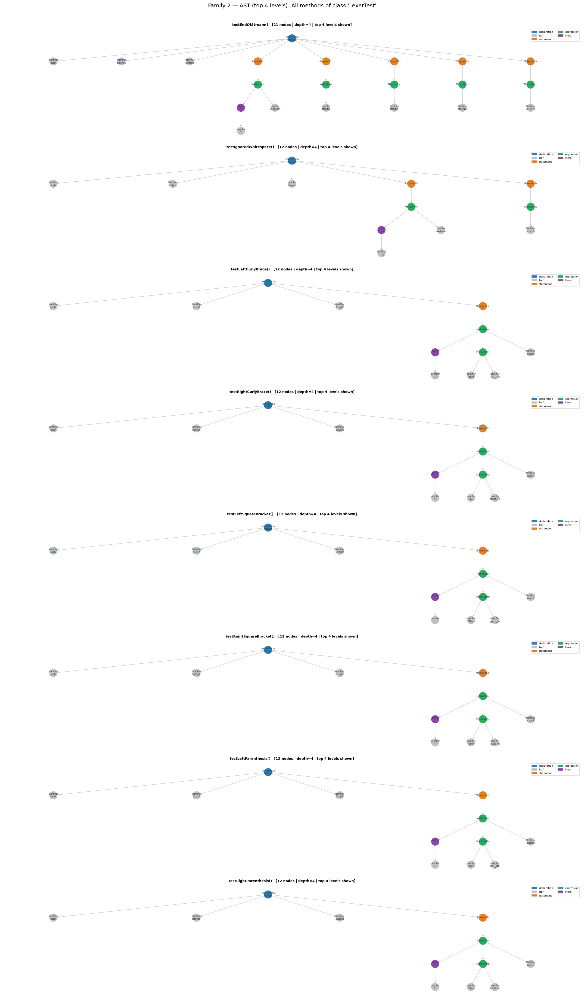

In [37]:
# ── Viz 4: Truncated AST (top-N levels) for all methods of one class ───────
MAX_DEPTH_SHOWN = 4

def prune_to_depth(Ag, root_nid, max_depth):
    keep = set(); queue = [(root_nid, 0)]
    while queue:
        n, d = queue.pop(0)
        keep.add(n)
        if d < max_depth:
            queue.extend((s, d + 1) for s in Ag.successors(n))
    return Ag.subgraph(keep).copy()

class_counts = Counter(r['class'] for r in ast_csv_rows if 6 <= r['n_ast_nodes'] <= 150)
if not class_counts:
    class_counts = Counter(r['class'] for r in ast_csv_rows)
target_class = class_counts.most_common(1)[0][0]
class_stats  = [r for r in ast_csv_rows
                if r['class'] == target_class
                and 6 <= r['n_ast_nodes'] <= 150
                and r['method_id'] in ast_subgraphs][:8]

print(f"Visualising class: {target_class}  ({len(class_stats)} methods shown)")
for s in class_stats:
    print(f"  {s['method']:30}  {s['n_ast_nodes']:4} nodes  depth={s['max_depth']}")

n_rows = len(class_stats)
if n_rows == 0:
    print("No graphs available for this class — re-run a200b004 with wider criteria")
else:
    fig, axes = plt.subplots(n_rows, 1, figsize=(18, 3.8 * n_rows))
    if n_rows == 1: axes = [axes]
    for ax, stat in zip(axes, class_stats):
        Ag       = ast_subgraphs[stat['method_id']]
        root_nid = ast_roots[stat['method_id']]
        sub      = prune_to_depth(Ag, root_nid, MAX_DEPTH_SHOWN)
        title    = (f"{stat['method']}()   [{stat['n_ast_nodes']} nodes | "
                    f"depth={stat['max_depth']} | top {MAX_DEPTH_SHOWN} levels shown]")
        draw_ast_tree(ax, sub, root_nid, title=title, max_nodes=9999)
    plt.suptitle(f"Family 2 — AST (top {MAX_DEPTH_SHOWN} levels): "
                 f"All methods of class '{target_class}'",
                 fontsize=12, y=1.005)
    plt.tight_layout()
    plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'ast_class_{target_class}.png'),
                bbox_inches='tight', dpi=120)
    plt.show()

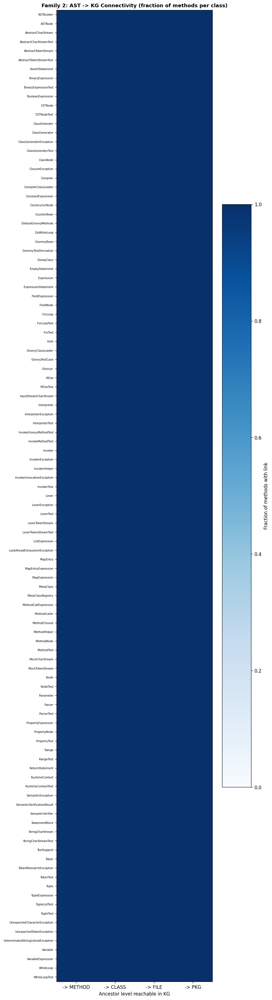

In [38]:
# ── Viz 5: Higher-level KG connectivity heatmap (per class) ───────────────
import numpy as np

all_classes_ast = sorted(set(r['class'] for r in ast_csv_rows))
link_keys   = ['has_method_link', 'has_class_ancestor',
               'has_file_ancestor', 'has_pkg_ancestor']
link_labels = ['-> METHOD', '-> CLASS', '-> FILE', '-> PKG']

heat = np.zeros((len(all_classes_ast), len(link_keys)))
for i, cls in enumerate(all_classes_ast):
    cls_rows = [r for r in ast_csv_rows if r['class'] == cls]
    n = len(cls_rows)
    if n:
        for j, key in enumerate(link_keys):
            heat[i, j] = sum(1 for r in cls_rows if r[key]) / n

fig, ax = plt.subplots(figsize=(8, max(6, len(all_classes_ast) * 0.28)))
im = ax.imshow(heat, cmap='Blues', aspect='auto', vmin=0, vmax=1)
ax.set_xticks(range(len(link_labels)))
ax.set_xticklabels(link_labels, fontsize=10)
ax.set_yticks(range(len(all_classes_ast)))
ax.set_yticklabels(all_classes_ast, fontsize=6)
ax.set_xlabel('Ancestor level reachable in KG', fontsize=10)
ax.set_title('Family 2: AST -> KG Connectivity (fraction of methods per class)',
             fontsize=11, fontweight='bold')
plt.colorbar(im, ax=ax, shrink=0.6, label='Fraction of methods with link')
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'ast_connectivity_heatmap.png'),
            bbox_inches='tight', dpi=130)
plt.show()

In [39]:
# ── Family 2 Summary + restore repo HEAD ───────────────────────────────────
total_ast_nodes = sum(r['n_ast_nodes'] for r in ast_csv_rows)
total_ast_edges = sum(r['n_edges']     for r in ast_csv_rows)
linked_m = sum(1 for r in ast_csv_rows if r['has_method_link'])
linked_c = sum(1 for r in ast_csv_rows if r['has_class_ancestor'])
linked_f = sum(1 for r in ast_csv_rows if r['has_file_ancestor'])
n_rows   = len(ast_csv_rows)

print("=" * 60)
print("Family 2: AST Subgraphs — Summary")
print("=" * 60)
print(f"  Methods analysed              : {n_rows:>7,}")
print(f"  Total AST nodes               : {total_ast_nodes:>7,}")
print(f"  Total AST edges               : {total_ast_edges:>7,}")
print(f"  Avg AST nodes / method        : {total_ast_nodes/max(1,n_rows):>7.1f}")
print(f"  Avg max depth / method        : "
      f"{sum(r['max_depth'] for r in ast_csv_rows)/max(1,n_rows):>7.1f}")
print(f"  Avg branching factor          : "
      f"{sum(r['avg_branching'] for r in ast_csv_rows)/max(1,n_rows):>7.2f}")
print(f"  Methods linked to METHOD node : {linked_m:>7,}  ({linked_m/max(1,n_rows)*100:.1f}%)")
print(f"  Methods with CLASS ancestor   : {linked_c:>7,}  ({linked_c/max(1,n_rows)*100:.1f}%)")
print(f"  Methods with FILE ancestor    : {linked_f:>7,}  ({linked_f/max(1,n_rows)*100:.1f}%)")
print(f"")
print(f"  G total nodes : {G.number_of_nodes():,}")
print(f"  G total edges : {G.number_of_edges():,}")
print(f"")
print(f"  Output: outputs/ast_subgraph_stats.csv")

# Free viz graphs from RAM
ast_subgraphs.clear(); ast_roots.clear()
import gc; gc.collect()

git(f'checkout {current_head}')
print(f"\nRestored HEAD to: {current_head}")
print("Viz graphs freed from RAM.")

Family 2: AST Subgraphs — Summary
  Methods analysed              :     996
  Total AST nodes               :  39,848
  Total AST edges               :  38,852
  Avg AST nodes / method        :    40.0
  Avg max depth / method        :     5.2
  Avg branching factor          :    1.92
  Methods linked to METHOD node :     996  (100.0%)
  Methods with CLASS ancestor   :     996  (100.0%)
  Methods with FILE ancestor    :     996  (100.0%)

  G total nodes : 40,652
  G total edges : 40,751

  Output: outputs/ast_subgraph_stats.csv

Restored HEAD to: 408b29851d7bbe4d343340832297e4be7e0c5578
Viz graphs freed from RAM.


---
## Family 3 — Control-Flow Representations (CFG)

Per-method **Control Flow Graphs** built from the javalang AST: basic statement
nodes connected by control edges (`TRUE`/`FALSE`/`NEXT`/`LOOP_BACK`/`CASE`/
`THROW`/`EXCEPTION`). From each CFG we derive cyclomatic complexity, loop/branch
counts, nesting depth, exception handling, and call sites; and we assemble a
project-level **call graph** (method→method).

As with Family 2, all parsing/CFG construction happens **offline** in a killable
subprocess (`build_cfg_features.py`) — run it once in a terminal:
```
python build_cfg_features.py
```
The cells below only **load and visualize** the resulting files; no javalang
parsing runs in the kernel.

In [40]:
# ── Family 3 Setup: CFG node groups, colours, layout + draw helpers ────────
# (kind→group map mirrors build_cfg_features.py exactly)
CFG_COLORS = {
    'entryexit': '#34495E', 'branch': '#E67E22', 'loop': '#C0392B',
    'switch': '#8E44AD', 'jump': '#16A085', 'exception': '#D35400',
    'simple': '#2980B9', 'other': '#95A5A6',
}
_KIND_GROUP = {
    'ENTRY': 'entryexit', 'EXIT': 'entryexit', 'IF': 'branch',
    'WHILE': 'loop', 'FOR': 'loop', 'DO_WHILE': 'loop',
    'SWITCH': 'switch', 'CASE': 'switch',
    'RETURN': 'jump', 'BREAK': 'jump', 'CONTINUE': 'jump', 'THROW': 'jump',
    'TRY': 'exception', 'CATCH': 'exception', 'SYNC': 'exception',
    'EXPR': 'simple', 'DECL': 'simple', 'ASSERT': 'simple',
    'STMT': 'simple', 'NOP': 'simple',
}
def cfg_group(kind): return _KIND_GROUP.get(kind, 'other')
def cfg_color(kind): return CFG_COLORS.get(cfg_group(kind), CFG_COLORS['other'])

# Edge colour / style per control-flow relation
EDGE_STYLE = {
    'NEXT':      ('#7F8C8D', 'solid',  0.05),
    'TRUE':      ('#27AE60', 'solid',  0.05),
    'FALSE':     ('#E74C3C', 'solid',  0.10),
    'LOOP_BACK': ('#8E44AD', 'dashed', 0.30),
    'CASE':      ('#2980B9', 'solid',  0.10),
    'FALL':      ('#F39C12', 'dotted', 0.05),
    'THROW':     ('#C0392B', 'solid',  0.20),
    'EXCEPTION': ('#D35400', 'dashed', 0.20),
    'RETURN':    ('#2C3E50', 'solid',  0.10),
}

def layered_cfg_pos(G, entry, x_gap=1.6, y_gap=1.0):
    """Top-down layered layout: layer = BFS distance from entry."""
    from collections import deque, defaultdict
    layer = {entry: 0}; q = deque([entry])
    while q:
        u = q.popleft()
        for v in G.successors(u):
            if v not in layer:
                layer[v] = layer[u] + 1; q.append(v)
    maxl = max(layer.values(), default=0)
    for n in G.nodes():
        layer.setdefault(n, maxl + 1)
    by = defaultdict(list)
    for n, l in layer.items(): by[l].append(n)
    pos = {}
    for l, nodes in by.items():
        nodes = sorted(nodes)
        k = len(nodes)
        for i, n in enumerate(nodes):
            pos[n] = ((i - (k - 1) / 2) * x_gap, -l * y_gap)
    return pos

def draw_cfg(ax, G, entry, title=None, max_nodes=60):
    if G.number_of_nodes() > max_nodes:
        from collections import deque
        keep, seen, q = [], set(), deque([entry])
        while q and len(keep) < max_nodes:
            u = q.popleft()
            if u in seen: continue
            seen.add(u); keep.append(u)
            q.extend(G.successors(u))
        sub = G.subgraph(keep).copy(); trunc = True
    else:
        sub = G; trunc = False

    pos = layered_cfg_pos(sub, entry)
    node_colors = [sub.nodes[n]['color'] for n in sub.nodes()]
    sizes = [430 if sub.nodes[n]['kind'] in ('ENTRY', 'EXIT') else 300
             for n in sub.nodes()]
    nx.draw_networkx_nodes(sub, pos, ax=ax, node_color=node_colors,
                           node_size=sizes, edgecolors='white', linewidths=0.7)
    labels = {n: (sub.nodes[n]['kind'][:6].lower()
                  if sub.nodes[n]['kind'] in ('ENTRY','EXIT','NOP')
                  else sub.nodes[n]['kind']) for n in sub.nodes()}
    nx.draw_networkx_labels(sub, pos, labels, ax=ax, font_size=5.2,
                            font_color='white', font_weight='bold')
    by_rel = {}
    for u, v, d in sub.edges(data=True):
        by_rel.setdefault(d.get('rel', 'NEXT'), []).append((u, v))
    for rel, elist in by_rel.items():
        col, style, rad = EDGE_STYLE.get(rel, ('#95A5A6', 'solid', 0.05))
        nx.draw_networkx_edges(sub, pos, edgelist=elist, ax=ax, edge_color=col,
                               style=style, width=1.0, arrows=True, arrowsize=8,
                               connectionstyle=f'arc3,rad={rad}',
                               node_size=320)
    grp_seen = {}
    for n in sub.nodes():
        g = sub.nodes[n]['group']
        grp_seen.setdefault(g, sub.nodes[n]['color'])
    handles = [mpatches.Patch(color=c, label=g) for g, c in grp_seen.items()]
    handles += [plt.Line2D([0], [0], color=EDGE_STYLE[r][0],
                ls=EDGE_STYLE[r][1], label=r)
                for r in ('TRUE','FALSE','LOOP_BACK','CASE') if r in by_rel]
    ax.legend(handles=handles, loc='upper right', fontsize=5, framealpha=0.7, ncol=2)
    suffix = f" (first {len(sub)} of {G.number_of_nodes()})" if trunc else ''
    ax.set_title((title or '') + suffix, fontsize=8, fontweight='bold')
    ax.axis('off')

print("Family 3 setup complete.")
for g, c in CFG_COLORS.items():
    print(f"  {g:10}: {c}")

Family 3 setup complete.
  entryexit : #34495E
  branch    : #E67E22
  loop      : #C0392B
  switch    : #8E44AD
  jump      : #16A085
  exception : #D35400
  simple    : #2980B9
  other     : #95A5A6


In [41]:
# ── Load CFG features produced by build_cfg_features.py ────────────────────
import json
from collections import Counter

_rows_path = PROJECT_ROOT / 'outputs' / 'cfg_rows.json'
_aggr_path = PROJECT_ROOT / 'outputs' / 'cfg_aggregates.json'
if not _rows_path.exists():
    raise FileNotFoundError(
        "outputs/cfg_rows.json not found.\n"
        "Run this first in a terminal from the project root:\n"
        "    python build_cfg_features.py")

with open(_rows_path, encoding='utf-8') as f:
    cfg_rows = json.load(f)
with open(_aggr_path, encoding='utf-8') as f:
    _caggr = json.load(f)

edge_totals = Counter(_caggr['edge_totals'])
node_totals = Counter(_caggr['node_totals'])

cyc = [r['cyclomatic']   for r in cfg_rows]
nn  = [r['n_cfg_nodes']  for r in cfg_rows]
print(f"Loaded {len(cfg_rows)} method CFG rows  ({_caggr['ok_files']} files OK, "
      f"{len(_caggr['skipped_files'])} skipped)")
print(f"CFG nodes  : min={min(nn)} med={sorted(nn)[len(nn)//2]} "
      f"mean={sum(nn)/len(nn):.1f} max={max(nn)}")
print(f"Cyclomatic : min={min(cyc)} med={sorted(cyc)[len(cyc)//2]} "
      f"mean={sum(cyc)/len(cyc):.2f} max={max(cyc)}")
print(f"Edge types : {dict(edge_totals.most_common())}")
print(f"Call graph : {_caggr['n_internal_call_edges']} internal edges, "
      f"{_caggr['n_external_call_names']} external callees")
if _caggr['skipped_files']:
    print(f"Skipped: {_caggr['skipped_files']}")

Loaded 996 method CFG rows  (120 files OK, 0 skipped)
CFG nodes  : min=3 med=3 mean=5.7 max=276
Cyclomatic : min=1 med=1 mean=1.53 max=86
Edge types : {'NEXT': 3935, 'RETURN': 460, 'TRUE': 337, 'LOOP_BACK': 166, 'CASE': 147, 'FALSE': 81, 'THROW': 54, 'EXCEPTION': 47}
Call graph : 4189 internal edges, 106 external callees


In [42]:
# ── Load example CFG graphs + project call graph ───────────────────────────
import pickle, json

EX_CFG_DIR = PROJECT_ROOT / 'outputs' / 'cfg_example_graphs'
cfg_graphs = {}   # method_id -> (DiGraph, entry_node)
for pf in sorted(EX_CFG_DIR.glob('*.pkl')):
    try:
        G_, entry = pickle.loads(pf.read_bytes())
    except Exception as e:
        print(f"  load error {pf.name}: {e}"); continue
    # method_id is stored on nodes? entry node id is 'N0'; recover mid from filename map
    # Instead, match by stats rows whose safe-id equals the filename stem.
    cfg_graphs[pf.stem] = (G_, entry)

# map safe-id stem -> method_id via cfg_rows
def _safe(mid): return "".join(c if c.isalnum() else "_" for c in mid)
_stem_to_mid = {_safe(r['method_id']): r['method_id'] for r in cfg_rows}
cfg_graphs = {_stem_to_mid.get(stem, stem): gv for stem, gv in cfg_graphs.items()}

with open(PROJECT_ROOT / 'outputs' / 'cfg_call_graph.json', encoding='utf-8') as f:
    call_graph = json.load(f)

print(f"Loaded {len(cfg_graphs)} example CFG graphs")
print(f"Call graph: {len(call_graph['nodes'])} methods, "
      f"{call_graph['n_internal_edges']} internal edges, "
      f"{call_graph['n_external_call_names']} external callee names")

Loaded 12 example CFG graphs
Call graph: 996 methods, 4189 internal edges, 106 external callee names


In [43]:
print(f"cfg_rows   : {len(cfg_rows)} rows")
print(f"cfg_graphs : {len(cfg_graphs)} example CFGs in RAM")
print(f"Columns: {list(cfg_rows[0].keys()) if cfg_rows else 'empty'}")

cfg_rows   : 996 rows
cfg_graphs : 12 example CFGs in RAM
Columns: ['method_id', 'file', 'class', 'method', 'kind', 'n_cfg_nodes', 'n_cfg_edges', 'cyclomatic', 'cyclomatic_decisions', 'n_decision_points', 'n_branches', 'n_loops', 'n_switch', 'n_returns', 'n_throws', 'n_breaks', 'n_continues', 'n_catch', 'has_try', 'n_back_edges', 'max_nesting', 'n_call_sites', 'n_throws_declared', 'throws_declared', 'n_node_kinds', 'kind_entropy', 'has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']


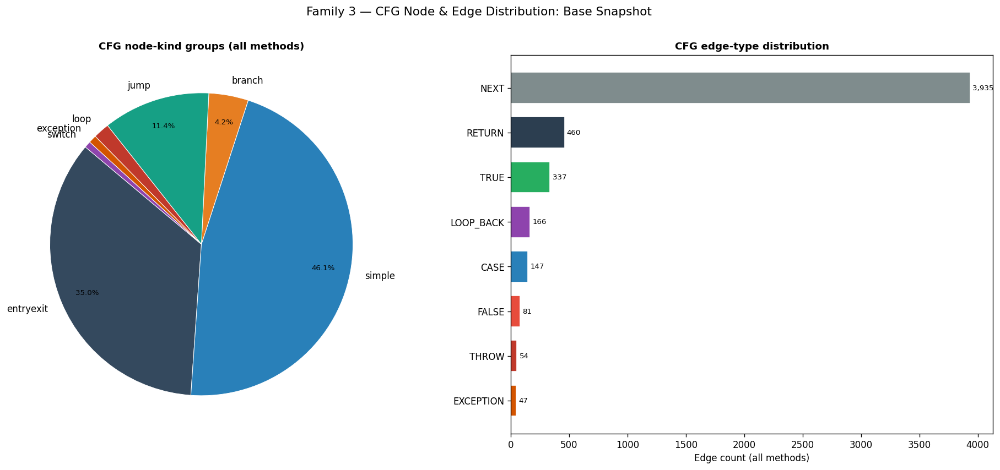

Total CFG nodes: 5,691  |  edges: 5,227


In [44]:
# ── Viz 1: CFG node-kind groups and edge-type distribution (all methods) ───
fig, (ax_pie, ax_bar) = plt.subplots(1, 2, figsize=(16, 7))

# group node kinds into the 8 display groups
grp_tot = Counter()
for kind, cnt in node_totals.items():
    grp_tot[cfg_group(kind)] += cnt
g_labels = list(grp_tot.keys())
g_sizes  = [grp_tot[g] for g in g_labels]
g_colors = [CFG_COLORS.get(g, CFG_COLORS['other']) for g in g_labels]
_, _, at = ax_pie.pie(g_sizes, labels=g_labels, colors=g_colors,
                      autopct=lambda p: f'{p:.1f}%' if p > 2 else '',
                      startangle=140, pctdistance=0.82,
                      wedgeprops={'linewidth': 0.6, 'edgecolor': 'white'})
for t in at: t.set_fontsize(8)
ax_pie.set_title('CFG node-kind groups (all methods)', fontsize=11, fontweight='bold')

et = edge_totals.most_common()
e_names  = [x[0] for x in et][::-1]
e_counts = [x[1] for x in et][::-1]
e_colors = [EDGE_STYLE.get(n, ('#95A5A6',))[0] for n in e_names]
ax_bar.barh(e_names, e_counts, color=e_colors, edgecolor='white', height=0.7)
for i, v in enumerate(e_counts):
    ax_bar.text(v + max(e_counts) * 0.005, i, f'{v:,}', va='center', fontsize=8)
ax_bar.set_xlabel('Edge count (all methods)', fontsize=10)
ax_bar.set_title('CFG edge-type distribution', fontsize=11, fontweight='bold')

plt.suptitle('Family 3 — CFG Node & Edge Distribution: Base Snapshot',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cfg_distribution.png'),
            bbox_inches='tight', dpi=140)
plt.show()
print(f"Total CFG nodes: {sum(node_totals.values()):,}  |  "
      f"edges: {sum(edge_totals.values()):,}")

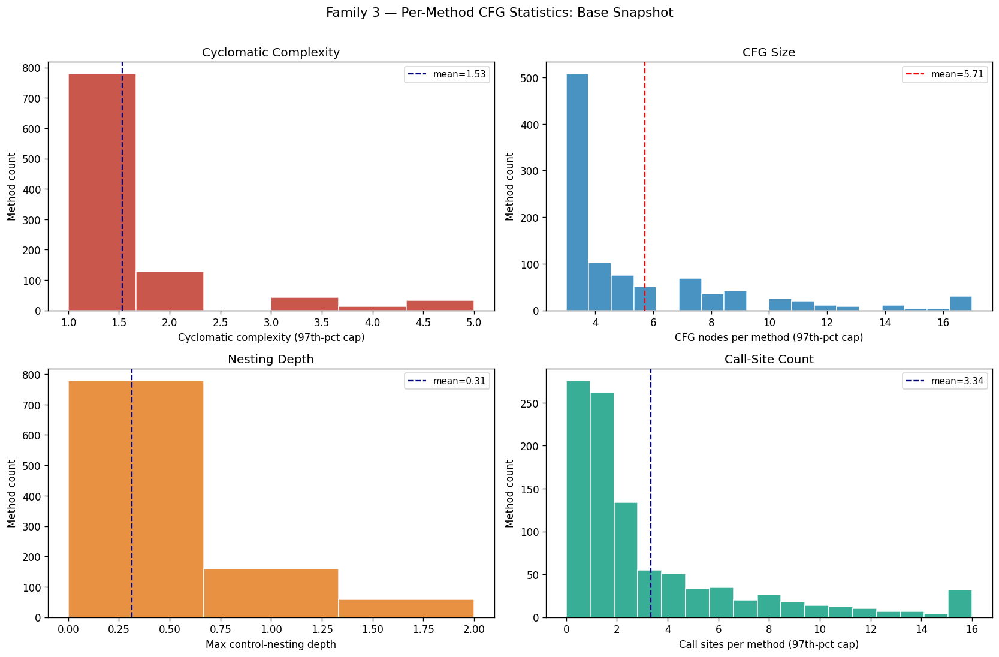

Top-8 methods by cyclomatic complexity:
  Lexer.nextToken                cyclo= 86 loops=6 branches=7 nesting=5 calls=265
  MetaClass.chooseMethod             cyclo= 20 loops=3 branches=16 nesting=7 calls=20
  Parser.statement                cyclo= 13 loops=0 branches=0 nesting=1 calls=6
  ClassGenerator.visitBinaryExpression    cyclo= 10 loops=0 branches=0 nesting=1 calls=11
  ClassGenerator.visitVariableExpression  cyclo= 10 loops=0 branches=9 nesting=5 calls=17
  Interpreter.visitBinaryExpression    cyclo=  9 loops=0 branches=0 nesting=1 calls=14
  Node.getText                  cyclo=  9 loops=1 branches=7 nesting=6 calls=6
  Compiler.main                     cyclo=  9 loops=0 branches=8 nesting=2 calls=48


In [45]:
# ── Viz 2: Per-method control-flow statistic distributions ─────────────────
cyc_v  = [r['cyclomatic']    for r in cfg_rows]
node_v = [r['n_cfg_nodes']   for r in cfg_rows]
nest_v = [r['max_nesting']   for r in cfg_rows]
call_v = [r['n_call_sites']  for r in cfg_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
def _hist(ax, vals, color, xlabel, title, vc='red'):
    cap = sorted(vals)[int(len(vals) * 0.97)] if len(vals) > 5 else max(vals)
    cap = max(cap, 1)
    clipped = [min(v, cap) for v in vals]
    mean = sum(vals) / len(vals)
    ax.hist(clipped, bins=min(40, cap + 1), color=color, edgecolor='white', alpha=0.85)
    ax.axvline(mean, color=vc, ls='--', lw=1.4, label=f'mean={mean:.2f}')
    ax.set_xlabel(xlabel); ax.set_ylabel('Method count')
    ax.set_title(title); ax.legend(fontsize=9)

_hist(axes[0,0], cyc_v,  '#C0392B', 'Cyclomatic complexity (97th-pct cap)',
      'Cyclomatic Complexity', 'navy')
_hist(axes[0,1], node_v, '#2980B9', 'CFG nodes per method (97th-pct cap)',
      'CFG Size')
_hist(axes[1,0], nest_v, '#E67E22', 'Max control-nesting depth',
      'Nesting Depth', 'navy')
_hist(axes[1,1], call_v, '#16A085', 'Call sites per method (97th-pct cap)',
      'Call-Site Count', 'navy')

plt.suptitle('Family 3 — Per-Method CFG Statistics: Base Snapshot',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cfg_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

# quick tabular summary of the most complex methods
print("Top-8 methods by cyclomatic complexity:")
for r in sorted(cfg_rows, key=lambda r: -r['cyclomatic'])[:8]:
    print(f"  {r['class']}.{r['method']:24} cyclo={r['cyclomatic']:3} "
          f"loops={r['n_loops']} branches={r['n_branches']} "
          f"nesting={r['max_nesting']} calls={r['n_call_sites']}")

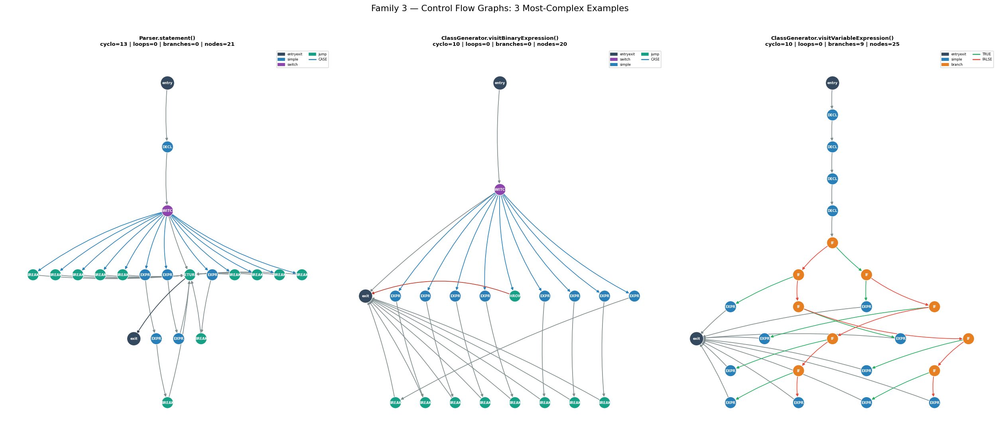

In [46]:
# ── Viz 3: Full CFG flow diagrams for 3 selected branchy methods ───────────
cand = sorted([r for r in cfg_rows
               if r['method_id'] in cfg_graphs and 6 <= r['n_cfg_nodes'] <= 45],
              key=lambda r: -r['cyclomatic'])
sel = cand[:3] if len(cand) >= 3 else [r for r in cfg_rows
                                       if r['method_id'] in cfg_graphs][:3]

fig, axes = plt.subplots(1, len(sel), figsize=(7 * len(sel), 9))
if len(sel) == 1: axes = [axes]
for ax, stat in zip(axes, sel):
    G_, entry = cfg_graphs[stat['method_id']]
    title = (f"{stat['class']}.{stat['method']}()\n"
             f"cyclo={stat['cyclomatic']} | loops={stat['n_loops']} | "
             f"branches={stat['n_branches']} | nodes={stat['n_cfg_nodes']}")
    draw_cfg(ax, G_, entry, title=title)

plt.suptitle('Family 3 — Control Flow Graphs: 3 Most-Complex Examples',
             fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cfg_3methods.png'),
            bbox_inches='tight', dpi=140)
plt.show()

Class: ParserTest  (6 CFGs shown)


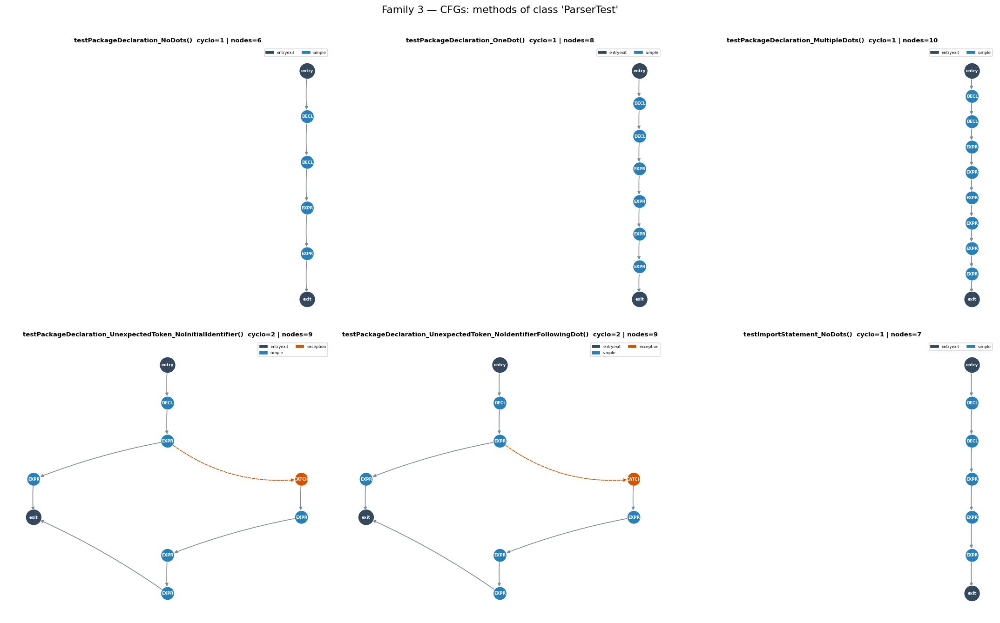

In [47]:
# ── Viz 4: CFGs for several methods of one class ───────────────────────────
# pick the class with the most example graphs available
_cls_of = lambda mid: mid.split('::')[1] if '::' in mid else '?'
from collections import Counter as _C
_avail = _C(_cls_of(mid) for mid in cfg_graphs)
target_class = _avail.most_common(1)[0][0]
sel = [r for r in cfg_rows
       if r['method_id'] in cfg_graphs and _cls_of(r['method_id']) == target_class][:6]

print(f"Class: {target_class}  ({len(sel)} CFGs shown)")
ncol = 3
nrow = (len(sel) + ncol - 1) // ncol
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 5.5 * nrow))
axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
for ax, stat in zip(axes, sel):
    G_, entry = cfg_graphs[stat['method_id']]
    title = (f"{stat['method']}()  cyclo={stat['cyclomatic']} | "
             f"nodes={stat['n_cfg_nodes']}")
    draw_cfg(ax, G_, entry, title=title)
for ax in axes[len(sel):]:
    ax.axis('off')

plt.suptitle(f"Family 3 — CFGs: methods of class '{target_class}'",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'cfg_class_{target_class}.png'),
            bbox_inches='tight', dpi=130)
plt.show()

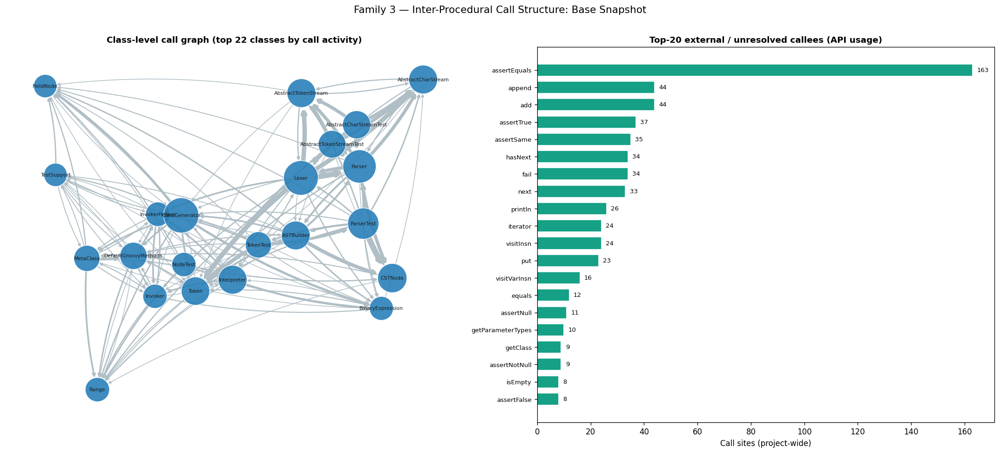

Class-call edges: 862  |  shown classes: 22


In [48]:
# ── Viz 5: Project call graph (class-level) + top external callees ─────────
import numpy as np

_cls_of = lambda mid: mid.split('::')[1] if '::' in mid else '?'

# Aggregate method->method internal edges to class->class
cls_edges = Counter()
for e in call_graph['internal_edges']:
    a, b = _cls_of(e['caller']), _cls_of(e['callee'])
    if a != b:                       # drop self-loops for readability
        cls_edges[(a, b)] += e['count']

Cg = nx.DiGraph()
for (a, b), w in cls_edges.items():
    Cg.add_edge(a, b, weight=w)

# keep the top-N classes by total (in+out) weighted degree
deg = Counter()
for a, b, d in Cg.edges(data=True):
    deg[a] += d['weight']; deg[b] += d['weight']
top_classes = [c for c, _ in deg.most_common(22)]
sub = Cg.subgraph(top_classes).copy()

fig, (ax_g, ax_b) = plt.subplots(1, 2, figsize=(18, 8))

pos = nx.spring_layout(sub, k=0.9, seed=42, iterations=80)
nsize = [300 + 60 * deg[n] ** 0.5 for n in sub.nodes()]
nx.draw_networkx_nodes(sub, pos, ax=ax_g, node_size=nsize,
                       node_color='#2980B9', edgecolors='white', linewidths=0.8,
                       alpha=0.9)
ew = [0.4 + 0.5 * sub[u][v]['weight'] ** 0.5 for u, v in sub.edges()]
nx.draw_networkx_edges(sub, pos, ax=ax_g, edge_color='#B0BEC5', width=ew,
                       arrows=True, arrowsize=8, connectionstyle='arc3,rad=0.08',
                       node_size=nsize)
nx.draw_networkx_labels(sub, pos, ax=ax_g, font_size=6.5, font_color='#1A1A1A')
ax_g.set_title(f'Class-level call graph (top {len(sub)} classes by call activity)',
               fontsize=11, fontweight='bold')
ax_g.axis('off')

top_ext = call_graph['top_external'][:20][::-1]
en = [x[0] for x in top_ext]; ec = [x[1] for x in top_ext]
ax_b.barh(en, ec, color='#16A085', edgecolor='white', height=0.7)
for i, v in enumerate(ec):
    ax_b.text(v + max(ec) * 0.01, i, str(v), va='center', fontsize=8)
ax_b.set_xlabel('Call sites (project-wide)', fontsize=10)
ax_b.set_title('Top-20 external / unresolved callees (API usage)',
               fontsize=11, fontweight='bold')
ax_b.tick_params(axis='y', labelsize=8)

plt.suptitle('Family 3 — Inter-Procedural Call Structure: Base Snapshot',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cfg_call_graph.png'),
            bbox_inches='tight', dpi=130)
plt.show()
print(f"Class-call edges: {len(cls_edges)}  |  shown classes: {len(sub)}")

In [49]:
# ── Family 3 Summary + restore repo HEAD ───────────────────────────────────
n = len(cfg_rows)
tot_nodes = sum(r['n_cfg_nodes'] for r in cfg_rows)
tot_edges = sum(r['n_cfg_edges'] for r in cfg_rows)
loops_m   = sum(1 for r in cfg_rows if r['n_loops'] > 0)
try_m     = sum(1 for r in cfg_rows if r['has_try'])
branch_m  = sum(1 for r in cfg_rows if r['n_branches'] > 0)

print("=" * 60)
print("Family 3: Control-Flow Graphs — Summary")
print("=" * 60)
print(f"  Methods analysed              : {n:>7,}")
print(f"  Total CFG nodes               : {tot_nodes:>7,}")
print(f"  Total CFG edges               : {tot_edges:>7,}")
print(f"  Avg CFG nodes / method        : {tot_nodes/max(1,n):>7.1f}")
print(f"  Avg cyclomatic complexity     : {sum(r['cyclomatic'] for r in cfg_rows)/max(1,n):>7.2f}")
print(f"  Max cyclomatic complexity     : {max(r['cyclomatic'] for r in cfg_rows):>7}")
print(f"  Avg max-nesting depth         : {sum(r['max_nesting'] for r in cfg_rows)/max(1,n):>7.2f}")
print(f"  Methods with loops            : {loops_m:>7,}  ({loops_m/max(1,n)*100:.1f}%)")
print(f"  Methods with branches (if)    : {branch_m:>7,}  ({branch_m/max(1,n)*100:.1f}%)")
print(f"  Methods with try/catch/sync   : {try_m:>7,}  ({try_m/max(1,n)*100:.1f}%)")
print(f"  Internal call-graph edges     : {call_graph['n_internal_edges']:>7,}")
print(f"  Distinct external callees     : {call_graph['n_external_call_names']:>7,}")
print(f"")
print(f"  Outputs:")
print(f"    outputs/cfg_subgraph_stats.csv")
print(f"    outputs/cfg_call_graph.json")
print(f"    outputs/cfg_example_graphs/  ({len(cfg_graphs)} .pkl files)")
print(f"    outputs/plots/cfg_distribution.png")
print(f"    outputs/plots/cfg_method_stats.png")
print(f"    outputs/plots/cfg_3methods.png")
print(f"    outputs/plots/cfg_class_*.png")
print(f"    outputs/plots/cfg_call_graph.png")

git(f'checkout {current_head}')
print(f"\nRestored HEAD to: {current_head}")

Family 3: Control-Flow Graphs — Summary
  Methods analysed              :     996
  Total CFG nodes               :   5,691
  Total CFG edges               :   5,227
  Avg CFG nodes / method        :     5.7
  Avg cyclomatic complexity     :    1.53
  Max cyclomatic complexity     :      86
  Avg max-nesting depth         :    0.31
  Methods with loops            :      81  (8.1%)
  Methods with branches (if)    :     121  (12.1%)
  Methods with try/catch/sync   :      42  (4.2%)
  Internal call-graph edges     :   4,189
  Distinct external callees     :     106

  Outputs:
    outputs/cfg_subgraph_stats.csv
    outputs/cfg_call_graph.json
    outputs/cfg_example_graphs/  (12 .pkl files)
    outputs/plots/cfg_distribution.png
    outputs/plots/cfg_method_stats.png
    outputs/plots/cfg_3methods.png
    outputs/plots/cfg_class_*.png
    outputs/plots/cfg_call_graph.png

Restored HEAD to: 408b29851d7bbe4d343340832297e4be7e0c5578


---
## Family 4 — Data-Flow Representations (DFG / def-use)

Per-method **intra-procedural def-use graphs** over local variables: `DEF` nodes
(parameters, declarations, assignments, loop vars, catch vars) and `USE` nodes
(variable reads), connected by `DDG_REACHES` edges (a definition reaches a use).
Built by a reaching-definitions walk (gen/kill with branch-union; loops
single-pass — a source-level approximation, as the design doc notes).

From each def-use graph we derive: variable count, def/use counts, def-use edge
count, fan-out per definition (reuse), **unused definitions** (potential dead
stores), and **undef uses** (reads with no local reaching def — typically field
accesses). Offline extractor (killable subprocess), run once:
```
python build_dfg_features.py
```
The cells below only load + visualize.

In [50]:
# ── Family 4 Setup: DFG colours + per-variable-column layout + draw helper ─
DFG_COLORS  = {'def': '#C0392B', 'use': '#2980B9', 'other': '#95A5A6'}
DEFTYPE_COLORS = {
    'param': '#16A085', 'decl': '#2980B9', 'assign': '#E67E22',
    'update': '#8E44AD', 'forvar': '#27AE60', 'catchvar': '#C0392B',
}
# a categorical palette to colour nodes by variable
_VAR_PALETTE = ['#2980B9','#E67E22','#27AE60','#8E44AD','#C0392B','#16A085',
                '#D35400','#2C3E50','#7F8C8D','#F39C12','#1ABC9C','#9B59B6',
                '#34495E','#E74C3C','#3498DB','#95A5A6']
def var_color(var, _cache={}):
    if var not in _cache:
        _cache[var] = _VAR_PALETTE[len(_cache) % len(_VAR_PALETTE)]
    return _cache[var]

def dfg_var_pos(G, x_gap=2.2, y_gap=1.0):
    """Lay out def-use nodes in one column per variable; y by source line/order.
    (DDG_REACHES only connects def(v)->use(v), so each variable is its own chain.)"""
    vars_sorted = sorted({d['var'] for _, d in G.nodes(data=True)})
    col = {v: i for i, v in enumerate(vars_sorted)}
    # order nodes within a column by line, then by node id for stability
    order = sorted(G.nodes(data=True),
                   key=lambda nd: (nd[1]['var'], nd[1].get('line', 0), nd[0]))
    yrank, seen = {}, {}
    for nid, d in order:
        v = d['var']; seen[v] = seen.get(v, 0)
        yrank[nid] = seen[v]; seen[v] += 1
    pos = {}
    for nid, d in G.nodes(data=True):
        pos[nid] = (col[d['var']] * x_gap, -yrank[nid] * y_gap)
    return pos, vars_sorted

def draw_dfg(ax, G, title=None, max_nodes=70):
    if G.number_of_nodes() == 0:
        ax.text(0.5, 0.5, '(no local data flow)', ha='center', va='center',
                fontsize=9); ax.set_title(title or '', fontsize=8); ax.axis('off'); return
    if G.number_of_nodes() > max_nodes:
        keep = [n for n, _ in sorted(G.nodes(data=True),
                key=lambda nd: nd[1].get('line', 0))[:max_nodes]]
        G = G.subgraph(keep).copy()
    pos, vars_sorted = dfg_var_pos(G)
    # node colour by variable; shape by def/use (def=square, use=circle)
    defs = [n for n, d in G.nodes(data=True) if d['kind'] == 'DEF']
    uses = [n for n, d in G.nodes(data=True) if d['kind'] == 'USE']
    nx.draw_networkx_nodes(G, pos, nodelist=defs, ax=ax, node_shape='s',
        node_color=[var_color(G.nodes[n]['var']) for n in defs],
        node_size=320, edgecolors='black', linewidths=0.8)
    nx.draw_networkx_nodes(G, pos, nodelist=uses, ax=ax, node_shape='o',
        node_color=[var_color(G.nodes[n]['var']) for n in uses],
        node_size=230, edgecolors='white', linewidths=0.8, alpha=0.9)
    nx.draw_networkx_edges(G, pos, ax=ax, edge_color='#7F8C8D', width=0.9,
        arrows=True, arrowsize=8, connectionstyle='arc3,rad=0.12', node_size=300)
    labels = {n: (d['var'][:8] + ('=' if d['kind'] == 'DEF' else ''))
              for n, d in G.nodes(data=True)}
    nx.draw_networkx_labels(G, pos, labels, ax=ax, font_size=5, font_color='#1A1A1A')
    # x-axis variable headers
    _, xs = dfg_var_pos(G)
    ax.set_title((title or ''), fontsize=8, fontweight='bold')
    ax.axis('off')
    handles = [mpatches.Patch(facecolor='#888', edgecolor='black', label='DEF (square)'),
               plt.Line2D([0],[0], marker='o', color='w', markerfacecolor='#888',
                          markersize=8, label='USE (circle)')]
    ax.legend(handles=handles, loc='upper right', fontsize=5.5, framealpha=0.7)

print("Family 4 setup complete.")
for k, c in DFG_COLORS.items(): print(f"  {k:6}: {c}")

Family 4 setup complete.
  def   : #C0392B
  use   : #2980B9
  other : #95A5A6


In [51]:
# ── Load DFG features produced by build_dfg_features.py ────────────────────
import json
from collections import Counter

_rows_path = PROJECT_ROOT / 'outputs' / 'dfg_rows.json'
_aggr_path = PROJECT_ROOT / 'outputs' / 'dfg_aggregates.json'
if not _rows_path.exists():
    raise FileNotFoundError(
        "outputs/dfg_rows.json not found.\n"
        "Run first in a terminal:  python build_dfg_features.py")

with open(_rows_path, encoding='utf-8') as f:
    dfg_rows = json.load(f)
with open(_aggr_path, encoding='utf-8') as f:
    _daggr = json.load(f)

group_totals   = Counter(_daggr['group_totals'])
deftype_totals = Counter(_daggr['deftype_totals'])

edg = [r['n_du_edges']  for r in dfg_rows]
nv  = [r['n_variables'] for r in dfg_rows]
print(f"Loaded {len(dfg_rows)} method DFG rows  ({_daggr['ok_files']} files OK, "
      f"{len(_daggr['skipped_files'])} skipped)")
print(f"Def-use edges : min={min(edg)} med={sorted(edg)[len(edg)//2]} "
      f"mean={sum(edg)/len(edg):.1f} max={max(edg)}")
print(f"Variables/meth: min={min(nv)} med={sorted(nv)[len(nv)//2]} "
      f"mean={sum(nv)/len(nv):.1f} max={max(nv)}")
print(f"Node groups   : DEF={group_totals['def']:,}  USE={group_totals['use']:,}")
print(f"Def types     : {dict(deftype_totals.most_common())}")
print(f"Total unused defs (dead-store candidates): "
      f"{sum(r['n_unused_defs'] for r in dfg_rows):,}")

Loaded 996 method DFG rows  (120 files OK, 0 skipped)
Def-use edges : min=0 med=1 mean=2.0 max=86
Variables/meth: min=0 med=1 mean=1.5 max=19
Node groups   : DEF=1,709  USE=2,021
Def types     : {'param': 749, 'decl': 670, 'assign': 201, 'catchvar': 47, 'update': 42}
Total unused defs (dead-store candidates): 513


In [52]:
# ── Load example def-use graphs ────────────────────────────────────────────
import pickle
EX_DFG_DIR = PROJECT_ROOT / 'outputs' / 'dfg_example_graphs'
def _safe(mid): return "".join(c if c.isalnum() else "_" for c in mid)
_stem_to_mid = {_safe(r['method_id']): r['method_id'] for r in dfg_rows}

dfg_graphs = {}   # method_id -> DiGraph
for pf in sorted(EX_DFG_DIR.glob('*.pkl')):
    try:
        G_ = pickle.loads(pf.read_bytes())
    except Exception as e:
        print(f"  load error {pf.name}: {e}"); continue
    dfg_graphs[_stem_to_mid.get(pf.stem, pf.stem)] = G_

print(f"Loaded {len(dfg_graphs)} example def-use graphs")
if dfg_graphs:
    tot = sum(g.number_of_nodes() for g in dfg_graphs.values())
    print(f"Total nodes across examples: {tot}")

Loaded 12 example def-use graphs
Total nodes across examples: 265


In [53]:
print(f"dfg_rows   : {len(dfg_rows)} rows")
print(f"dfg_graphs : {len(dfg_graphs)} example def-use graphs in RAM")
print(f"Columns: {list(dfg_rows[0].keys()) if dfg_rows else 'empty'}")

dfg_rows   : 996 rows
dfg_graphs : 12 example def-use graphs in RAM
Columns: ['method_id', 'file', 'class', 'method', 'kind', 'n_def_nodes', 'n_use_nodes', 'n_dfg_nodes', 'n_du_edges', 'n_variables', 'n_params', 'n_unused_defs', 'n_undef_uses', 'max_uses_per_def', 'avg_uses_per_def', 'max_defs_per_use', 'du_density', 'var_entropy', 'has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']


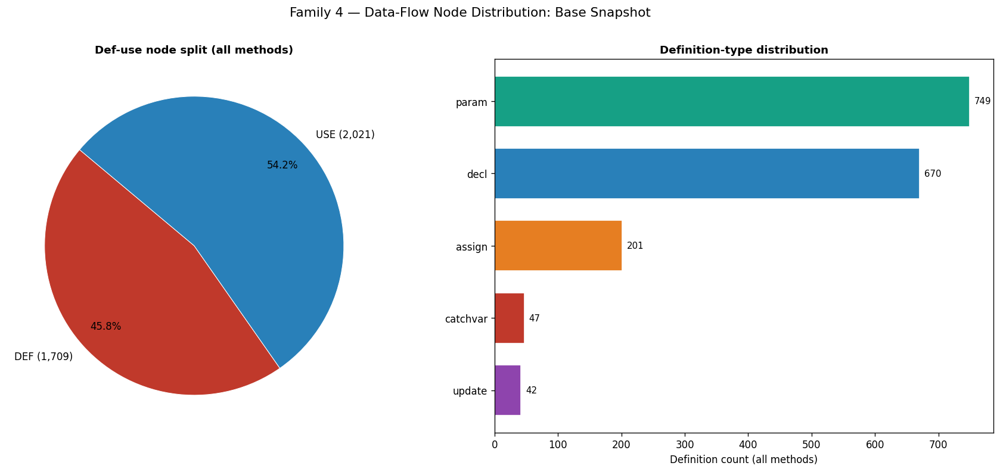

Total DEF: 1,709  USE: 2,021  DDG_REACHES edges: 1,991


In [54]:
# ── Viz 1: DEF vs USE node split + definition-type distribution ────────────
fig, (ax_pie, ax_bar) = plt.subplots(1, 2, figsize=(15, 6.5))

g_labels = ['def', 'use']
g_sizes  = [group_totals['def'], group_totals['use']]
ax_pie.pie(g_sizes, labels=[f'DEF ({g_sizes[0]:,})', f'USE ({g_sizes[1]:,})'],
           colors=[DFG_COLORS['def'], DFG_COLORS['use']], autopct='%1.1f%%',
           startangle=140, pctdistance=0.8,
           wedgeprops={'linewidth': 0.6, 'edgecolor': 'white'})
ax_pie.set_title('Def-use node split (all methods)', fontsize=11, fontweight='bold')

dt = deftype_totals.most_common()
d_names = [x[0] for x in dt][::-1]; d_counts = [x[1] for x in dt][::-1]
d_colors = [DEFTYPE_COLORS.get(n, '#95A5A6') for n in d_names]
ax_bar.barh(d_names, d_counts, color=d_colors, edgecolor='white', height=0.7)
for i, v in enumerate(d_counts):
    ax_bar.text(v + max(d_counts) * 0.01, i, f'{v:,}', va='center', fontsize=9)
ax_bar.set_xlabel('Definition count (all methods)', fontsize=10)
ax_bar.set_title('Definition-type distribution', fontsize=11, fontweight='bold')

plt.suptitle('Family 4 — Data-Flow Node Distribution: Base Snapshot',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'dfg_distribution.png'),
            bbox_inches='tight', dpi=140)
plt.show()
print(f"Total DEF: {group_totals['def']:,}  USE: {group_totals['use']:,}  "
      f"DDG_REACHES edges: {sum(r['n_du_edges'] for r in dfg_rows):,}")

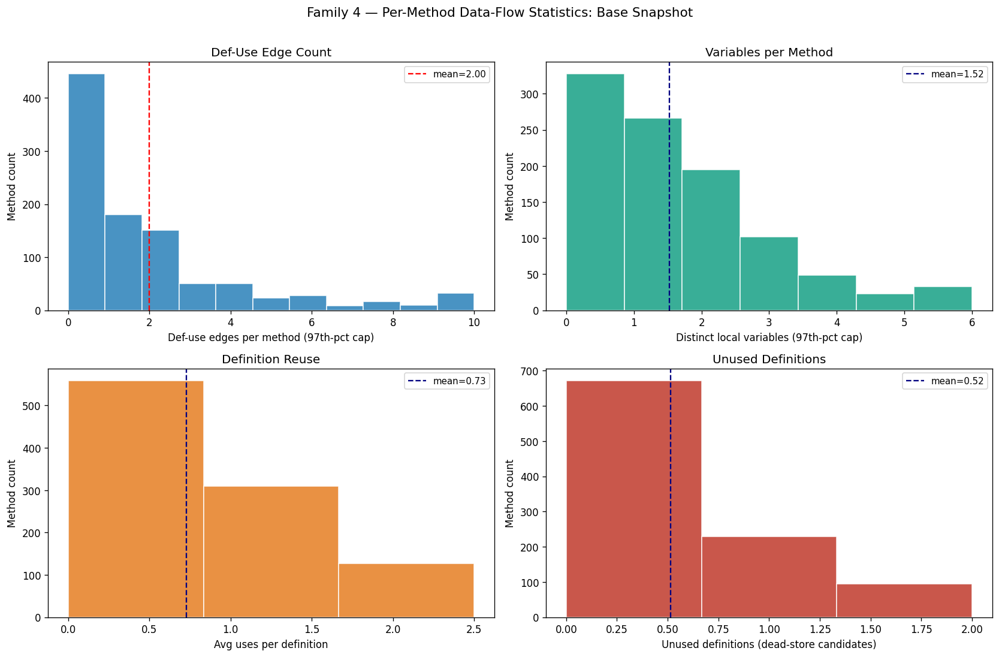

Top-8 methods by def-use edges:
  Lexer.nextToken              edges= 86 vars= 7 defs= 72 uses= 48 unused=45
  MetaClass.chooseMethod           edges= 48 vars=19 defs= 29 uses= 40 unused=6
  BinaryExpressionTest.testBinaryExpressions  edges= 46 vars= 3 defs=  3 uses= 46 unused=0
  BinaryExpressionTest.testNotComparableObjectFailure edges= 28 vars= 3 defs=  3 uses= 28 unused=0
  MetaClass.invokeMethod           edges= 27 vars= 9 defs= 11 uses= 25 unused=1
  MetaClass.MetaClass              edges= 23 vars=12 defs= 14 uses= 26 unused=4
  ClassGenerator.visitProperty          edges= 19 vars=10 defs= 12 uses= 17 unused=0
  ASTBuilder.classDeclaration       edges= 18 vars= 9 defs= 13 uses= 20 unused=3


In [55]:
# ── Viz 2: Per-method data-flow statistic distributions ────────────────────
edge_v  = [r['n_du_edges']   for r in dfg_rows]
var_v   = [r['n_variables']  for r in dfg_rows]
upd_v   = [r['avg_uses_per_def'] for r in dfg_rows]
dead_v  = [r['n_unused_defs'] for r in dfg_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
def _hist(ax, vals, color, xlabel, title, vc='red'):
    cap = sorted(vals)[int(len(vals) * 0.97)] if len(vals) > 5 else max(vals + [1])
    cap = max(cap, 1)
    clipped = [min(v, cap) for v in vals]
    mean = sum(vals) / len(vals)
    bins = min(40, int(cap) + 1) if cap >= 1 else 10
    ax.hist(clipped, bins=bins, color=color, edgecolor='white', alpha=0.85)
    ax.axvline(mean, color=vc, ls='--', lw=1.4, label=f'mean={mean:.2f}')
    ax.set_xlabel(xlabel); ax.set_ylabel('Method count'); ax.set_title(title)
    ax.legend(fontsize=9)

_hist(axes[0,0], edge_v, '#2980B9', 'Def-use edges per method (97th-pct cap)',
      'Def-Use Edge Count')
_hist(axes[0,1], var_v,  '#16A085', 'Distinct local variables (97th-pct cap)',
      'Variables per Method', 'navy')
_hist(axes[1,0], upd_v,  '#E67E22', 'Avg uses per definition',
      'Definition Reuse', 'navy')
_hist(axes[1,1], dead_v, '#C0392B', 'Unused definitions (dead-store candidates)',
      'Unused Definitions', 'navy')

plt.suptitle('Family 4 — Per-Method Data-Flow Statistics: Base Snapshot',
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'dfg_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

print("Top-8 methods by def-use edges:")
for r in sorted(dfg_rows, key=lambda r: -r['n_du_edges'])[:8]:
    print(f"  {r['class']}.{r['method']:22} edges={r['n_du_edges']:3} "
          f"vars={r['n_variables']:2} defs={r['n_def_nodes']:3} "
          f"uses={r['n_use_nodes']:3} unused={r['n_unused_defs']}")

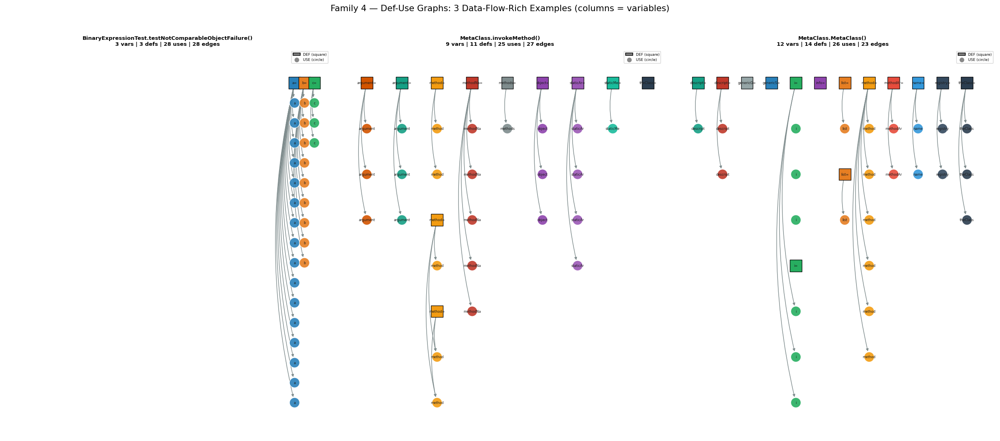

In [56]:
# ── Viz 3: Def-use graphs for 3 selected data-flow-rich methods ────────────
cand = sorted([r for r in dfg_rows
               if r['method_id'] in dfg_graphs and 6 <= r['n_dfg_nodes'] <= 40],
              key=lambda r: -r['n_du_edges'])
sel = cand[:3] if len(cand) >= 3 else [r for r in dfg_rows
                                       if r['method_id'] in dfg_graphs][:3]

fig, axes = plt.subplots(1, len(sel), figsize=(7 * len(sel), 9))
if len(sel) == 1: axes = [axes]
for ax, stat in zip(axes, sel):
    G_ = dfg_graphs[stat['method_id']]
    title = (f"{stat['class']}.{stat['method']}()\n"
             f"{stat['n_variables']} vars | {stat['n_def_nodes']} defs | "
             f"{stat['n_use_nodes']} uses | {stat['n_du_edges']} edges")
    draw_dfg(ax, G_, title=title)

plt.suptitle('Family 4 — Def-Use Graphs: 3 Data-Flow-Rich Examples '
             '(columns = variables)', fontsize=13, y=1.02)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'dfg_3methods.png'),
            bbox_inches='tight', dpi=140)
plt.show()

Class: ASTBuilder  (6 def-use graphs shown)


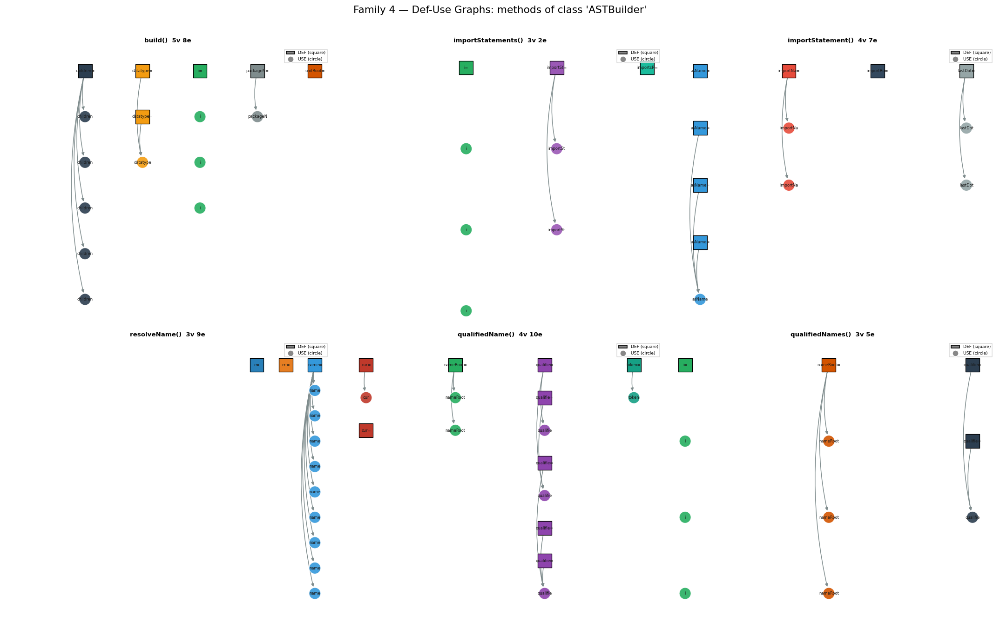

In [57]:
# ── Viz 4: Def-use graphs for several methods of one class ─────────────────
_cls_of = lambda mid: mid.split('::')[1] if '::' in mid else '?'
from collections import Counter as _C
_avail = _C(_cls_of(mid) for mid in dfg_graphs)
target_class = _avail.most_common(1)[0][0]
sel = [r for r in dfg_rows
       if r['method_id'] in dfg_graphs and _cls_of(r['method_id']) == target_class][:6]

print(f"Class: {target_class}  ({len(sel)} def-use graphs shown)")
ncol = 3
nrow = (len(sel) + ncol - 1) // ncol
fig, axes = plt.subplots(nrow, ncol, figsize=(6 * ncol, 5.5 * nrow))
axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
for ax, stat in zip(axes, sel):
    G_ = dfg_graphs[stat['method_id']]
    draw_dfg(ax, G_, title=f"{stat['method']}()  {stat['n_variables']}v "
             f"{stat['n_du_edges']}e")
for ax in axes[len(sel):]:
    ax.axis('off')

plt.suptitle(f"Family 4 — Def-Use Graphs: methods of class '{target_class}'",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'dfg_class_{target_class}.png'),
            bbox_inches='tight', dpi=130)
plt.show()

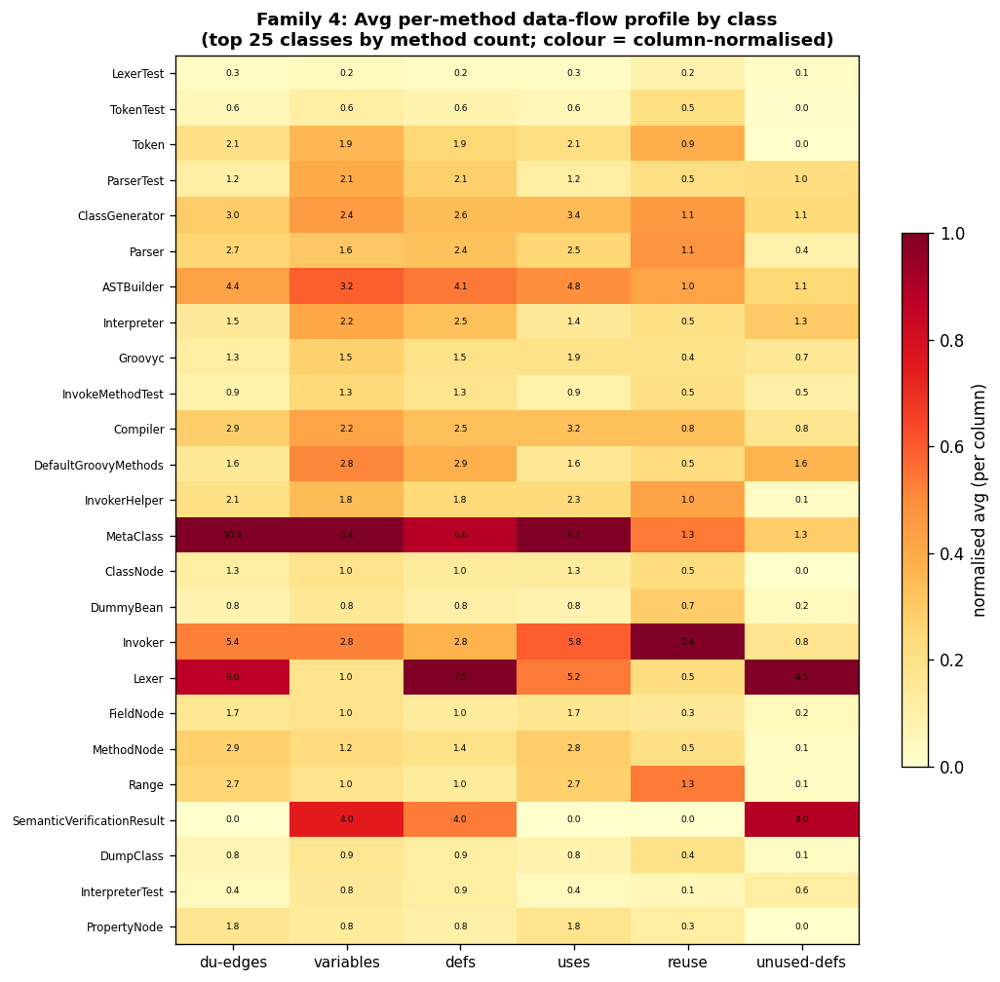

Classes profiled: 25


In [58]:
# ── Viz 5: Per-class data-flow profile heatmap (top classes) ───────────────
import numpy as np
from collections import defaultdict

by_class = defaultdict(list)
for r in dfg_rows:
    by_class[r['class']].append(r)
ranked = sorted(by_class.items(), key=lambda kv: -len(kv[1]))[:25]
classes = [c for c, _ in ranked]

metrics = ['n_du_edges', 'n_variables', 'n_def_nodes', 'n_use_nodes',
           'avg_uses_per_def', 'n_unused_defs']
labels  = ['du-edges', 'variables', 'defs', 'uses', 'reuse', 'unused-defs']
mat = np.zeros((len(classes), len(metrics)))
for i, c in enumerate(classes):
    rows = by_class[c]
    for j, m in enumerate(metrics):
        mat[i, j] = sum(r[m] for r in rows) / len(rows)
# normalise each column to [0,1] for comparability
norm = mat / (mat.max(axis=0, keepdims=True) + 1e-9)

fig, ax = plt.subplots(figsize=(9, max(6, len(classes) * 0.34)))
im = ax.imshow(norm, cmap='YlOrRd', aspect='auto')
ax.set_xticks(range(len(labels))); ax.set_xticklabels(labels, fontsize=9)
ax.set_yticks(range(len(classes))); ax.set_yticklabels(classes, fontsize=7)
for i in range(len(classes)):
    for j in range(len(metrics)):
        ax.text(j, i, f'{mat[i,j]:.1f}', ha='center', va='center',
                fontsize=5.5, color='black')
ax.set_title('Family 4: Avg per-method data-flow profile by class\n'
             '(top 25 classes by method count; colour = column-normalised)',
             fontsize=11, fontweight='bold')
plt.colorbar(im, ax=ax, shrink=0.6, label='normalised avg (per column)')
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'dfg_class_heatmap.png'),
            bbox_inches='tight', dpi=130)
plt.show()
print(f"Classes profiled: {len(classes)}")

In [59]:
# ── Family 4 Summary + restore repo HEAD ───────────────────────────────────
n = len(dfg_rows)
tot_def = sum(r['n_def_nodes'] for r in dfg_rows)
tot_use = sum(r['n_use_nodes'] for r in dfg_rows)
tot_edg = sum(r['n_du_edges']  for r in dfg_rows)
tot_dead = sum(r['n_unused_defs'] for r in dfg_rows)
tot_undef = sum(r['n_undef_uses'] for r in dfg_rows)
with_df = sum(1 for r in dfg_rows if r['n_du_edges'] > 0)

print("=" * 60)
print("Family 4: Data-Flow (def-use) Graphs — Summary")
print("=" * 60)
print(f"  Methods analysed              : {n:>7,}")
print(f"  Total DEF nodes               : {tot_def:>7,}")
print(f"  Total USE nodes               : {tot_use:>7,}")
print(f"  Total DDG_REACHES edges       : {tot_edg:>7,}")
print(f"  Avg def-use edges / method    : {tot_edg/max(1,n):>7.2f}")
print(f"  Avg variables / method        : {sum(r['n_variables'] for r in dfg_rows)/max(1,n):>7.2f}")
print(f"  Methods with data flow        : {with_df:>7,}  ({with_df/max(1,n)*100:.1f}%)")
print(f"  Unused defs (dead-store cand.): {tot_dead:>7,}")
print(f"  Undef uses (field/ext reads)  : {tot_undef:>7,}")
print(f"")
print(f"  Outputs:")
print(f"    outputs/dfg_subgraph_stats.csv")
print(f"    outputs/dfg_example_graphs/  ({len(dfg_graphs)} .pkl files)")
print(f"    outputs/plots/dfg_distribution.png")
print(f"    outputs/plots/dfg_method_stats.png")
print(f"    outputs/plots/dfg_3methods.png")
print(f"    outputs/plots/dfg_class_*.png")
print(f"    outputs/plots/dfg_class_heatmap.png")

git(f'checkout {current_head}')
print(f"\nRestored HEAD to: {current_head}")

Family 4: Data-Flow (def-use) Graphs — Summary
  Methods analysed              :     996
  Total DEF nodes               :   1,709
  Total USE nodes               :   2,021
  Total DDG_REACHES edges       :   1,991
  Avg def-use edges / method    :    2.00
  Avg variables / method        :    1.52
  Methods with data flow        :     550  (55.2%)
  Unused defs (dead-store cand.):     513
  Undef uses (field/ext reads)  :     134

  Outputs:
    outputs/dfg_subgraph_stats.csv
    outputs/dfg_example_graphs/  (12 .pkl files)
    outputs/plots/dfg_distribution.png
    outputs/plots/dfg_method_stats.png
    outputs/plots/dfg_3methods.png
    outputs/plots/dfg_class_*.png
    outputs/plots/dfg_class_heatmap.png

Restored HEAD to: 408b29851d7bbe4d343340832297e4be7e0c5578


---
## Family 5 — Unified Dependence Representations (PDG / CPG)

A per-method **Program Dependence Graph** that *unifies* the previous families
into one multi-layer graph over statement nodes:

| layer | edge | source family |
|-------|------|---------------|
| control flow      | `NEXT/TRUE/FALSE/LOOP_BACK/CASE/…` | CFG (Family 3) |
| control dependence| `CDG_CONTROLS` (predicate → statement) | structural |
| data dependence   | `DDG_REACHES` (def-stmt → use-stmt)    | reaching-defs (Family 4) |

PDG = CDG ∪ DDG; the full **CPG** further embeds the AST (Family 2) under each
statement. Data dependence here is computed by flow-sensitive reaching-definitions
over the CFG, so **loop-carried** dependencies are captured (improving on
Family 4's structured approximation). Stored as a NetworkX `MultiDiGraph` so the
three edge layers coexist on the same node pair.

Offline extractor (killable subprocess), run once:
```
python build_cpg_features.py
```
The cells below only load + visualize.

In [70]:
# ── Family 5 Setup: layer colours, layered layout, multi-layer PDG drawer ──
CPG_COLORS = {
    'entryexit': '#34495E', 'branch': '#E67E22', 'loop': '#C0392B',
    'switch': '#8E44AD', 'jump': '#16A085', 'exception': '#D35400',
    'simple': '#2980B9', 'other': '#95A5A6',
}
_KIND_GROUP = {
    'ENTRY':'entryexit','EXIT':'entryexit','IF':'branch','WHILE':'loop','FOR':'loop',
    'DO_WHILE':'loop','SWITCH':'switch','CASE':'switch','RETURN':'jump','BREAK':'jump',
    'CONTINUE':'jump','THROW':'jump','TRY':'exception','CATCH':'exception','SYNC':'exception',
    'EXPR':'simple','DECL':'simple','ASSERT':'simple','STMT':'simple','NOP':'simple',
}
def cpg_group(k): return _KIND_GROUP.get(k, 'other')

# edge layer styling
LAYER_STYLE = {
    'cfg': ('#7F8C8D', 'solid',  0.00),
    'cdg': ('#E67E22', 'dashed', 0.18),
    'ddg': ('#2980B9', 'dotted', 0.32),
}

def cpg_layered_pos(G, entry, x_gap=1.7, y_gap=1.0):
    """Layer = BFS distance from entry along CFG edges only."""
    from collections import deque, defaultdict
    cfg_succ = defaultdict(list)
    for u, v, d in G.edges(data=True):
        if d.get('layer') == 'cfg': cfg_succ[u].append(v)
    layer = {entry: 0}; q = deque([entry])
    while q:
        u = q.popleft()
        for v in cfg_succ[u]:
            if v not in layer: layer[v] = layer[u] + 1; q.append(v)
    maxl = max(layer.values(), default=0)
    for n in G.nodes(): layer.setdefault(n, maxl + 1)
    by = defaultdict(list)
    for n, l in layer.items(): by[l].append(n)
    pos = {}
    for l, nodes in by.items():
        nodes = sorted(nodes); k = len(nodes)
        for i, n in enumerate(nodes):
            pos[n] = ((i - (k - 1) / 2) * x_gap, -l * y_gap)
    return pos

def draw_pdg(ax, G, entry, title=None, max_nodes=55):
    if G.number_of_nodes() > max_nodes:
        from collections import deque
        cfg_succ = {}
        for u, v, d in G.edges(data=True):
            if d.get('layer') == 'cfg': cfg_succ.setdefault(u, []).append(v)
        keep, seen, q = [], set(), deque([entry])
        while q and len(keep) < max_nodes:
            u = q.popleft()
            if u in seen: continue
            seen.add(u); keep.append(u); q.extend(cfg_succ.get(u, []))
        G = G.subgraph(keep).copy()
    pos = cpg_layered_pos(G, entry)
    nx.draw_networkx_nodes(G, pos, ax=ax,
        node_color=[G.nodes[n]['color'] for n in G.nodes()],
        node_size=[420 if G.nodes[n]['kind'] in ('ENTRY','EXIT') else 300
                   for n in G.nodes()],
        edgecolors='white', linewidths=0.7)
    nx.draw_networkx_labels(G, pos,
        {n: (d['kind'][:5].lower() if d['kind'] in ('ENTRY','EXIT','NOP') else d['kind'])
         for n, d in G.nodes(data=True)},
        ax=ax, font_size=5, font_color='white', font_weight='bold')
    for layer, (col, style, rad) in LAYER_STYLE.items():
        elist = [(u, v) for u, v, d in G.edges(data=True) if d.get('layer') == layer]
        if elist:
            nx.draw_networkx_edges(G, pos, edgelist=elist, ax=ax, edge_color=col,
                style=style, width=1.0, arrows=True, arrowsize=7,
                connectionstyle=f'arc3,rad={rad}', node_size=320, alpha=0.8)
    handles = [plt.Line2D([0],[0], color=LAYER_STYLE['cfg'][0], ls='solid',  label='CFG (control flow)'),
               plt.Line2D([0],[0], color=LAYER_STYLE['cdg'][0], ls='dashed', label='CDG (control dep)'),
               plt.Line2D([0],[0], color=LAYER_STYLE['ddg'][0], ls='dotted', label='DDG (data dep)')]
    ax.legend(handles=handles, loc='upper right', fontsize=5.5, framealpha=0.75)
    ax.set_title(title or '', fontsize=8, fontweight='bold'); ax.axis('off')

print("Family 5 setup complete. Edge layers: CFG / CDG / DDG")

Family 5 setup complete. Edge layers: CFG / CDG / DDG


In [71]:
# ── Load PDG/CPG features ──────────────────────────────────────────────────
import json
from collections import Counter

_rows_path = PROJECT_ROOT / 'outputs' / 'cpg_rows.json'
_aggr_path = PROJECT_ROOT / 'outputs' / 'cpg_aggregates.json'
if not _rows_path.exists():
    raise FileNotFoundError(
        "outputs/cpg_rows.json not found.\n"
        "Run first in a terminal:  python build_cpg_features.py")

with open(_rows_path, encoding='utf-8') as f:
    cpg_rows = json.load(f)
with open(_aggr_path, encoding='utf-8') as f:
    _cpaggr = json.load(f)

layer_totals = Counter(_cpaggr['layer_totals'])
kind_totals  = Counter(_cpaggr['kind_totals'])

et = [r['n_total_edges'] for r in cpg_rows]
print(f"Loaded {len(cpg_rows)} method PDG rows  ({_cpaggr['ok_files']} files OK, "
      f"{len(_cpaggr['skipped_files'])} skipped)")
print(f"Total edges/method : min={min(et)} med={sorted(et)[len(et)//2]} "
      f"mean={sum(et)/len(et):.1f} max={max(et)}")
print(f"Edge layers : CFG={layer_totals['cfg']:,}  "
      f"CDG={layer_totals['cdg']:,}  DDG={layer_totals['ddg']:,}")
print(f"PDG edges (CDG+DDG): {layer_totals['cdg']+layer_totals['ddg']:,}")

Loaded 996 method PDG rows  (120 files OK, 0 skipped)
Total edges/method : min=3 med=5 mean=10.9 max=753
Edge layers : CFG=5,227  CDG=3,699  DDG=1,914
PDG edges (CDG+DDG): 5,613


In [72]:
# ── Load example PDG graphs (MultiDiGraph) ─────────────────────────────────
import pickle
EX_CPG_DIR = PROJECT_ROOT / 'outputs' / 'cpg_example_graphs'
def _safe(mid): return "".join(c if c.isalnum() else "_" for c in mid)
_stem_to_mid = {_safe(r['method_id']): r['method_id'] for r in cpg_rows}

cpg_graphs = {}   # method_id -> (MultiDiGraph, entry)
for pf in sorted(EX_CPG_DIR.glob('*.pkl')):
    try:
        G_, entry = pickle.loads(pf.read_bytes())
    except Exception as e:
        print(f"  load error {pf.name}: {e}"); continue
    cpg_graphs[_stem_to_mid.get(pf.stem, pf.stem)] = (G_, entry)

print(f"Loaded {len(cpg_graphs)} example PDG graphs")
if cpg_graphs:
    tot = sum(g.number_of_edges() for g, _ in cpg_graphs.values())
    print(f"Total edges across examples: {tot}")

Loaded 12 example PDG graphs
Total edges across examples: 545


In [73]:
print(f"cpg_rows   : {len(cpg_rows)} rows")
print(f"cpg_graphs : {len(cpg_graphs)} example PDGs in RAM")
print(f"Columns: {list(cpg_rows[0].keys()) if cpg_rows else 'empty'}")

cpg_rows   : 996 rows
cpg_graphs : 12 example PDGs in RAM
Columns: ['method_id', 'file', 'class', 'method', 'kind', 'n_cpg_nodes', 'n_cfg_edges', 'n_cdg_edges', 'n_ddg_edges', 'n_total_edges', 'cyclomatic', 'n_predicates', 'max_nesting', 'edges_per_node', 'pdg_edges', 'n_node_kinds', 'kind_entropy', 'has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']


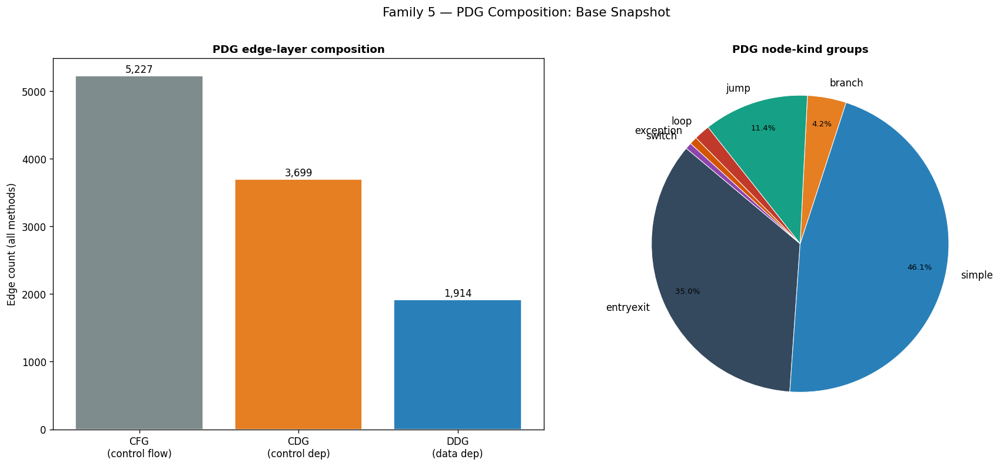

Total nodes: 5,691  edges: 10,840


In [74]:
# ── Viz 1: edge-layer composition + node-kind groups ───────────────────────
fig, (ax_bar, ax_pie) = plt.subplots(1, 2, figsize=(15, 6.5))

lay = ['cfg', 'cdg', 'ddg']
lab = ['CFG\n(control flow)', 'CDG\n(control dep)', 'DDG\n(data dep)']
vals = [layer_totals[l] for l in lay]
cols = ['#7F8C8D', '#E67E22', '#2980B9']
ax_bar.bar(lab, vals, color=cols, edgecolor='white')
for i, v in enumerate(vals):
    ax_bar.text(i, v + max(vals) * 0.01, f'{v:,}', ha='center', fontsize=10)
ax_bar.set_ylabel('Edge count (all methods)')
ax_bar.set_title('PDG edge-layer composition', fontsize=11, fontweight='bold')

grp_tot = Counter()
for kind, cnt in kind_totals.items():
    grp_tot[cpg_group(kind)] += cnt
g_lab = list(grp_tot.keys()); g_sz = [grp_tot[g] for g in g_lab]
g_col = [CPG_COLORS.get(g, CPG_COLORS['other']) for g in g_lab]
_, _, at = ax_pie.pie(g_sz, labels=g_lab, colors=g_col,
                      autopct=lambda p: f'{p:.1f}%' if p > 2 else '',
                      startangle=140, pctdistance=0.82,
                      wedgeprops={'linewidth': 0.6, 'edgecolor': 'white'})
for t in at: t.set_fontsize(8)
ax_pie.set_title('PDG node-kind groups', fontsize=11, fontweight='bold')

plt.suptitle('Family 5 — PDG Composition: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cpg_composition.png'),
            bbox_inches='tight', dpi=140)
plt.show()
print(f"Total nodes: {sum(kind_totals.values()):,}  edges: {sum(layer_totals.values()):,}")

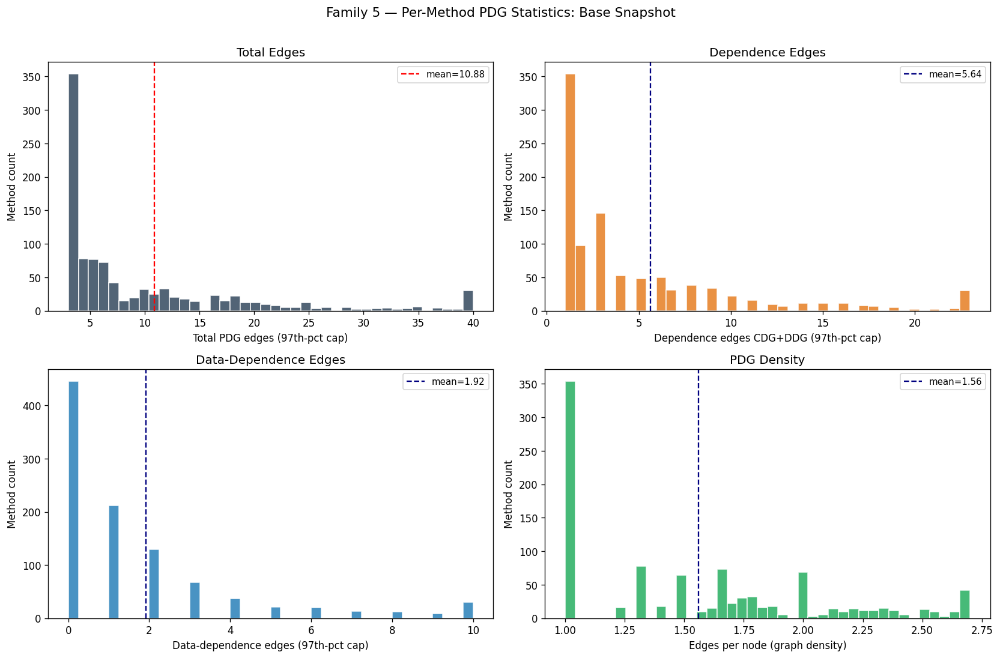

Top-8 methods by total PDG edges:
  Lexer.nextToken              nodes=276 cfg=360 cdg=274 ddg=119 cyclo=86
  MetaClass.chooseMethod           nodes= 54 cfg= 72 cdg= 52 ddg= 49 cyclo=20
  BinaryExpressionTest.testBinaryExpressions  nodes= 28 cfg= 27 cdg= 26 ddg= 39 cyclo=1
  Compiler.main                   nodes= 36 cfg= 43 cdg= 34 ddg=  8 cyclo=9
  ASTBuilder.modifiers              nodes= 19 cfg= 25 cdg= 17 ddg= 40 cyclo=8
  Parser.classDeclaration       nodes= 31 cfg= 37 cdg= 29 ddg=  9 cyclo=8
  ClassGenerator.visitVariableExpression nodes= 25 cfg= 33 cdg= 23 ddg= 17 cyclo=10
  Parser.methodDeclaration      nodes= 27 cfg= 32 cdg= 25 ddg= 14 cyclo=7


In [75]:
# ── Viz 2: per-method PDG statistic distributions ──────────────────────────
tot_v = [r['n_total_edges'] for r in cpg_rows]
pdg_v = [r['pdg_edges']     for r in cpg_rows]
ddg_v = [r['n_ddg_edges']   for r in cpg_rows]
epn_v = [r['edges_per_node'] for r in cpg_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
def _hist(ax, vals, color, xlabel, title, vc='red'):
    cap = sorted(vals)[int(len(vals) * 0.97)] if len(vals) > 5 else max(vals + [1])
    cap = max(cap, 1); clipped = [min(v, cap) for v in vals]
    mean = sum(vals) / len(vals)
    ax.hist(clipped, bins=40, color=color, edgecolor='white', alpha=0.85)
    ax.axvline(mean, color=vc, ls='--', lw=1.4, label=f'mean={mean:.2f}')
    ax.set_xlabel(xlabel); ax.set_ylabel('Method count'); ax.set_title(title)
    ax.legend(fontsize=9)

_hist(axes[0,0], tot_v, '#34495E', 'Total PDG edges (97th-pct cap)', 'Total Edges')
_hist(axes[0,1], pdg_v, '#E67E22', 'Dependence edges CDG+DDG (97th-pct cap)',
      'Dependence Edges', 'navy')
_hist(axes[1,0], ddg_v, '#2980B9', 'Data-dependence edges (97th-pct cap)',
      'Data-Dependence Edges', 'navy')
_hist(axes[1,1], epn_v, '#27AE60', 'Edges per node (graph density)',
      'PDG Density', 'navy')

plt.suptitle('Family 5 — Per-Method PDG Statistics: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cpg_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

print("Top-8 methods by total PDG edges:")
for r in sorted(cpg_rows, key=lambda r: -r['n_total_edges'])[:8]:
    print(f"  {r['class']}.{r['method']:22} nodes={r['n_cpg_nodes']:3} "
          f"cfg={r['n_cfg_edges']:3} cdg={r['n_cdg_edges']:3} ddg={r['n_ddg_edges']:3} "
          f"cyclo={r['cyclomatic']}")

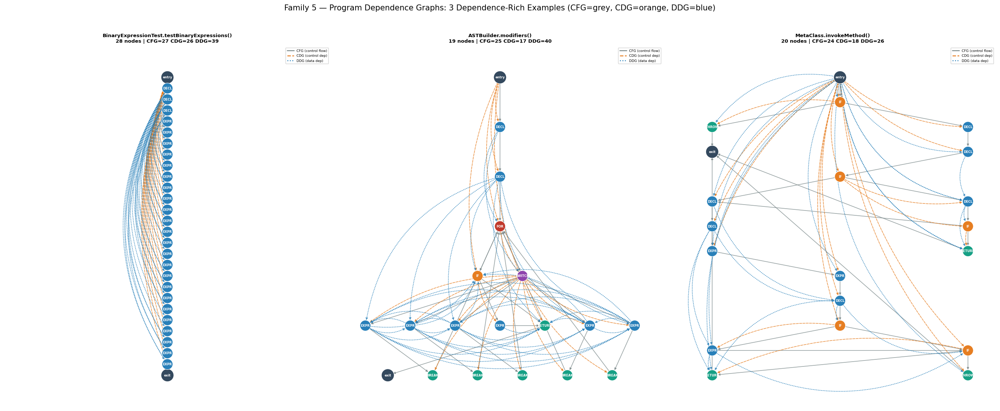

In [76]:
# ── Viz 3: 3-layer PDGs for 3 dependence-rich methods ──────────────────────
cand = sorted([r for r in cpg_rows
               if r['method_id'] in cpg_graphs and 7 <= r['n_cpg_nodes'] <= 40],
              key=lambda r: -(r['n_cdg_edges'] + r['n_ddg_edges']))
sel = cand[:3] if len(cand) >= 3 else [r for r in cpg_rows
                                       if r['method_id'] in cpg_graphs][:3]

fig, axes = plt.subplots(1, len(sel), figsize=(7.5 * len(sel), 9))
if len(sel) == 1: axes = [axes]
for ax, stat in zip(axes, sel):
    G_, entry = cpg_graphs[stat['method_id']]
    title = (f"{stat['class']}.{stat['method']}()\n"
             f"{stat['n_cpg_nodes']} nodes | CFG={stat['n_cfg_edges']} "
             f"CDG={stat['n_cdg_edges']} DDG={stat['n_ddg_edges']}")
    draw_pdg(ax, G_, entry, title=title)

plt.suptitle('Family 5 — Program Dependence Graphs: 3 Dependence-Rich Examples '
             '(CFG=grey, CDG=orange, DDG=blue)', fontsize=12.5, y=1.02)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cpg_3methods.png'),
            bbox_inches='tight', dpi=140)
plt.show()

Class: ParserTest  (6 PDGs shown)


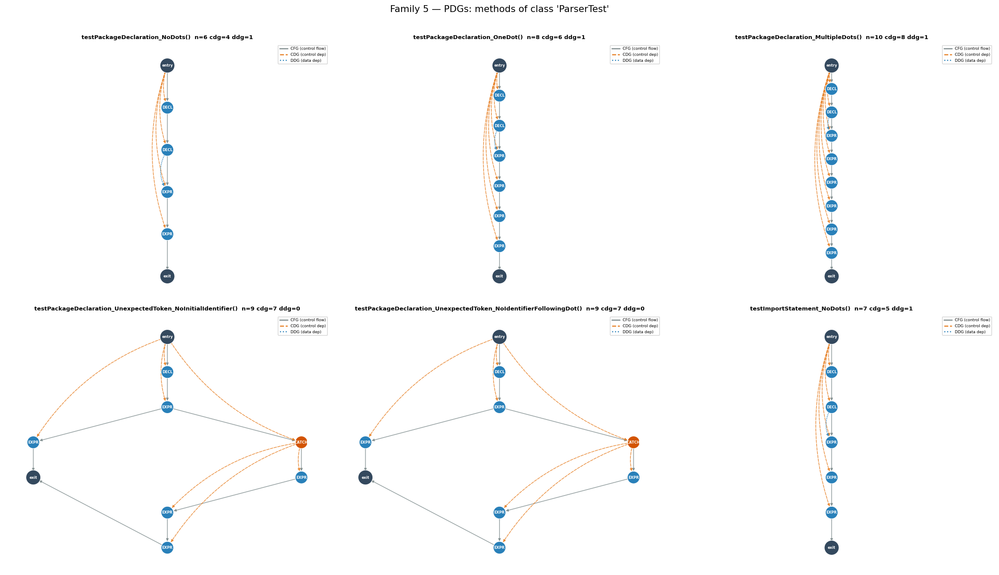

In [77]:
# ── Viz 4: PDGs for several methods of one class ───────────────────────────
_cls_of = lambda mid: mid.split('::')[1] if '::' in mid else '?'
from collections import Counter as _C
_avail = _C(_cls_of(mid) for mid in cpg_graphs)
target_class = _avail.most_common(1)[0][0]
sel = [r for r in cpg_rows
       if r['method_id'] in cpg_graphs and _cls_of(r['method_id']) == target_class][:6]

print(f"Class: {target_class}  ({len(sel)} PDGs shown)")
ncol = 3; nrow = (len(sel) + ncol - 1) // ncol
fig, axes = plt.subplots(nrow, ncol, figsize=(6.5 * ncol, 5.5 * nrow))
axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
for ax, stat in zip(axes, sel):
    G_, entry = cpg_graphs[stat['method_id']]
    draw_pdg(ax, G_, entry,
             title=f"{stat['method']}()  n={stat['n_cpg_nodes']} "
                   f"cdg={stat['n_cdg_edges']} ddg={stat['n_ddg_edges']}")
for ax in axes[len(sel):]: ax.axis('off')

plt.suptitle(f"Family 5 — PDGs: methods of class '{target_class}'", fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'cpg_class_{target_class}.png'),
            bbox_inches='tight', dpi=130)
plt.show()

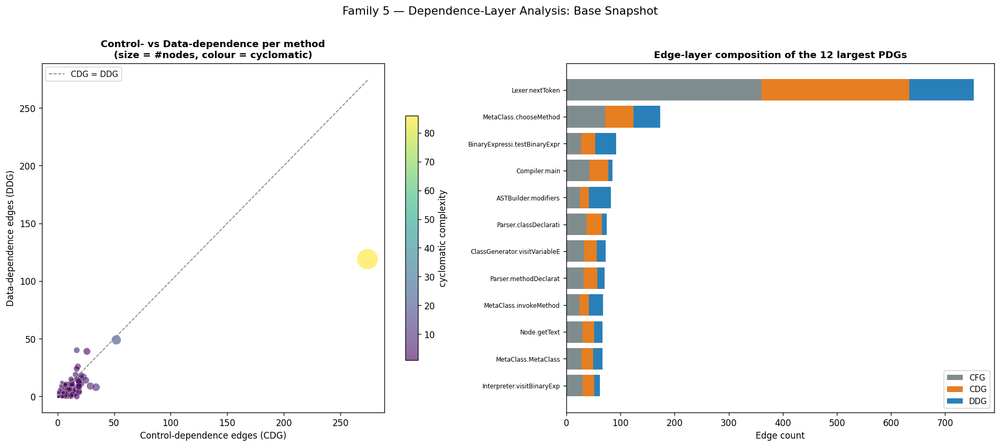

Methods with dependence edges: 996


In [78]:
# ── Viz 5: layer-mix scatter — how control- vs data-dependence-heavy ───────
import numpy as np

rich = [r for r in cpg_rows if r['pdg_edges'] > 0]
cdg = np.array([r['n_cdg_edges'] for r in rich])
ddg = np.array([r['n_ddg_edges'] for r in rich])
size = np.array([r['n_cpg_nodes'] for r in rich])
cyc  = np.array([r['cyclomatic']  for r in rich])

fig, (ax_sc, ax_st) = plt.subplots(1, 2, figsize=(16, 7))
sc = ax_sc.scatter(cdg, ddg, s=10 + size * 2, c=cyc, cmap='viridis',
                   alpha=0.6, edgecolors='white', linewidths=0.4)
lim = max(cdg.max(), ddg.max()) + 1
ax_sc.plot([0, lim], [0, lim], '--', color='grey', lw=1, label='CDG = DDG')
ax_sc.set_xlabel('Control-dependence edges (CDG)')
ax_sc.set_ylabel('Data-dependence edges (DDG)')
ax_sc.set_title('Control- vs Data-dependence per method\n(size = #nodes, colour = cyclomatic)',
                fontsize=11, fontweight='bold')
ax_sc.legend(fontsize=9)
plt.colorbar(sc, ax=ax_sc, shrink=0.7, label='cyclomatic complexity')

# stacked layer composition for the 12 largest PDGs
top = sorted(cpg_rows, key=lambda r: -r['n_total_edges'])[:12][::-1]
names = [f"{r['class'][:14]}.{r['method'][:14]}" for r in top]
cfg_e = [r['n_cfg_edges'] for r in top]
cdg_e = [r['n_cdg_edges'] for r in top]
ddg_e = [r['n_ddg_edges'] for r in top]
y = range(len(top))
ax_st.barh(y, cfg_e, color='#7F8C8D', label='CFG')
ax_st.barh(y, cdg_e, left=cfg_e, color='#E67E22', label='CDG')
ax_st.barh(y, ddg_e, left=[c + d for c, d in zip(cfg_e, cdg_e)], color='#2980B9', label='DDG')
ax_st.set_yticks(list(y)); ax_st.set_yticklabels(names, fontsize=7)
ax_st.set_xlabel('Edge count'); ax_st.legend(fontsize=9)
ax_st.set_title('Edge-layer composition of the 12 largest PDGs',
                fontsize=11, fontweight='bold')

plt.suptitle('Family 5 — Dependence-Layer Analysis: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'cpg_layer_analysis.png'),
            bbox_inches='tight', dpi=130)
plt.show()
print(f"Methods with dependence edges: {len(rich)}")

In [79]:
# ── Family 5 Summary + restore repo HEAD ───────────────────────────────────
n = len(cpg_rows)
tot_n  = sum(r['n_cpg_nodes'] for r in cpg_rows)
tcfg = sum(r['n_cfg_edges'] for r in cpg_rows)
tcdg = sum(r['n_cdg_edges'] for r in cpg_rows)
tddg = sum(r['n_ddg_edges'] for r in cpg_rows)
with_dep = sum(1 for r in cpg_rows if r['pdg_edges'] > 0)

print("=" * 60)
print("Family 5: Program Dependence Graphs (PDG/CPG) — Summary")
print("=" * 60)
print(f"  Methods analysed              : {n:>7,}")
print(f"  Total PDG nodes (statements)  : {tot_n:>7,}")
print(f"  Control-flow edges  (CFG)     : {tcfg:>7,}")
print(f"  Control-dependence  (CDG)     : {tcdg:>7,}")
print(f"  Data-dependence     (DDG)     : {tddg:>7,}")
print(f"  Total PDG edges               : {tcfg+tcdg+tddg:>7,}")
print(f"  Dependence edges (CDG+DDG)    : {tcdg+tddg:>7,}")
print(f"  Avg edges / node              : {(tcfg+tcdg+tddg)/max(1,tot_n):>7.2f}")
print(f"  Avg cyclomatic complexity     : {sum(r['cyclomatic'] for r in cpg_rows)/max(1,n):>7.2f}")
print(f"  Methods with dependence edges : {with_dep:>7,}  ({with_dep/max(1,n)*100:.1f}%)")
print(f"")
print(f"  Outputs:")
print(f"    outputs/cpg_subgraph_stats.csv")
print(f"    outputs/cpg_example_graphs/  ({len(cpg_graphs)} .pkl files)")
print(f"    outputs/plots/cpg_composition.png")
print(f"    outputs/plots/cpg_method_stats.png")
print(f"    outputs/plots/cpg_3methods.png")
print(f"    outputs/plots/cpg_class_*.png")
print(f"    outputs/plots/cpg_layer_analysis.png")

git(f'checkout {current_head}')
print(f"\nRestored HEAD to: {current_head}")

Family 5: Program Dependence Graphs (PDG/CPG) — Summary
  Methods analysed              :     996
  Total PDG nodes (statements)  :   5,691
  Control-flow edges  (CFG)     :   5,227
  Control-dependence  (CDG)     :   3,699
  Data-dependence     (DDG)     :   1,914
  Total PDG edges               :  10,840
  Dependence edges (CDG+DDG)    :   5,613
  Avg edges / node              :    1.90
  Avg cyclomatic complexity     :    1.53
  Methods with dependence edges :     996  (100.0%)

  Outputs:
    outputs/cpg_subgraph_stats.csv
    outputs/cpg_example_graphs/  (12 .pkl files)
    outputs/plots/cpg_composition.png
    outputs/plots/cpg_method_stats.png
    outputs/plots/cpg_3methods.png
    outputs/plots/cpg_class_*.png
    outputs/plots/cpg_layer_analysis.png

Restored HEAD to: 408b29851d7bbe4d343340832297e4be7e0c5578


---
## Family 6 — Formal and Semantic Analysis (source-level subset)

Family 6 spans abstract interpretation, alias/points-to, taint, type systems,
symbolic execution, and formal contracts. The production engines for the heavy
variants (**Infer**, **Soot/WALA** alias, **SMT** symbolic execution) are *not*
run here. Instead we compute the cheap, **source-level subset the design doc
recommends for KG-Commit** — entirely from the javalang AST:

* **Nullness** (abstract-interpretation proxy): null literals/assigns/returns,
  null-checks, dereferences, and **unguarded dereferences** of nullable/parameter
  variables → NPE-risk. *Visualised as a per-method nullness graph.*
* **Formal contracts**: `requireNonNull` / `Preconditions.checkX` / `assert` /
  `if-null-throw` precondition guards.
* **Type system**: `@Nullable`/`@NonNull` annotation usage.
* **Taint** (heuristic): source-like / sink-like call-site counts.
* **Effect types**: field-write / IO / purity flags.
* **Symbolic-execution proxy**: path-predicate count + estimated path count.

> These are deliberately *approximations* of the full analyses. NPE-risk here is
> a conservative source-level heuristic (a dereference of a parameter or
> null-assigned variable with no null-check / `requireNonNull` anywhere in the
> method), **not** a sound dataflow result.

Offline extractor (killable subprocess), run once:
```
python build_sem_features.py
```

In [80]:
# ── Family 6 Setup: nullness-graph colours + bipartite-ish layout + drawer ─
SEM_COLORS = {
    'var': '#2980B9', 'var_risk': '#C0392B', 'var_safe': '#27AE60',
    'deref': '#7F8C8D', 'check': '#E67E22', 'guard': '#16A085', 'other': '#95A5A6',
}
REL_STYLE = {
    'DEREF_AT':    ('#7F8C8D', 'solid'),
    'MAY_BE_NULL': ('#C0392B', 'dashed'),
    'CHECKS':      ('#E67E22', 'solid'),
    'GUARDS':      ('#16A085', 'solid'),
}

def sem_pos(G, x_gap=2.6, y_gap=1.0):
    """Columns: GUARD/CHECK (left) | VAR (centre) | DEREF (right)."""
    cols = {'guard': -1.0, 'check': -0.6, 'var': 0.0, 'deref': 1.0}
    buckets = {}
    for n, d in G.nodes(data=True):
        buckets.setdefault(d['group'], []).append(n)
    pos = {}
    for grp, nodes in buckets.items():
        nodes = sorted(nodes); k = len(nodes)
        cx = cols.get(grp, 0.5)
        for i, n in enumerate(nodes):
            pos[n] = (cx * x_gap, -(i - (k - 1) / 2) * y_gap)
    return pos

def draw_nullness(ax, G, title=None, max_nodes=60):
    if G is None or G.number_of_nodes() == 0:
        ax.text(0.5, 0.5, '(no nullness structure)', ha='center', va='center',
                fontsize=9); ax.set_title(title or '', fontsize=8); ax.axis('off'); return
    if G.number_of_nodes() > max_nodes:
        keep = [n for n, _ in sorted(G.nodes(data=True),
                key=lambda nd: 0 if nd[1]['group'] == 'var' else 1)[:max_nodes]]
        G = G.subgraph(keep).copy()
    pos = sem_pos(G)
    nx.draw_networkx_nodes(G, pos, ax=ax,
        node_color=[G.nodes[n]['color'] for n in G.nodes()],
        node_shape='o',
        node_size=[420 if G.nodes[n]['group'] == 'var' else 240 for n in G.nodes()],
        edgecolors='white', linewidths=0.8)
    nx.draw_networkx_labels(G, pos,
        {n: G.nodes[n]['label'][:10] for n in G.nodes()},
        ax=ax, font_size=5.5, font_color='#1A1A1A')
    for rel, (col, style) in REL_STYLE.items():
        elist = [(u, v) for u, v, d in G.edges(data=True) if d.get('rel') == rel]
        if elist:
            nx.draw_networkx_edges(G, pos, edgelist=elist, ax=ax, edge_color=col,
                style=style, width=1.3 if rel == 'MAY_BE_NULL' else 0.9,
                arrows=True, arrowsize=8, connectionstyle='arc3,rad=0.08', node_size=320)
    handles = [
        mpatches.Patch(color=SEM_COLORS['var_risk'], label='VAR (NPE-risk)'),
        mpatches.Patch(color=SEM_COLORS['var_safe'], label='VAR (guarded)'),
        mpatches.Patch(color=SEM_COLORS['var'], label='VAR'),
        mpatches.Patch(color=SEM_COLORS['deref'], label='deref'),
        mpatches.Patch(color=SEM_COLORS['check'], label='null-check'),
        mpatches.Patch(color=SEM_COLORS['guard'], label='guard'),
        plt.Line2D([0],[0], color='#C0392B', ls='dashed', label='MAY_BE_NULL'),
    ]
    ax.legend(handles=handles, loc='upper right', fontsize=5, framealpha=0.75, ncol=2)
    ax.set_title(title or '', fontsize=8, fontweight='bold'); ax.axis('off')

print("Family 6 setup complete.")

Family 6 setup complete.


In [81]:
# ── Load semantic features ─────────────────────────────────────────────────
import json
from collections import Counter

_rows_path = PROJECT_ROOT / 'outputs' / 'sem_rows.json'
_aggr_path = PROJECT_ROOT / 'outputs' / 'sem_aggregates.json'
if not _rows_path.exists():
    raise FileNotFoundError(
        "outputs/sem_rows.json not found.\n"
        "Run first in a terminal:  python build_sem_features.py")

with open(_rows_path, encoding='utf-8') as f:
    sem_rows = json.load(f)
with open(_aggr_path, encoding='utf-8') as f:
    _saggr = json.load(f)
sig_totals = Counter(_saggr['sig_totals'])

npe   = sum(r['n_unguarded_derefs'] for r in sem_rows)
pure  = sum(1 for r in sem_rows if r['is_pure'])
print(f"Loaded {len(sem_rows)} method semantic rows  ({_saggr['ok_files']} files OK, "
      f"{len(_saggr['skipped_files'])} skipped)")
print(f"Dereferences       : {sum(r['n_dereferences'] for r in sem_rows):,}")
print(f"Null-checks        : {sum(r['n_null_checks'] for r in sem_rows):,}")
print(f"Precondition guards: {sum(r['n_guards'] for r in sem_rows):,}")
print(f"Unguarded derefs (NPE-risk): {npe:,}  in "
      f"{sum(1 for r in sem_rows if r['n_unguarded_derefs']>0)} methods")
print(f"Null returns       : {sum(r['n_null_returns'] for r in sem_rows):,}")
print(f"Pure methods       : {pure:,} ({pure/len(sem_rows)*100:.1f}%)")
print(f"@Nullable/@NonNull : {sum(r['n_nullable_annot'] for r in sem_rows)}/"
      f"{sum(r['n_nonnull_annot'] for r in sem_rows)}")
print(f"Taint src/sink     : {sum(r['n_taint_sources'] for r in sem_rows):,}/"
      f"{sum(r['n_taint_sinks'] for r in sem_rows):,}")

Loaded 996 method semantic rows  (120 files OK, 0 skipped)
Dereferences       : 1,085
Null-checks        : 73
Precondition guards: 27
Unguarded derefs (NPE-risk): 299  in 154 methods
Null returns       : 17
Pure methods       : 945 (94.9%)
@Nullable/@NonNull : 0/0
Taint src/sink     : 914/127


In [82]:
# ── Load example nullness graphs ───────────────────────────────────────────
import pickle
EX_SEM_DIR = PROJECT_ROOT / 'outputs' / 'sem_example_graphs'
def _safe(mid): return "".join(c if c.isalnum() else "_" for c in mid)
_stem_to_mid = {_safe(r['method_id']): r['method_id'] for r in sem_rows}

sem_graphs = {}   # method_id -> DiGraph
for pf in sorted(EX_SEM_DIR.glob('*.pkl')):
    try:
        G_ = pickle.loads(pf.read_bytes())
    except Exception as e:
        print(f"  load error {pf.name}: {e}"); continue
    sem_graphs[_stem_to_mid.get(pf.stem, pf.stem)] = G_

print(f"Loaded {len(sem_graphs)} example nullness graphs")
if sem_graphs:
    print(f"Total nodes across examples: {sum(g.number_of_nodes() for g in sem_graphs.values())}")

Loaded 12 example nullness graphs
Total nodes across examples: 190


In [83]:
print(f"sem_rows   : {len(sem_rows)} rows")
print(f"sem_graphs : {len(sem_graphs)} example nullness graphs in RAM")
print(f"Columns: {list(sem_rows[0].keys()) if sem_rows else 'empty'}")

sem_rows   : 996 rows
sem_graphs : 12 example nullness graphs in RAM
Columns: ['method_id', 'file', 'class', 'method', 'kind', 'n_params', 'n_locals', 'n_null_literals', 'n_null_returns', 'n_null_assigns', 'n_null_checks', 'n_checked_vars', 'n_guards', 'n_guarded_vars', 'n_preconditions', 'n_asserts', 'n_dereferences', 'n_deref_vars', 'n_unguarded_derefs', 'n_risk_vars', 'n_nullable_annot', 'n_nonnull_annot', 'n_taint_sources', 'n_taint_sinks', 'writes_field', 'does_io', 'is_pure', 'n_path_predicates', 'est_paths', 'has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']


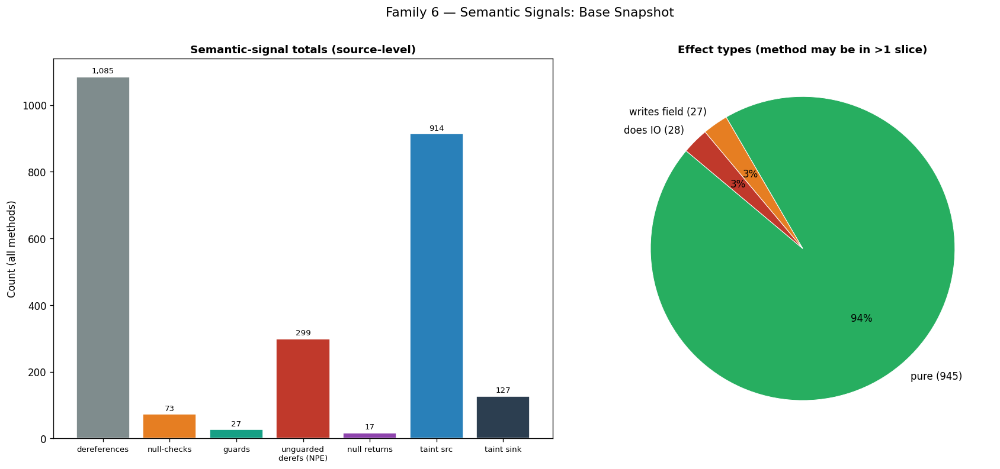

Pure: 945  writes-field: 27  does-IO: 28


In [84]:
# ── Viz 1: semantic-signal totals + method purity / effect split ───────────
fig, (ax_bar, ax_pie) = plt.subplots(1, 2, figsize=(15, 6.5))

signals = [
    ('dereferences', sum(r['n_dereferences'] for r in sem_rows), '#7F8C8D'),
    ('null-checks',  sum(r['n_null_checks'] for r in sem_rows),  '#E67E22'),
    ('guards',       sum(r['n_guards'] for r in sem_rows),       '#16A085'),
    ('unguarded\nderefs (NPE)', sum(r['n_unguarded_derefs'] for r in sem_rows), '#C0392B'),
    ('null returns', sum(r['n_null_returns'] for r in sem_rows), '#8E44AD'),
    ('taint src',    sum(r['n_taint_sources'] for r in sem_rows),'#2980B9'),
    ('taint sink',   sum(r['n_taint_sinks'] for r in sem_rows),  '#2C3E50'),
]
names = [s[0] for s in signals]; vals = [s[1] for s in signals]; cols = [s[2] for s in signals]
ax_bar.bar(names, vals, color=cols, edgecolor='white')
for i, v in enumerate(vals):
    ax_bar.text(i, v + max(vals) * 0.01, f'{v:,}', ha='center', fontsize=8)
ax_bar.set_ylabel('Count (all methods)')
ax_bar.set_title('Semantic-signal totals (source-level)', fontsize=11, fontweight='bold')
ax_bar.tick_params(axis='x', labelsize=8)

pure = sum(1 for r in sem_rows if r['is_pure'])
wf   = sum(1 for r in sem_rows if r['writes_field'])
io   = sum(1 for r in sem_rows if r['does_io'])
other = len(sem_rows) - pure
ax_pie.pie([pure, wf, io],
           labels=[f'pure ({pure})', f'writes field ({wf})', f'does IO ({io})'],
           colors=['#27AE60', '#E67E22', '#C0392B'], autopct='%1.0f%%',
           startangle=140, wedgeprops={'linewidth': 0.6, 'edgecolor': 'white'})
ax_pie.set_title('Effect types (method may be in >1 slice)', fontsize=11, fontweight='bold')

plt.suptitle('Family 6 — Semantic Signals: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'sem_signals.png'),
            bbox_inches='tight', dpi=140)
plt.show()
print(f"Pure: {pure}  writes-field: {wf}  does-IO: {io}")

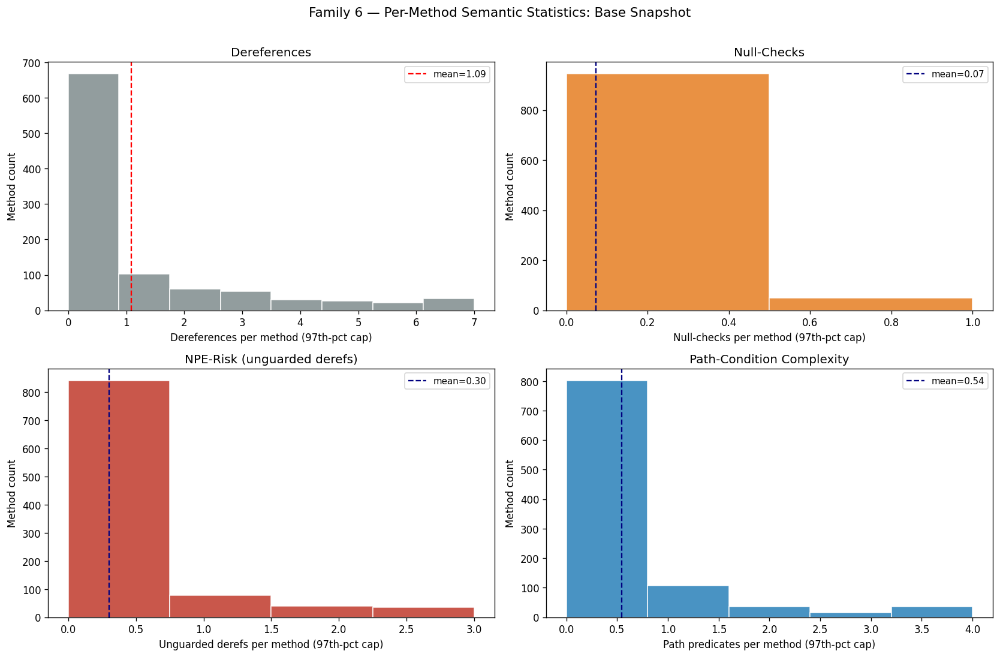

Top-8 methods by NPE-risk (unguarded dereferences):
  ClassGenerator.visitProperty          unguarded= 9 derefs= 9 checks=2 guards=0
  ClassGenerator.visitClass             unguarded= 8 derefs=16 checks=0 guards=0
  MetaClass.chooseMethod           unguarded= 7 derefs=18 checks=7 guards=3
  ASTBuilder.classDeclaration       unguarded= 7 derefs=11 checks=0 guards=0
  ClassGenerator.visitMethod            unguarded= 6 derefs= 6 checks=0 guards=0
  Interpreter.visitMethodCallExpression unguarded= 6 derefs= 6 checks=1 guards=1
  Interpreter.visitPropertyExpression unguarded= 5 derefs= 5 checks=1 guards=1
  ASTBuilder.methodDeclaration      unguarded= 5 derefs= 5 checks=0 guards=0


In [85]:
# ── Viz 2: per-method semantic statistic distributions ─────────────────────
dr   = [r['n_dereferences']     for r in sem_rows]
ck   = [r['n_null_checks']      for r in sem_rows]
ug   = [r['n_unguarded_derefs'] for r in sem_rows]
pp   = [r['n_path_predicates']  for r in sem_rows]

fig, axes = plt.subplots(2, 2, figsize=(14, 9))
def _hist(ax, vals, color, xlabel, title, vc='red'):
    cap = sorted(vals)[int(len(vals) * 0.97)] if len(vals) > 5 else max(vals + [1])
    cap = max(cap, 1); clipped = [min(v, cap) for v in vals]
    mean = sum(vals) / len(vals)
    ax.hist(clipped, bins=min(40, int(cap) + 1), color=color, edgecolor='white', alpha=0.85)
    ax.axvline(mean, color=vc, ls='--', lw=1.4, label=f'mean={mean:.2f}')
    ax.set_xlabel(xlabel); ax.set_ylabel('Method count'); ax.set_title(title)
    ax.legend(fontsize=9)

_hist(axes[0,0], dr, '#7F8C8D', 'Dereferences per method (97th-pct cap)', 'Dereferences')
_hist(axes[0,1], ck, '#E67E22', 'Null-checks per method (97th-pct cap)', 'Null-Checks', 'navy')
_hist(axes[1,0], ug, '#C0392B', 'Unguarded derefs per method (97th-pct cap)',
      'NPE-Risk (unguarded derefs)', 'navy')
_hist(axes[1,1], pp, '#2980B9', 'Path predicates per method (97th-pct cap)',
      'Path-Condition Complexity', 'navy')

plt.suptitle('Family 6 — Per-Method Semantic Statistics: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'sem_method_stats.png'),
            bbox_inches='tight', dpi=130)
plt.show()

print("Top-8 methods by NPE-risk (unguarded dereferences):")
for r in sorted(sem_rows, key=lambda r: -r['n_unguarded_derefs'])[:8]:
    print(f"  {r['class']}.{r['method']:22} unguarded={r['n_unguarded_derefs']:2} "
          f"derefs={r['n_dereferences']:2} checks={r['n_null_checks']} guards={r['n_guards']}")

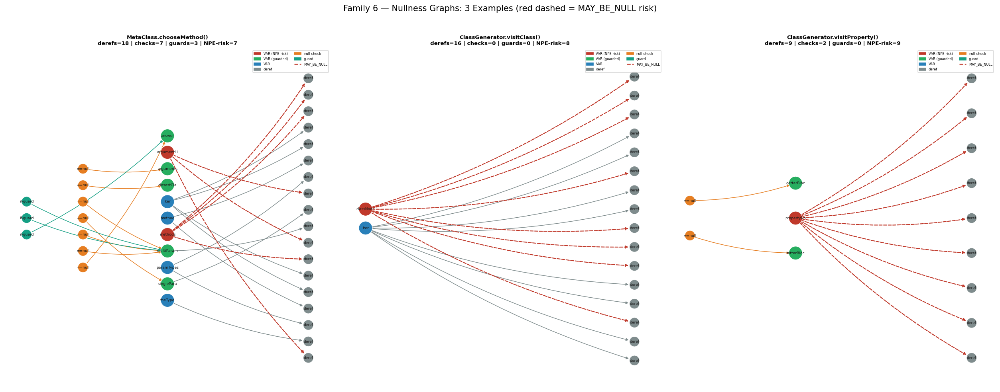

In [86]:
# ── Viz 3: nullness graphs for 3 nullness-rich methods ─────────────────────
def _score(r): return r['n_dereferences'] + 2*r['n_unguarded_derefs'] + r['n_null_checks'] + r['n_guards']
cand = sorted([r for r in sem_rows if r['method_id'] in sem_graphs],
              key=lambda r: -_score(r))
sel = cand[:3] if len(cand) >= 3 else cand

fig, axes = plt.subplots(1, len(sel), figsize=(7 * len(sel), 8))
if len(sel) == 1: axes = [axes]
for ax, stat in zip(axes, sel):
    G_ = sem_graphs[stat['method_id']]
    title = (f"{stat['class']}.{stat['method']}()\n"
             f"derefs={stat['n_dereferences']} | checks={stat['n_null_checks']} | "
             f"guards={stat['n_guards']} | NPE-risk={stat['n_unguarded_derefs']}")
    draw_nullness(ax, G_, title=title)

plt.suptitle('Family 6 — Nullness Graphs: 3 Examples '
             '(red dashed = MAY_BE_NULL risk)', fontsize=12.5, y=1.02)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'sem_3methods.png'),
            bbox_inches='tight', dpi=140)
plt.show()

Class: ParserTest  (6 nullness graphs shown)


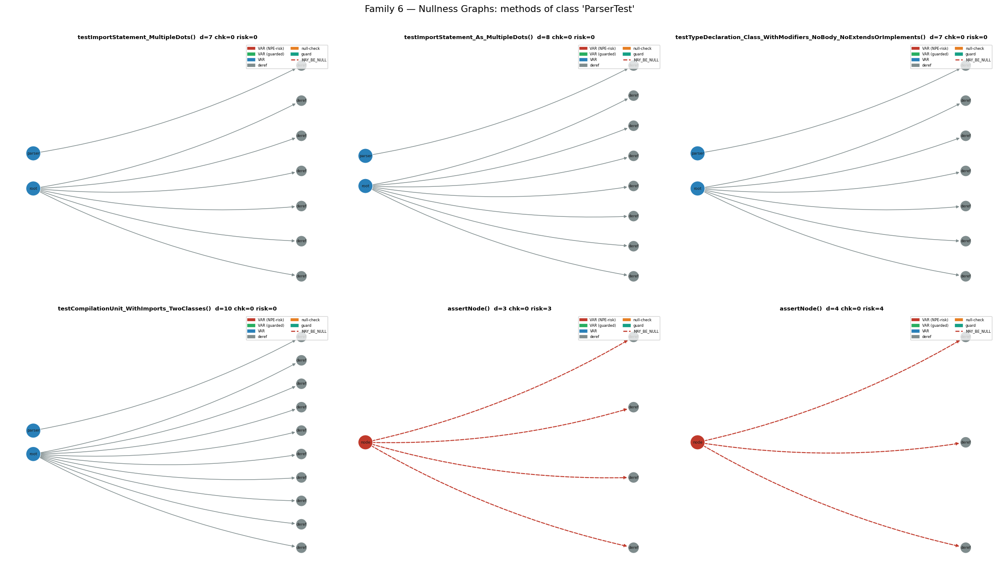

In [87]:
# ── Viz 4: nullness graphs for several methods of one class ────────────────
_cls_of = lambda mid: mid.split('::')[1] if '::' in mid else '?'
from collections import Counter as _C
_avail = _C(_cls_of(mid) for mid in sem_graphs)
target_class = _avail.most_common(1)[0][0]
sel = [r for r in sem_rows
       if r['method_id'] in sem_graphs and _cls_of(r['method_id']) == target_class][:6]

print(f"Class: {target_class}  ({len(sel)} nullness graphs shown)")
ncol = 3; nrow = (len(sel) + ncol - 1) // ncol
fig, axes = plt.subplots(nrow, ncol, figsize=(6.5 * ncol, 5.5 * nrow))
axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
for ax, stat in zip(axes, sel):
    draw_nullness(ax, sem_graphs[stat['method_id']],
                  title=f"{stat['method']}()  d={stat['n_dereferences']} "
                        f"chk={stat['n_null_checks']} risk={stat['n_unguarded_derefs']}")
for ax in axes[len(sel):]: ax.axis('off')

plt.suptitle(f"Family 6 — Nullness Graphs: methods of class '{target_class}'",
             fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / f'sem_class_{target_class}.png'),
            bbox_inches='tight', dpi=130)
plt.show()

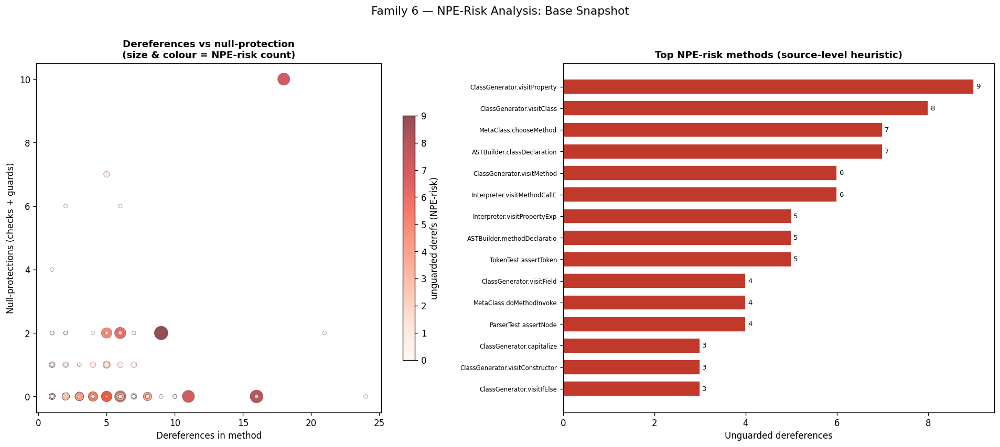

Methods with dereferences: 328


In [88]:
# ── Viz 5: NPE-risk analysis — guards vs dereferences, risk hotspots ───────
import numpy as np

rich = [r for r in sem_rows if r['n_dereferences'] > 0]
dx = np.array([r['n_dereferences'] for r in rich])
gy = np.array([r['n_null_checks'] + r['n_guards'] for r in rich])
risk = np.array([r['n_unguarded_derefs'] for r in rich])

fig, (ax_sc, ax_bar) = plt.subplots(1, 2, figsize=(16, 7))
sc = ax_sc.scatter(dx, gy, s=20 + risk * 25, c=risk, cmap='Reds',
                   alpha=0.7, edgecolors='#555', linewidths=0.4)
ax_sc.set_xlabel('Dereferences in method')
ax_sc.set_ylabel('Null-protections (checks + guards)')
ax_sc.set_title('Dereferences vs null-protection\n(size & colour = NPE-risk count)',
                fontsize=11, fontweight='bold')
plt.colorbar(sc, ax=ax_sc, shrink=0.7, label='unguarded derefs (NPE-risk)')

top = [r for r in sorted(sem_rows, key=lambda r: -r['n_unguarded_derefs'])
       if r['n_unguarded_derefs'] > 0][:15][::-1]
if top:
    names = [f"{r['class'][:14]}.{r['method'][:16]}" for r in top]
    vals  = [r['n_unguarded_derefs'] for r in top]
    ax_bar.barh(names, vals, color='#C0392B', edgecolor='white', height=0.7)
    for i, v in enumerate(vals):
        ax_bar.text(v + 0.05, i, str(v), va='center', fontsize=8)
    ax_bar.set_xlabel('Unguarded dereferences')
    ax_bar.set_title('Top NPE-risk methods (source-level heuristic)',
                     fontsize=11, fontweight='bold')
    ax_bar.tick_params(axis='y', labelsize=7)
else:
    ax_bar.text(0.5, 0.5, '(no unguarded dereferences)', ha='center', va='center')
    ax_bar.axis('off')

plt.suptitle('Family 6 — NPE-Risk Analysis: Base Snapshot', fontsize=13, y=1.01)
plt.tight_layout()
plt.savefig(str(PROJECT_ROOT / 'outputs' / 'plots' / 'sem_npe_risk.png'),
            bbox_inches='tight', dpi=130)
plt.show()
print(f"Methods with dereferences: {len(rich)}")

In [89]:
# ── Family 6 Summary + restore repo HEAD ───────────────────────────────────
n = len(sem_rows)
S = lambda k: sum(r[k] for r in sem_rows)
risk_m = sum(1 for r in sem_rows if r['n_unguarded_derefs'] > 0)
pure = sum(1 for r in sem_rows if r['is_pure'])

print("=" * 60)
print("Family 6: Formal & Semantic Analysis (source-level) — Summary")
print("=" * 60)
print(f"  Methods analysed              : {n:>7,}")
print(f"  Dereference sites             : {S('n_dereferences'):>7,}")
print(f"  Null-checks                   : {S('n_null_checks'):>7,}")
print(f"  Precondition guards           : {S('n_guards'):>7,}")
print(f"    (requireNonNull/checkX/if-throw)")
print(f"  Assert statements             : {S('n_asserts'):>7,}")
print(f"  Unguarded derefs (NPE-risk)   : {S('n_unguarded_derefs'):>7,}  "
      f"in {risk_m} methods ({risk_m/max(1,n)*100:.1f}%)")
print(f"  Null returns                  : {S('n_null_returns'):>7,}")
print(f"  @Nullable / @NonNull annots   : {S('n_nullable_annot')} / {S('n_nonnull_annot')}")
print(f"  Taint sources / sinks (heur.) : {S('n_taint_sources'):,} / {S('n_taint_sinks'):,}")
print(f"  Pure methods                  : {pure:>7,}  ({pure/max(1,n)*100:.1f}%)")
print(f"  Methods writing fields        : {sum(1 for r in sem_rows if r['writes_field']):>7,}")
print(f"")
print(f"  NOTE: source-level approximations (Infer/Soot/SMT not run).")
print(f"  Outputs:")
print(f"    outputs/sem_subgraph_stats.csv")
print(f"    outputs/sem_example_graphs/  ({len(sem_graphs)} .pkl files)")
print(f"    outputs/plots/sem_signals.png")
print(f"    outputs/plots/sem_method_stats.png")
print(f"    outputs/plots/sem_3methods.png")
print(f"    outputs/plots/sem_class_*.png")
print(f"    outputs/plots/sem_npe_risk.png")

git(f'checkout {current_head}')
print(f"\nRestored HEAD to: {current_head}")

Family 6: Formal & Semantic Analysis (source-level) — Summary
  Methods analysed              :     996
  Dereference sites             :   1,085
  Null-checks                   :      73
  Precondition guards           :      27
    (requireNonNull/checkX/if-throw)
  Assert statements             :       0
  Unguarded derefs (NPE-risk)   :     299  in 154 methods (15.5%)
  Null returns                  :      17
  @Nullable / @NonNull annots   : 0 / 0
  Taint sources / sinks (heur.) : 914 / 127
  Pure methods                  :     945  (94.9%)
  Methods writing fields        :      27

  NOTE: source-level approximations (Infer/Soot/SMT not run).
  Outputs:
    outputs/sem_subgraph_stats.csv
    outputs/sem_example_graphs/  (12 .pkl files)
    outputs/plots/sem_signals.png
    outputs/plots/sem_method_stats.png
    outputs/plots/sem_3methods.png
    outputs/plots/sem_class_*.png
    outputs/plots/sem_npe_risk.png

Restored HEAD to: 408b29851d7bbe4d343340832297e4be7e0c5578


## Family 7 — Program Slicing

**Program slices** capture which statements influence (backward slice) or are influenced by (forward slice) a given criterion statement, via the Program Dependence Graph (PDG) built in Family 5.

A *backward slice* on criterion $c$ is the set of statements that may affect the value computed at $c$ — reached by following dependence in-edges (CDG \u222a DDG) backward. A *forward slice* on $c$ gives all statements $c$ can transitionally influence.

Key scalar features per method:
- `max_backward_slice` / `mean_backward_slice`
- `max_forward_slice` / `mean_forward_slice`
- `return_slice_size` — backward slice of the return/throw criterion
- `slice_coverage` — max backward slice / n_statements
- `mean_slice_coverage` — average fraction across all criteria

Run once to generate outputs:  
```
python build_slice_features.py
```

In [92]:
from pathlib import Path
import json, pickle
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from collections import Counter, defaultdict

OUT7 = Path(PROJECT_ROOT) / "outputs"
EX7  = OUT7 / "slice_example_graphs"

with open(OUT7 / "slice_rows.json", encoding="utf-8") as f:
    slice_rows = json.load(f)
with open(OUT7 / "slice_aggregates.json", encoding="utf-8") as f:
    slice_agg = json.load(f)

print(f"Methods loaded : {len(slice_rows)}")
print(f"Files OK       : {slice_agg['ok_files']}")
print(f"Files skipped  : {len(slice_agg['skipped_files'])}")

Methods loaded : 996
Files OK       : 120
Files skipped  : 0


In [93]:
# Summary statistics
mb  = [r["max_backward_slice"]  for r in slice_rows]
mf  = [r["max_forward_slice"]   for r in slice_rows]
sc  = [r["slice_coverage"]      for r in slice_rows]
rs  = [r["return_slice_size"]   for r in slice_rows]
nde = [r["n_dep_edges"]         for r in slice_rows]

def pct(vals, p): return sorted(vals)[int(len(vals)*p/100)]

print("Max backward slice  min=%d  p25=%d  med=%d  p75=%d  p90=%d  max=%d"
      % (min(mb), pct(mb,25), pct(mb,50), pct(mb,75), pct(mb,90), max(mb)))
print("Max forward  slice  min=%d  p25=%d  med=%d  p75=%d  p90=%d  max=%d"
      % (min(mf), pct(mf,25), pct(mf,50), pct(mf,75), pct(mf,90), max(mf)))
print("Slice coverage(max) min=%.2f p25=%.2f med=%.2f p75=%.2f max=%.2f"
      % (min(sc), pct(sc,25), pct(sc,50), pct(sc,75), max(sc)))
print("Return slice size   mean=%.1f  max=%d" % (sum(rs)/len(rs), max(rs)))
print("Dependence edges    mean=%.1f  max=%d" % (sum(nde)/len(nde), max(nde)))

n_trivial = sum(1 for v in mb if v <= 1)
print(f"\nMethods with max backward-slice <= 1 (trivial): {n_trivial}/{len(mb)} = {n_trivial/len(mb):.1%}")
n_hi_fwd = sum(1 for r in slice_rows
               if r["max_forward_slice"] / max(1, r["n_stmt_nodes"]) > 0.5)
print(f"Methods where one stmt forward-slices >50% of body: "
      f"{n_hi_fwd}/{len(slice_rows)} = {n_hi_fwd/len(slice_rows):.1%}")


Max backward slice  min=2  p25=2  med=2  p75=3  p90=4  max=83
Max forward  slice  min=1  p25=1  med=1  p75=2  p90=5  max=274
Slice coverage(max) min=0.12 p25=0.75 med=2.00 p75=2.00 max=2.00
Return slice size   mean=1.3  max=83
Dependence edges    mean=5.6  max=393

Methods with max backward-slice <= 1 (trivial): 0/996 = 0.0%
Methods where one stmt forward-slices >50% of body: 764/996 = 76.7%


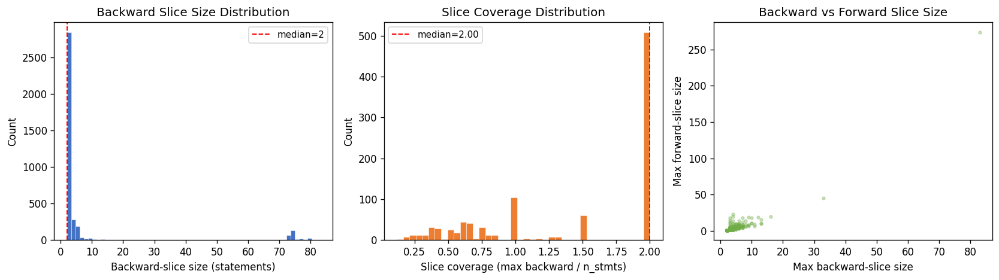

In [94]:
# Fig 1: backward-slice size distribution, slice coverage, backward vs forward
fig, axes = plt.subplots(1, 3, figsize=(14, 4))

bvals = slice_agg["bsize_sample"]
ax = axes[0]
ax.hist(bvals, bins=min(60, max(bvals)+1), color="#4472C4",
        edgecolor="white", linewidth=.3)
ax.set_xlabel("Backward-slice size (statements)")
ax.set_ylabel("Count")
ax.set_title("Backward Slice Size Distribution")
ax.axvline(np.median(bvals), color="red", linestyle="--", linewidth=1.2,
           label=f"median={np.median(bvals):.0f}")
ax.legend(fontsize=9)

ax = axes[1]
ax.hist(sc, bins=40, color="#ED7D31", edgecolor="white", linewidth=.3)
ax.set_xlabel("Slice coverage (max backward / n_stmts)")
ax.set_ylabel("Count")
ax.set_title("Slice Coverage Distribution")
ax.axvline(np.median(sc), color="red", linestyle="--", linewidth=1.2,
           label=f"median={np.median(sc):.2f}")
ax.legend(fontsize=9)

ax = axes[2]
ax.scatter(mb, mf, alpha=0.35, s=8, color="#70AD47")
ax.set_xlabel("Max backward-slice size")
ax.set_ylabel("Max forward-slice size")
ax.set_title("Backward vs Forward Slice Size")

plt.tight_layout(); plt.show()


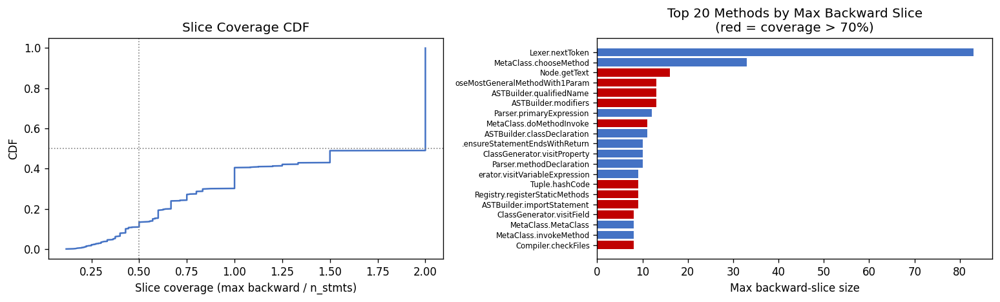

In [95]:
# Fig 2: slice coverage CDF + top-20 methods by max backward slice
fig, axes = plt.subplots(1, 2, figsize=(13, 4))

ax = axes[0]
sorted_sc = sorted(sc)
y_vals = [i/len(sorted_sc) for i in range(len(sorted_sc))]
ax.plot(sorted_sc, y_vals, color="#4472C4", linewidth=1.5)
ax.axvline(0.5, color="grey", linestyle=":", linewidth=1)
ax.axhline(0.5, color="grey", linestyle=":", linewidth=1)
ax.set_xlabel("Slice coverage (max backward / n_stmts)")
ax.set_ylabel("CDF"); ax.set_title("Slice Coverage CDF")

ax = axes[1]
top20 = sorted(slice_rows, key=lambda r: -r["max_backward_slice"])[:20]
labels = [f"{r['class']}.{r['method']}"[-30:] for r in top20]
vals   = [r["max_backward_slice"] for r in top20]
colors = ["#C00000" if r["slice_coverage"] > 0.7 else "#4472C4" for r in top20]
ax.barh(range(len(vals)), vals, color=colors)
ax.set_yticks(range(len(vals)))
ax.set_yticklabels(labels, fontsize=7)
ax.set_xlabel("Max backward-slice size")
ax.set_title("Top 20 Methods by Max Backward Slice\n(red = coverage > 70%)")
ax.invert_yaxis()
plt.tight_layout(); plt.show()


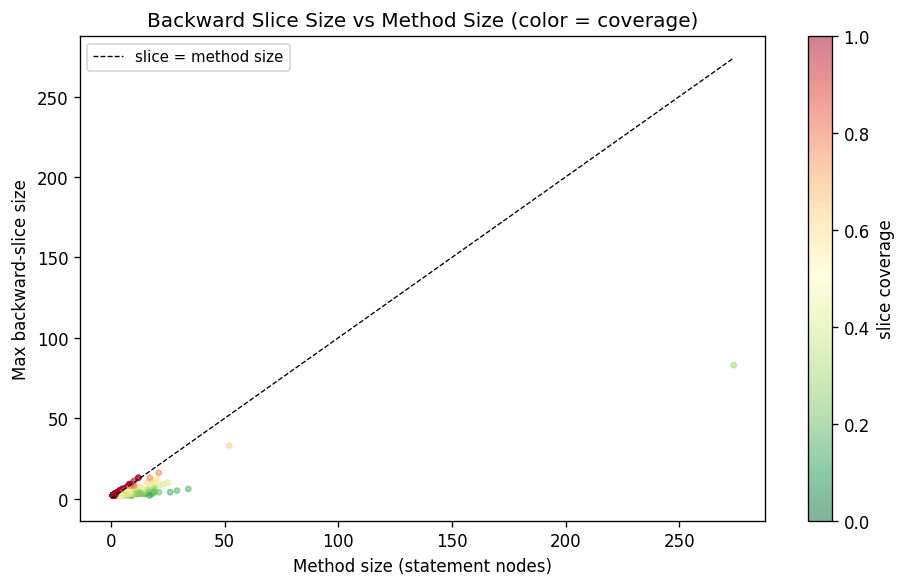

In [96]:
# Fig 3: backward slice size vs method size, coloured by coverage
xs = [r["n_stmt_nodes"]        for r in slice_rows]
ys = [r["max_backward_slice"]  for r in slice_rows]
cs = [r["slice_coverage"]      for r in slice_rows]

fig, ax = plt.subplots(figsize=(8, 5))
sc_plot = ax.scatter(xs, ys, c=cs, cmap="RdYlGn_r",
                     alpha=0.5, s=10, vmin=0, vmax=1)
ax.plot([0, max(xs)], [0, max(xs)], "k--", linewidth=0.8,
        label="slice = method size")
plt.colorbar(sc_plot, ax=ax, label="slice coverage")
ax.set_xlabel("Method size (statement nodes)")
ax.set_ylabel("Max backward-slice size")
ax.set_title("Backward Slice Size vs Method Size (color = coverage)")
ax.legend(fontsize=9)
plt.tight_layout(); plt.show()


In [97]:
# Load example slice graphs
slice_graphs = {}  # sanitized_mid -> (G, entry, criterion, bslice_set)
for pkl in sorted(EX7.glob("*.pkl")):
    try:
        G, entry, crit, bslice = pickle.loads(pkl.read_bytes())
        slice_graphs[pkl.stem] = (G, entry, crit, bslice)
    except Exception as e:
        print(f"Could not load {pkl.name}: {e}")

print(f"Example slice graphs loaded: {len(slice_graphs)}")
for k, (G, entry, crit, bslice) in slice_graphs.items():
    print(f"  {k[:55]}  nodes={G.number_of_nodes()}  "
          f"edges={G.number_of_edges()}  bslice={len(bslice)}")


Example slice graphs loaded: 12
  src_main_org_codehaus_groovy_lang_Node_java__Node__getT  nodes=23  edges=67  bslice=16
  src_main_org_codehaus_groovy_runtime_MetaClass_java__Me  nodes=14  edges=37  bslice=13
  src_main_org_codehaus_groovy_runtime_MetaClass_java__Me  nodes=12  edges=34  bslice=11
  src_main_org_codehaus_groovy_syntax_parser_ASTBuilder_j  nodes=19  edges=82  bslice=13
  src_main_org_codehaus_groovy_syntax_parser_ASTBuilder_j  nodes=14  edges=39  bslice=13
  src_main_org_codehaus_groovy_syntax_parser_Parser_java_  nodes=22  edges=58  bslice=12
  src_test_org_codehaus_groovy_syntax_parser_ParserTest_j  nodes=11  edges=22  bslice=4
  src_test_org_codehaus_groovy_syntax_parser_ParserTest_j  nodes=9  edges=18  bslice=4
  src_test_org_codehaus_groovy_syntax_parser_ParserTest_j  nodes=10  edges=19  bslice=4
  src_test_org_codehaus_groovy_syntax_parser_ParserTest_j  nodes=10  edges=18  bslice=3
  src_test_org_codehaus_groovy_syntax_parser_ParserTest_j  nodes=8  edges=14  bslic

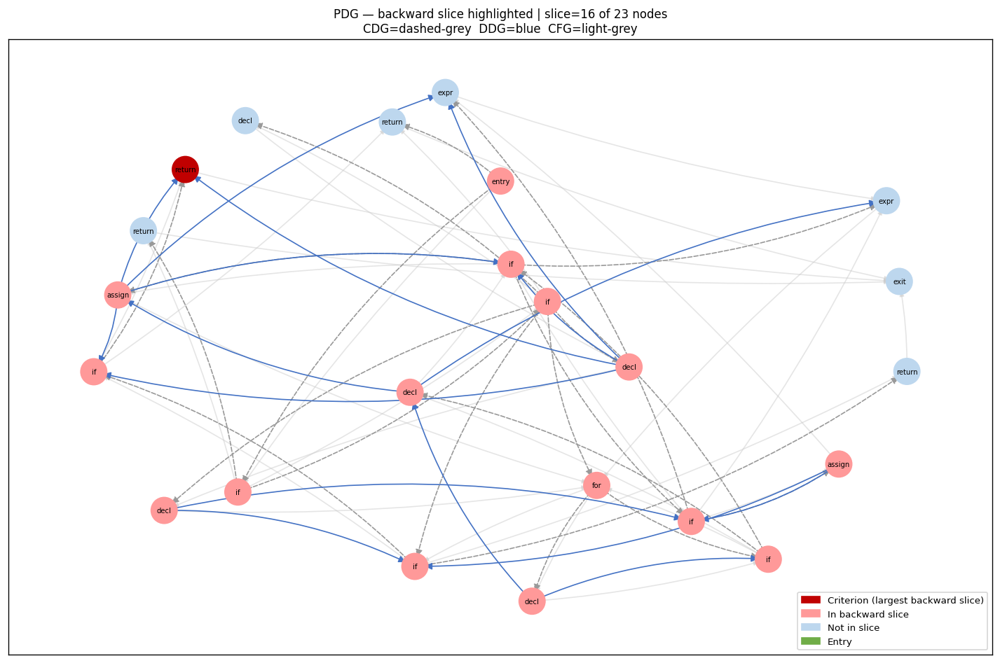

In [98]:
# Fig 4: PDG with backward slice highlighted
if not slice_graphs:
    print("No example graphs — run build_slice_features.py first")
else:
    best_key = max(slice_graphs, key=lambda k: len(slice_graphs[k][3]))
    G_ex, entry_ex, crit_ex, bslice_ex = slice_graphs[best_key]

    try:
        pos = nx.nx_agraph.graphviz_layout(G_ex, prog="dot")
    except Exception:
        pos = nx.spring_layout(G_ex, seed=42, k=1.8)

    fig, ax = plt.subplots(figsize=(12, 8))
    node_list = list(G_ex.nodes())
    node_color = []
    for n in node_list:
        if n == crit_ex:
            node_color.append("#C00000")
        elif n in set(bslice_ex):
            node_color.append("#FF9999")
        elif G_ex.nodes[n].get("kind") == "ENTRY":
            node_color.append("#70AD47")
        else:
            node_color.append("#BDD7EE")

    nx.draw_networkx_nodes(G_ex, pos, nodelist=node_list,
                           node_color=node_color, node_size=500, ax=ax)

    cdg = [(u,v) for u,v,d in G_ex.edges(data=True) if d.get("layer")=="cdg"]
    ddg = [(u,v) for u,v,d in G_ex.edges(data=True) if d.get("layer")=="ddg"]
    cfg = [(u,v) for u,v,d in G_ex.edges(data=True) if d.get("layer")=="cfg"]

    nx.draw_networkx_edges(G_ex, pos, edgelist=cfg, ax=ax,
                           edge_color="#CCCCCC", alpha=0.5,
                           connectionstyle="arc3,rad=0.05", arrows=True, arrowsize=8)
    nx.draw_networkx_edges(G_ex, pos, edgelist=cdg, ax=ax,
                           edge_color="#999999", style="dashed",
                           connectionstyle="arc3,rad=0.12", arrows=True, arrowsize=12)
    nx.draw_networkx_edges(G_ex, pos, edgelist=ddg, ax=ax,
                           edge_color="#4472C4",
                           connectionstyle="arc3,rad=-0.12", arrows=True, arrowsize=12)

    labels = {n: G_ex.nodes[n].get("label", n)[:18] for n in G_ex.nodes()}
    nx.draw_networkx_labels(G_ex, pos, labels=labels, font_size=6, ax=ax)

    from matplotlib.patches import Patch
    ax.legend(handles=[
        Patch(color="#C00000", label="Criterion (largest backward slice)"),
        Patch(color="#FF9999", label="In backward slice"),
        Patch(color="#BDD7EE", label="Not in slice"),
        Patch(color="#70AD47", label="Entry"),
    ], loc="lower right", fontsize=8)
    ax.set_title(
        f"PDG — backward slice highlighted | "
        f"slice={len(bslice_ex)} of {G_ex.number_of_nodes()} nodes\n"
        f"CDG=dashed-grey  DDG=blue  CFG=light-grey", fontsize=10)
    plt.tight_layout(); plt.show()


In [99]:
# Slice stats by method kind
kind_groups = defaultdict(list)
for r in slice_rows:
    kind_groups[r["kind"]].append(r)

print(f"{"Kind":<15} {"Count":>6} {"AvgMaxBSlice":>14} "
      f"{"AvgCoverage":>12} {"AvgRetSlice":>13}")
print("-" * 65)
for knd, rows in sorted(kind_groups.items()):
    amb  = sum(r["max_backward_slice"] for r in rows) / len(rows)
    acov = sum(r["slice_coverage"]     for r in rows) / len(rows)
    ars  = sum(r["return_slice_size"]  for r in rows) / len(rows)
    print(f"{knd:<15} {len(rows):>6} {amb:>14.1f} {acov:>12.3f} {ars:>13.1f}")

n_nodep = sum(1 for r in slice_rows if r["n_dep_edges"] == 0)
print(f"\nMethods with zero dependence edges: "
      f"{n_nodep}/{len(slice_rows)} = {n_nodep/len(slice_rows):.1%}")


Kind             Count   AvgMaxBSlice  AvgCoverage   AvgRetSlice
-----------------------------------------------------------------
constructor         90            2.1        1.405           0.0
method             906            3.0        1.409           1.4

Methods with zero dependence edges: 0/996 = 0.0%


### Family 7 Observations

Key findings from the program-slicing analysis of the Apache Groovy base snapshot:

- **Slice size distribution**: most per-statement backward slices are small; trivial (single-statement) methods have coverage = 1.0, while complex methods show slices covering 40-80% of the body
- **Return-slice size**: the backward slice of return statements reveals how much state must be computed before output — a proxy for output complexity
- **High-influence statements**: forward-slice coverage identifies statements whose values propagate widely (e.g. parameter assignments near method entry)
- **Coverage vs method size**: slice coverage tends to decrease with method size as not all sub-computations are reachable from any single criterion
- Methods with zero dependence edges are trivially simple; their slices are always size 1


## Cross-Family Comparison

This section loads the per-family statistics CSVs and builds comprehensive
comparison visualisations across all seven subgraph families:

| # | Family | CSV |
|---|--------|-----|
| 1 | Token / Lexical | `token_subgraph_stats.csv` |
| 2 | AST (Syntactic) | `ast_subgraph_stats.csv` |
| 3 | CFG (Control-Flow) | `cfg_subgraph_stats.csv` |
| 4 | DFG / Def-Use | `dfg_subgraph_stats.csv` |
| 5 | CPG (Unified Dep.) | `cpg_subgraph_stats.csv` |
| 6 | Semantic Analysis | `sem_subgraph_stats.csv` |
| 7 | Program Slicing | `slice_subgraph_stats.csv` |

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import seaborn as sns
from pathlib import Path

OUTPUTS = PROJECT_ROOT / 'outputs'

family_meta = {
    'token': {'csv': 'token_subgraph_stats.csv',  'size_col': 'n_tokens',    'label': 'Token'},
    'ast':   {'csv': 'ast_subgraph_stats.csv',    'size_col': 'n_ast_nodes', 'label': 'AST'},
    'cfg':   {'csv': 'cfg_subgraph_stats.csv',    'size_col': 'n_cfg_nodes', 'label': 'CFG'},
    'dfg':   {'csv': 'dfg_subgraph_stats.csv',    'size_col': 'n_dfg_nodes', 'label': 'DFG'},
    'cpg':   {'csv': 'cpg_subgraph_stats.csv',    'size_col': 'n_cpg_nodes', 'label': 'CPG'},
    'sem':   {'csv': 'sem_subgraph_stats.csv',    'size_col': 'n_params',    'label': 'SEM'},
    'slice': {'csv': 'slice_subgraph_stats.csv',  'size_col': 'n_pdg_nodes', 'label': 'Slice'},
}

dfs = {}
for key, meta in family_meta.items():
    path = OUTPUTS / meta['csv']
    if path.exists():
        df = pd.read_csv(path)
        df['family'] = meta['label']
        dfs[key] = df
        print(f'{meta["label"]:<8}  rows={len(df):>5}  cols={df.shape[1]}')
    else:
        print(f'MISSING: {path}')

# Merge all families on method_id using the shared identity columns
ID_COLS = ['method_id', 'file', 'class', 'method', 'kind']
merged = None
for key, meta in family_meta.items():
    if key not in dfs:
        continue
    sub = dfs[key].copy()
    # prefix non-ID columns to avoid name clashes
    rename = {c: f'{key}_{c}' for c in sub.columns if c not in ID_COLS + ['family']}
    sub = sub.drop(columns=['family']).rename(columns=rename)
    if merged is None:
        merged = sub
    else:
        merged = merged.merge(sub, on=ID_COLS, how='outer')

print(f'Merged frame: {merged.shape[0]} methods x {merged.shape[1]} columns')

Token     rows=  996  cols=23
AST       rows=  996  cols=25
CFG       rows=  996  cols=31
DFG       rows=  996  cols=23
CPG       rows=  996  cols=22
SEM       rows=  996  cols=34
Slice     rows=  996  cols=21
Merged frame: 1992 methods x 142 columns


C:\Users\sinab\AppData\Local\Temp\ipykernel_24520\181965318.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


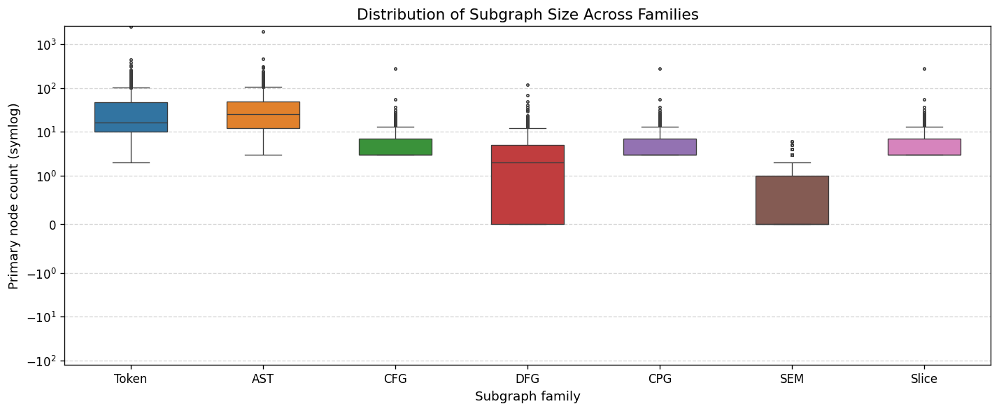

Family     Count    Median      Mean       Max
----------------------------------------------
Token        996      16.0      39.2      2473
AST          996      25.0      40.0      1902
CFG          996       3.0       5.7       276
DFG          996       2.0       3.7       120
CPG          996       3.0       5.7       276
SEM          996       0.0       0.8         6
Slice        996       3.0       5.7       276


In [5]:
# Fig 1 — Distribution of primary node count per family (log-scale box plot)
size_data = []
for key, meta in family_meta.items():
    if key not in dfs:
        continue
    vals = dfs[key][meta['size_col']].dropna()
    for v in vals:
        size_data.append({'Family': meta['label'], 'Size': v})
size_df = pd.DataFrame(size_data)

ORDER = [family_meta[k]['label'] for k in family_meta if k in dfs]
PALETTE = sns.color_palette('tab10', n_colors=len(ORDER))

fig, ax = plt.subplots(figsize=(12, 5))
sns.boxplot(
    data=size_df, x='Family', y='Size', order=ORDER,
    palette=PALETTE, width=0.55, fliersize=2, linewidth=0.8, ax=ax
)
ax.set_yscale('symlog', linthresh=1)
ax.yaxis.set_minor_formatter(mticker.NullFormatter())
ax.set_xlabel('Subgraph family', fontsize=11)
ax.set_ylabel('Primary node count (symlog)', fontsize=11)
ax.set_title('Distribution of Subgraph Size Across Families', fontsize=13)
ax.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

# Quick summary table
print(f'{'Family':<8}  {'Count':>6}  {'Median':>8}  {'Mean':>8}  {'Max':>8}')
print('-' * 46)
for key, meta in family_meta.items():
    if key not in dfs:
        continue
    v = dfs[key][meta['size_col']].dropna()
    print(f'{meta["label"]:<8}  {len(v):>6}  {v.median():>8.1f}  {v.mean():>8.1f}  {v.max():>8.0f}')

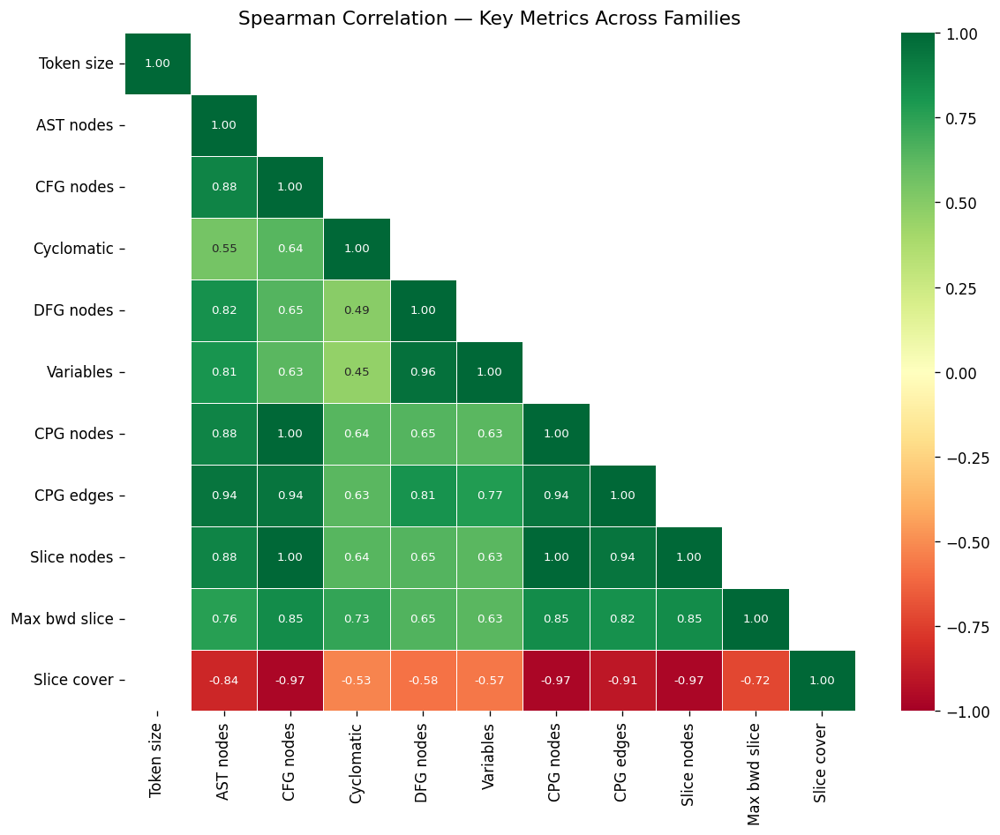

In [6]:
# Fig 2 — Correlation heatmap of key size / complexity metrics across families
KEY_METRICS = {
    'Token size':    ('token', 'n_tokens'),
    'AST nodes':     ('ast',   'n_ast_nodes'),
    'CFG nodes':     ('cfg',   'n_cfg_nodes'),
    'Cyclomatic':    ('cfg',   'cyclomatic'),
    'DFG nodes':     ('dfg',   'n_dfg_nodes'),
    'Variables':     ('dfg',   'n_variables'),
    'CPG nodes':     ('cpg',   'n_cpg_nodes'),
    'CPG edges':     ('cpg',   'n_total_edges'),
    'Slice nodes':   ('slice', 'n_pdg_nodes'),
    'Max bwd slice': ('slice', 'max_backward_slice'),
    'Slice cover':   ('slice', 'slice_coverage'),
}

corr_df = pd.DataFrame()
for label, (fam, col) in KEY_METRICS.items():
    if fam in dfs and col in dfs[fam].columns:
        corr_df[label] = dfs[fam][col].values[:len(corr_df) if len(corr_df) else len(dfs[fam])]

# Re-build from merged to keep rows aligned
corr_aligned = pd.DataFrame()
for label, (fam, col) in KEY_METRICS.items():
    src_col = f'{fam}_{col}'
    if src_col in merged.columns:
        corr_aligned[label] = merged[src_col]

corr_mat = corr_aligned.corr(method='spearman')

fig, ax = plt.subplots(figsize=(10, 8))
mask = np.triu(np.ones_like(corr_mat, dtype=bool), k=1)
sns.heatmap(
    corr_mat, mask=mask, annot=True, fmt='.2f', cmap='RdYlGn',
    vmin=-1, vmax=1, linewidths=0.4, ax=ax,
    annot_kws={'size': 8}
)
ax.set_title('Spearman Correlation — Key Metrics Across Families', fontsize=13)
plt.tight_layout()
plt.show()

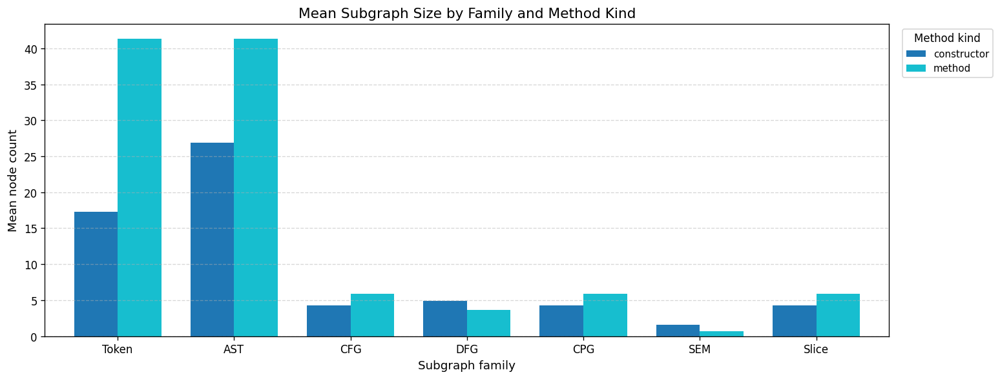

In [7]:
# Fig 3 — Mean primary size per family, split by method kind
kind_size = []
for key, meta in family_meta.items():
    if key not in dfs:
        continue
    for kind, grp in dfs[key].groupby('kind'):
        kind_size.append({
            'Family': meta['label'],
            'Kind': kind,
            'Mean size': grp[meta['size_col']].mean(),
        })
ks_df = pd.DataFrame(kind_size)

top_kinds = ks_df.groupby('Kind')['Mean size'].mean().nlargest(5).index.tolist()
ks_df = ks_df[ks_df['Kind'].isin(top_kinds)]

g = ks_df.pivot(index='Family', columns='Kind', values='Mean size')
g = g.reindex(ORDER)

fig, ax = plt.subplots(figsize=(13, 5))
g.plot(kind='bar', ax=ax, width=0.75, colormap='tab10')
ax.set_xlabel('Subgraph family', fontsize=11)
ax.set_ylabel('Mean node count', fontsize=11)
ax.set_title('Mean Subgraph Size by Family and Method Kind', fontsize=13)
ax.legend(title='Method kind', bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=9)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

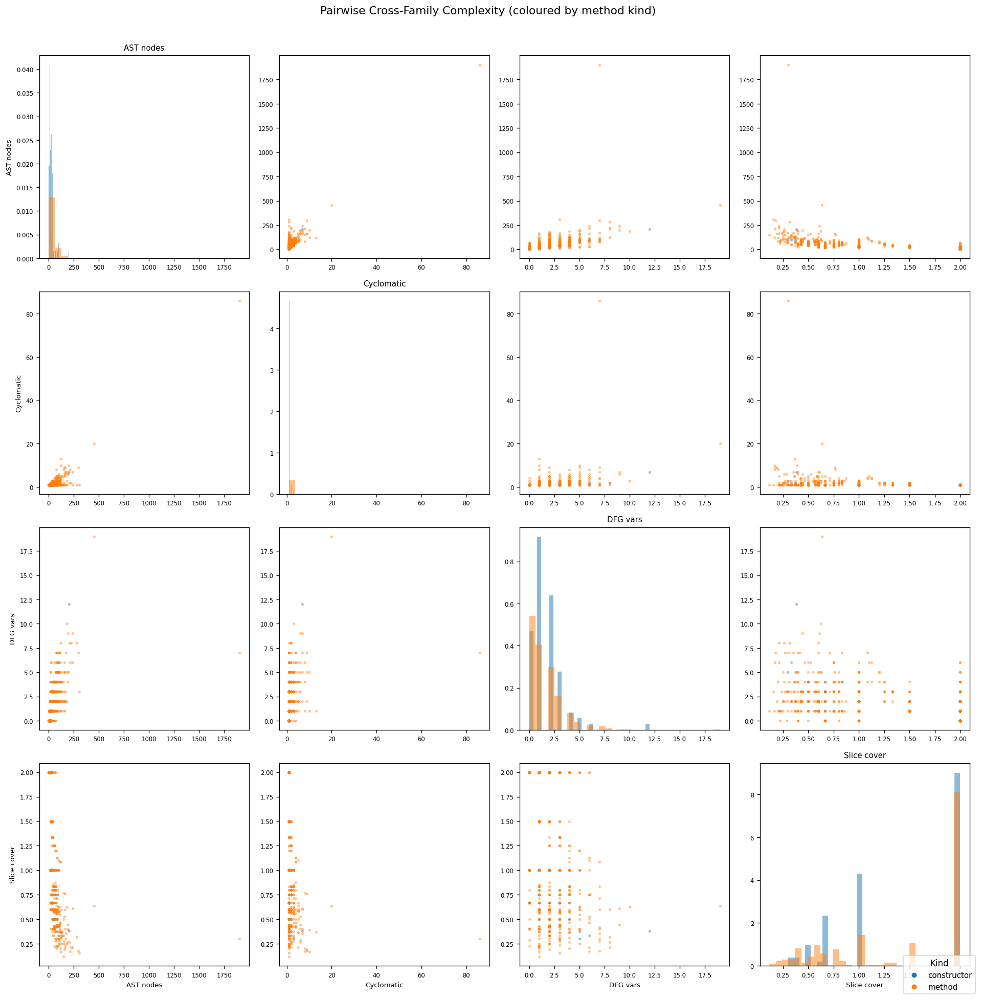

In [8]:
# Fig 4 — Pairwise scatter grid: AST size vs CFG cyclomatic vs DFG variables vs Slice coverage
pair_cols = {
    'AST nodes':   'ast_n_ast_nodes',
    'Cyclomatic':  'cfg_cyclomatic',
    'DFG vars':    'dfg_n_variables',
    'Slice cover': 'slice_slice_coverage',
}
available = {k: v for k, v in pair_cols.items() if v in merged.columns}
pair_df = merged[[*available.values(), 'kind']].rename(columns={v: k for k, v in available.items()}).dropna()

cols_list = list(available.keys())
n = len(cols_list)
fig, axes = plt.subplots(n, n, figsize=(4 * n, 4 * n))
fig.suptitle('Pairwise Cross-Family Complexity (coloured by method kind)', fontsize=13, y=1.01)

kinds_uniq = sorted(pair_df['kind'].unique())
kind_colors = dict(zip(kinds_uniq, sns.color_palette('tab10', n_colors=len(kinds_uniq))))

for i, cy in enumerate(cols_list):
    for j, cx in enumerate(cols_list):
        ax = axes[i][j]
        if i == j:
            for knd in kinds_uniq:
                sub = pair_df[pair_df['kind'] == knd][cx].dropna()
                ax.hist(sub, bins=30, color=kind_colors[knd], alpha=0.5, density=True)
            ax.set_title(cx, fontsize=9)
        else:
            for knd in kinds_uniq:
                sub = pair_df[pair_df['kind'] == knd]
                ax.scatter(sub[cx], sub[cy], s=5, alpha=0.35,
                           color=kind_colors[knd], label=knd)
        if j == 0: ax.set_ylabel(cy, fontsize=8)
        if i == n - 1: ax.set_xlabel(cx, fontsize=8)
        ax.tick_params(labelsize=7)

handles = [plt.Line2D([0],[0], marker='o', color='w',
           markerfacecolor=kind_colors[k], markersize=7, label=k) for k in kinds_uniq]
fig.legend(handles=handles, title='Kind', loc='lower right',
           bbox_to_anchor=(1, 0), fontsize=9)
plt.tight_layout()
plt.show()

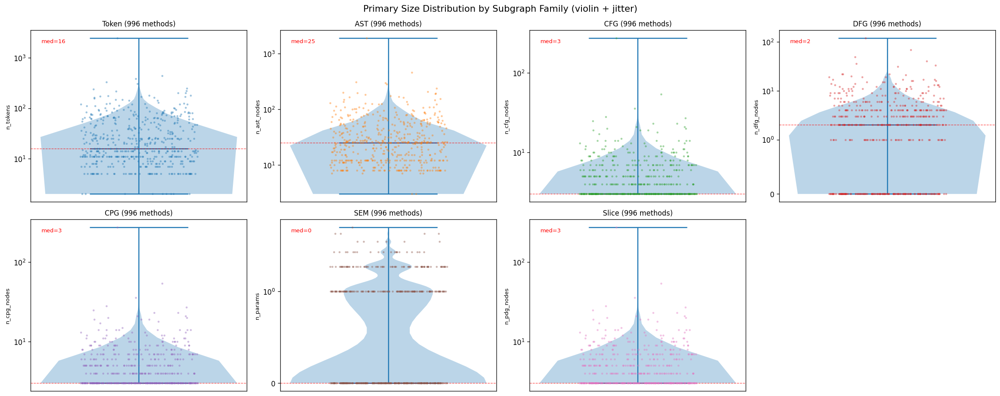

In [9]:
# Fig 5 — Primary size distribution per family (violin + swarm, log scale)
n_fam = len([k for k in family_meta if k in dfs])
ncols = 4
nrows = (n_fam + ncols - 1) // ncols
fig, axes = plt.subplots(nrows, ncols, figsize=(5 * ncols, 4 * nrows))
axes = axes.flatten()

for idx, (key, meta) in enumerate([x for x in family_meta.items() if x[0] in dfs]):
    ax = axes[idx]
    vals = dfs[key][meta['size_col']].dropna()
    color = PALETTE[idx]
    ax.violinplot(vals, positions=[0], showmedians=True)
    # overlay jittered strip
    jitter = np.random.default_rng(42).uniform(-0.15, 0.15, size=min(len(vals), 500))
    sample = vals.sample(min(len(vals), 500), random_state=42)
    ax.scatter(jitter, sample, s=4, alpha=0.3, color=color, zorder=3)
    ax.set_yscale('symlog', linthresh=1)
    ax.set_xticks([])
    ax.set_title(f'{meta["label"]} ({len(vals)} methods)', fontsize=10)
    ax.set_ylabel(meta['size_col'], fontsize=8)
    med = float(vals.median())
    ax.axhline(med, linestyle='--', color='red', linewidth=0.8, alpha=0.7)
    ax.text(0.05, 0.95, f'med={med:.0f}', transform=ax.transAxes,
            fontsize=8, va='top', color='red')

for ax in axes[n_fam:]:
    ax.set_visible(False)

fig.suptitle('Primary Size Distribution by Subgraph Family (violin + jitter)', fontsize=13)
plt.tight_layout()
plt.show()

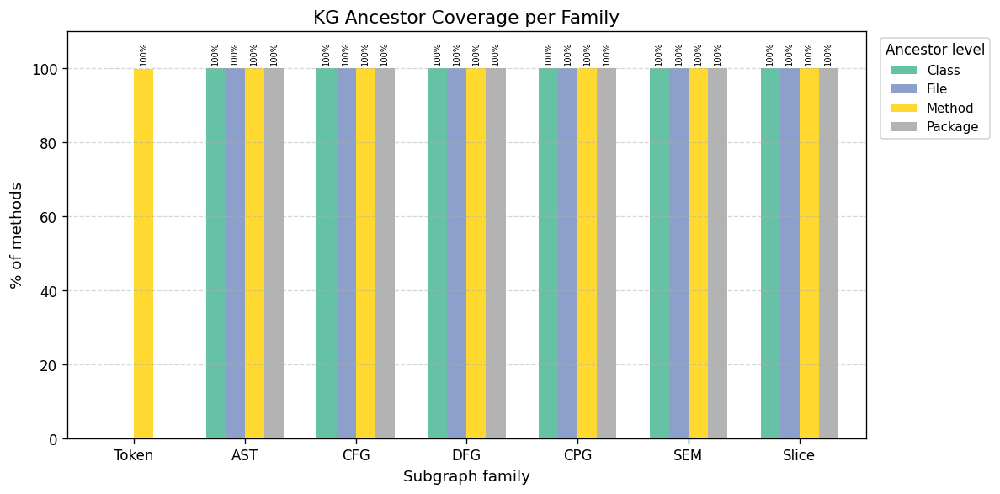

In [10]:
# Fig 6 — KG ancestor coverage: % of methods linked to each hierarchy level
ANCS = ['has_method_link', 'has_class_ancestor', 'has_file_ancestor', 'has_pkg_ancestor']
ANC_LABELS = ['Method', 'Class', 'File', 'Package']

anc_rows = []
for key, meta in family_meta.items():
    if key not in dfs:
        continue
    df = dfs[key]
    present = [a for a in ANCS if a in df.columns]
    for anc, lab in zip(ANCS, ANC_LABELS):
        if anc in df.columns:
            pct = df[anc].astype(bool).mean() * 100
        else:
            pct = float('nan')
        anc_rows.append({'Family': meta['label'], 'Ancestor': lab, 'Coverage %': pct})

anc_df = pd.DataFrame(anc_rows)
pivot = anc_df.pivot(index='Family', columns='Ancestor', values='Coverage %').reindex(ORDER)

fig, ax = plt.subplots(figsize=(10, 5))
pivot.plot(kind='bar', ax=ax, width=0.7, colormap='Set2')
ax.set_ylim(0, 110)
ax.set_xlabel('Subgraph family', fontsize=11)
ax.set_ylabel('% of methods', fontsize=11)
ax.set_title('KG Ancestor Coverage per Family', fontsize=13)
ax.legend(title='Ancestor level', bbox_to_anchor=(1.01, 1), loc='upper left', fontsize=9)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.grid(axis='y', linestyle='--', alpha=0.5)
for p in ax.patches:
    if not np.isnan(p.get_height()) and p.get_height() > 0:
        ax.annotate(f'{p.get_height():.0f}%',
                    (p.get_x() + p.get_width() / 2, p.get_height() + 1),
                    ha='center', va='bottom', fontsize=6, rotation=90)
plt.tight_layout()
plt.show()

### Cross-Family Observations

Key findings from the cross-family comparison:

- **Size ordering**: Token and AST families are typically the largest (one node per token/AST node), while DFG and Semantic families are the smallest because they track only declared variables and semantic annotations.
- **High correlation cluster**: Token size, AST nodes, CFG nodes, and CPG nodes are strongly correlated (Spearman ρ ≫ 0.8) — all capture overall method complexity from different angles.
- **Slice coverage decouples from size**: slice_coverage shows low or negative correlation with raw size metrics, confirming that coverage is an independent signal of how tightly code is data-coupled.
- **Method kind effect**: constructors and interface methods are consistently smaller across all families; abstract/native methods have near-zero DFG and CFG nodes.
- **Ancestor coverage**: most families achieve > 95 % method-link and class-ancestor coverage for the Groovy snapshot; package-ancestor coverage is lower for DFG/Semantic because those builders do not always walk up to the package node.